# Permutation of source time courses for testing

In [58]:
import os
from pathlib import Path
import sys
from mne.datasets import fetch_fsaverage
from tabulate import tabulate
import random
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import ipyparallel as ipp

fs_dir = fetch_fsaverage(verbose=True)
subject = "fsaverage"
subjects_dir = os.path.dirname(fs_dir)
#will need to change the path below
sys.path.append("C:/Users/EISERK01/eeg-projects/Code/eeg_toolkit")
from eeg_toolkit import preprocess, utils
import eeg_toolkit.functional_connectivity as fc
import eeg_toolkit.permutation_testing as pt

0 files missing from root.txt in /home/wanglab/mne_data/MNE-fsaverage-data
0 files missing from bem.txt in /home/wanglab/mne_data/MNE-fsaverage-data/fsaverage


### Paths

In [60]:
# Settings
times_tup, time_win_path = preprocess.get_time_window(5)

#preprocessing method
sl_method = 'MNE'

# data paths
data_dir = Path("../../Data")
processed_data_path = data_dir / "Processed Data"
stc_path = data_dir / f"Source Time Courses ({sl_method})"
EO_resting_data_path = stc_path / "Eyes Open"
EC_resting_data_path = stc_path / "Eyes Closed"
zscored_epochs_data_path = stc_path / "zscored_Epochs" / time_win_path

[-2.5,0.0,2.5]


### Manually enter age/sex matched subjects

In [61]:
# All CP and HC subs
sub_ids_CP = [  
    '018',  
    '020',  
    '021',  
    '027',  
    '031',  
    '032',  
    '033',  
    '035',  
    '036',  
    '037',  
    '038',  
    '040',  
    '043',  
    '044',  
    '048',  
    '049',  
    '050',  
    '057',  
    '059',
]

sub_ids_HC = [
    'C10',  
    'C11',  
    'C12',  
    'C13',  
    'C14',  
    'C15',  
    'C16',  
    'C17',  
    'C18',  
    'C19',  
    'C2.',  
    'C24',  
    'C25',  
    'C26',  
    'C27',  
    'C3.',  
    'C6.',  
    'C7.',  
    'C9.'   
]
  
sub_ids = sub_ids_CP + sub_ids_HC

# CP Subs with widespread pain
sub_ids_WSP = [
    '018',
    '022',
    '024',
    '031',
    '032',
    '034',
    '036',
    '039',
    '040',
    '045',
    '046',
    '052',
]

# CP Subs with localized pain
sub_ids_LP = [  
    '020',  
    '021',  
    '023',  
    '029',  
    '031',  
    '037',  
    '041',  
    '042',  
    '048',  
    '049',  
    '050',  
    '056'  
]  

### Low Back Pain Laterality

In [62]:
left_pain_ids = [
    '016',
    '017',
    '018',
    '019',
    '020',
    '023',
    '024',
    '025',
    '027',
    '028',
    '029',
    '030',
    '032',
    '033',
    '036',
    '038',
    '045',
    '052',
    '054',
    '055',
    '057',
    '058',
]

right_pain_ids = [
    '021',
    '026',
    '031',
    '037',
    '039',
    '043',
    '044',
    '046',
    '047',
    '048',
    '049',
    '050',
    '051',
    '053',
    '056',
]

bilateral_pain_ids = [
    '022',
    '034',
    '035',
    '040',
    '041',
    '042',
    '059',
]

# Randomly assign healthy subjects to left/right/bilateral pain
lst = sub_ids_HC
random.seed(42)
left_pain_ids.extend(random.sample(lst, 8))
lst = [i for i in lst if i not in left_pain_ids]  

# Randomly assign 8 elements to right and remove them from lst  
right_pain_ids.extend(random.sample(lst, 8))
lst = [i for i in lst if i not in right_pain_ids]  
  
# Assign the remaining elements to bilateral  
bilateral_pain_ids.extend(lst)  

In [63]:
for sub_ids, group in zip([sub_ids_CP, sub_ids_WSP, sub_ids_LP, sub_ids_HC],"CP WSP LP HC".split()):
    print(f"\n{group}")
    for sub_pain_ids, laterality in zip([left_pain_ids, right_pain_ids, bilateral_pain_ids],"Left Right Bilateral".split()):
        print(f"{laterality} - {len(set(sub_ids) & set(sub_pain_ids))}")
        print(set(sub_ids) & set(sub_pain_ids))


CP
Left - 8
{'018', '032', '033', '027', '036', '020', '038', '057'}
Right - 8
{'050', '048', '044', '037', '043', '021', '049', '031'}
Bilateral - 3
{'040', '035', '059'}

WSP
Left - 6
{'018', '032', '036', '024', '052', '045'}
Right - 3
{'031', '039', '046'}
Bilateral - 3
{'040', '022', '034'}

LP
Left - 3
{'023', '020', '029'}
Right - 7
{'050', '048', '037', '021', '049', '031', '056'}
Bilateral - 2
{'042', '041'}

HC
Left - 8
{'C24', 'C17', 'C11', 'C12', 'C18', 'C13', 'C10', 'C9.'}
Right - 8
{'C27', 'C14', 'C26', 'C15', 'C25', 'C7.', 'C3.', 'C6.'}
Bilateral - 3
{'C2.', 'C19', 'C16'}


In [64]:
# Exclude HEALTHY subjects with widespread pain
widespread_pain_HC = ['C1.','C23']
sub_ids_HC = [sub for sub in sub_ids_HC if sub not in widespread_pain_HC]

In [65]:
print(f"Chronics (all): {len(sub_ids_CP)}")
print([el for el in sub_ids_CP])
print(f"Chronics with widespread pain: {len(sub_ids_WSP)}")
print([el for el in sub_ids_WSP])
print(f"Chronics with localized pain: {len(sub_ids_LP)}")
print([sub for sub in sub_ids_LP])
print(f"Controls: {len(sub_ids_HC)}")
print([el for el in sub_ids_HC])
print(f"\nTotal (Chronics + Controls): {len(sub_ids)}")

Chronics (all): 19
['018', '020', '021', '027', '031', '032', '033', '035', '036', '037', '038', '040', '043', '044', '048', '049', '050', '057', '059']
Chronics with widespread pain: 12
['018', '022', '024', '031', '032', '034', '036', '039', '040', '045', '046', '052']
Chronics with localized pain: 12
['020', '021', '023', '029', '031', '037', '041', '042', '048', '049', '050', '056']
Controls: 19
['C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19', 'C2.', 'C24', 'C25', 'C26', 'C27', 'C3.', 'C6.', 'C7.', 'C9.']

Total (Chronics + Controls): 19


### Permute source space time signal, repeat 100

In [66]:
# this_sub_ids = sub_ids_CP

In [67]:
repetitions = 100 #takes forever, switch to a smaller number for testing

In [68]:
for j in range(0, repetitions):
# Loop over each group
    for this_sub_ids in [
        sub_ids_CP, 
        sub_ids_WSP, 
        sub_ids_LP, 
        sub_ids_HC,
        ]:
        for sub_id in this_sub_ids:
            count = 1

            # Load the original z-scored epochs data, eyes open data, eyes closed data
            label_ts = utils.unpickle_data(zscored_epochs_data_path, f"{sub_id}_epochs.pkl")
            eo_data = utils.unpickle_data(EO_resting_data_path, f"{sub_id}_eyes_open.pkl")
            ec_data = utils.unpickle_data(EC_resting_data_path, f"{sub_id}_eyes_closed.pkl")

            # Permute the signals one epoch at a time
            for i,el in enumerate(label_ts):
                #print(f"Epoch {i}:",el.shape)
                
                # Create the surrogate data for zscored_epochs
                surrogate_data = pt.create_surrogate_data(el)
                
                # Replace the original data with the surrogate data
                label_ts[i] = surrogate_data

            # Create the surrogate data for eyes open, replace original data with surrogate
            surrogate_data = pt.create_surrogate_data(eo_data)
            eo_data = surrogate_data

            # Create the surrogate data for eyes closed, replace original data with surrogate
            surrogate_data = pt.create_surrogate_data(ec_data)
            ec_data = surrogate_data    
            
            # Save the surrogate data
            subset = "FFT Permuted Data " + str(j+1)
            #make zcored_epochs save path
            fc_subset_path = stc_path / subset / "zscored_Epochs" / time_win_path
            save_path = fc_subset_path
            os.makedirs(save_path, exist_ok=True)
            utils.pickle_data(save_path, f"{sub_id}_epochs.pkl", label_ts)

            #make eyes open save path
            fc_subset_path = stc_path / subset / "Eyes Open"
            save_path = fc_subset_path
            os.makedirs(save_path, exist_ok=True)
            utils.pickle_data(save_path, f"{sub_id}_eyes_open.pkl", eo_data)

            #make eyes closed save path
            fc_subset_path = stc_path / subset / "Eyes Closed"
            save_path = fc_subset_path
            os.makedirs(save_path, exist_ok=True)
            utils.pickle_data(save_path, f"{sub_id}_eyes_closed.pkl", ec_data)

            # Clear display
            utils.clear_display()
            # break

KeyboardInterrupt: 

### Settings for conditions/bands/methods

In [ ]:
# Settings

# Include intermediate stimulus?
include_LS = False

# Data properties
sfreq = 400  # Hz
tmin, tmax = 0.0, 1.25  # exclude the baseline period for connectivity estimation

# Choose which connectivity estimates to run. "amplitude", "phase", or "both"
# method_choice = "phase"
method_choice = "both"

# Load previously saved group data
# load_group_data_flag = True
load_group_data_flag = False

# Save group data?
save_group_data_flag = False
# save_group_data_flag = True
   
# Evoked only or include resting too?
# include_resting = False
include_resting = True


### Define ROIs, frequency bands, conditions, and methods for FC

In [ ]:
####################################################################
# REGIONS OF INTEREST
roi_names = [  # Left
    "rostralanteriorcingulate-lh",  # Left Rostral ACC
    "caudalanteriorcingulate-lh",  # Left Caudal ACC
    "postcentral-lh",  # Left S1,
    "insula-lh",
    "superiorfrontal-lh",  # Left Insula, Left DL-PFC,
    "medialorbitofrontal-lh",  # Left Medial-OFC
    # Right
    "rostralanteriorcingulate-rh",  # Right Rostral ACC
    "caudalanteriorcingulate-rh",  # Right Caudal ACC
    "postcentral-rh",  # , Right S1
    "insula-rh",
    "superiorfrontal-rh",  # Right Insula, Right DL-PFC
    "medialorbitofrontal-rh",
]  # Right Medial-OFC

# Write out ROI names as acronyms
roi_acronyms = ["rACC-lh", "dACC-lh", "S1-lh", "insula-lh", "dlPFC-lh", "mOFC-lh",
                "rACC-rh", "dACC-rh", "S1-rh", "insula-rh", "dlPFC-rh", "mOFC-rh"]

####################################################################
# BANDS OF INTEREST
Freq_Bands = {
    # 'delta': [0, 4],
    "theta": [4.0, 8.0],
    "alpha": [8.0, 13.0],
    "beta": [13.0, 30.0],
    "low-gamma": [30.0, 58.5],
    # "notch": [58.5, 61.5],
    "high-gamma": [61.5, 100.0],
}

band_names = [band for band in Freq_Bands]

####################################################################
# CONNECTIVITY METHODS
if method_choice == "phase":
    con_methods = ["wpli2_debiased",
                ]
elif method_choice == "amplitude":
    con_methods = [
        # "aec_pairwise",
        "aec_symmetric",
        ]
elif method_choice == "both":
    con_methods = [
    "wpli2_debiased",
    # "aec_pairwise",
    "aec_symmetric", # keep only symmetric for now
    ]
    
####################################################################
# CONDITIONS
conditions = (
    [
        "Hand 32 mN",
        "Hand 128 mN",
        "Hand 256 mN",
        "Back 32 mN",
        "Back 128 mN",
        "Back 256 mN",
        "Eyes Open",
        "Eyes Closed",
    ]
    if include_LS
    else [
        # "Hand 32 mN",
        # 'Hand LS',
        "Hand 256 mN",
        # "Back 32 mN",
        # 'Back LS',
        # "Back 256 mN",
        "Eyes Open",
        # "Eyes Closed",
    ]
)

# Choose to exclude resting state data
conditions = conditions if include_resting else [
    c for c in conditions if "Eyes" not in c
]

####################################################################
# CONDITION DICTIONARY
condition_dict = {
        "Hand 32 mN": 0,
        'Hand LS': 1,
        "Hand 256 mN": 2,
        "Back 32 mN": 3,
        'Back LS': 4,
        "Back 256 mN": 5,
        "Eyes Open": 6,
        "Eyes Closed": 7,
}

### Compute functional connectivity for each subject in each group (surrogate data)

In [ ]:
all_sub_con_CP = []

# loop through all surrogate data
for i in range(0, repetitions):
    processed_data_path = data_dir / "Processed Data"
    stc_parent_path = data_dir / f"Source Time Courses ({sl_method})"
    stc_path = stc_parent_path / f"FFT Permuted Data {i+1}"
    print(stc_path)
    EO_resting_data_path = stc_path / "Eyes Open"
    EC_resting_data_path = stc_path / "Eyes Closed"
    zscored_epochs_data_path = stc_path / "zscored_Epochs" / time_win_path

    # Chronics (all) group
    if not load_group_data_flag:
        sub_con_CP = {}
        for sub_id in sub_ids_CP:
            #print(sub_id)
            sub_avg_cons = fc.compute_sub_avg_con(
                sub_id,
                "Chronic Pain",
                processed_data_path,
                zscored_epochs_data_path,
                EO_resting_data_path,
                EC_resting_data_path,
                con_methods,
                conditions,
                condition_dict,
                roi_names,
                roi_acronyms,
                Freq_Bands,
                tmin,
                tmax,
                sfreq,
                left_pain_ids=left_pain_ids,
                right_pain_ids=right_pain_ids,
                bilateral_pain_ids=bilateral_pain_ids,
                include_LS=include_LS,
            )
            
            sub_con_CP[sub_id] = sub_avg_cons
        all_sub_con_CP.append(sub_con_CP)
    utils.clear_display()

..\..\Data\Source Time Courses (MNE)\FFT Permuted Data 100
Reading stimulus labels and pain ratings for Subject 018...

*stim_labels length = 73*
*pain_ratings_raw length = 73*

Left pain, -rh is already contralateral

Computing wpli2_debiased Hand 256 mN theta for 018...
+----------------+----------------+
| Subject        | 018            |
+----------------+----------------+
| Condition      | Hand 256 mN    |
+----------------+----------------+
| Num. of epochs | 20             |
+----------------+----------------+
| Band           | theta          |
+----------------+----------------+
| Method         | wpli2_debiased |
+----------------+----------------+
Connectivity computation...
only using indices for lower-triangular matrix
    computing connectivity for 66 connections
    using t=0.000s..1.250s for estimation (501 points)
    frequencies: 4.8Hz..8.0Hz (5 points)
    connectivity scores will be averaged for each band
    Using multitaper spectrum estimation with 7 DPSS window

In [ ]:
all_sub_con_HC = []

# loop through all surrogate data
for i in range(0, repetitions):
    processed_data_path = data_dir / "Processed Data"
    stc_parent_path = data_dir / f"Source Time Courses ({sl_method})"
    stc_path = stc_parent_path / f"FFT Permuted Data {i+1}"
    print(stc_path)
    EO_resting_data_path = stc_path / "Eyes Open"
    EC_resting_data_path = stc_path / "Eyes Closed"
    zscored_epochs_data_path = stc_path / "zscored_Epochs" / time_win_path

    # Healthy Control group
    if not load_group_data_flag:
        sub_con_HC = {}
        for sub_id in sub_ids_HC:
            #print(sub_id)
            sub_avg_cons = fc.compute_sub_avg_con(
                sub_id,
                "Healthy Controls",
                processed_data_path,
                zscored_epochs_data_path,
                EO_resting_data_path,
                EC_resting_data_path,
                con_methods,
                conditions,
                condition_dict,
                roi_names,
                roi_acronyms,
                Freq_Bands,
                tmin,
                tmax,
                sfreq,
                left_pain_ids=left_pain_ids,
                right_pain_ids=right_pain_ids,
                bilateral_pain_ids=bilateral_pain_ids,
                include_LS=include_LS,
            )
            sub_con_HC[sub_id] = sub_avg_cons
        all_sub_con_HC.append(sub_con_HC)
    utils.clear_display()

..\..\Data\Source Time Courses (MNE)\FFT Permuted Data 100
Reading stimulus labels and pain ratings for Subject C10...

*stim_labels length = 57*
*pain_ratings_raw length = 57*

Left pain, -rh is already contralateral

Computing wpli2_debiased Hand 256 mN theta for C10...
+----------------+----------------+
| Subject        | C10            |
+----------------+----------------+
| Condition      | Hand 256 mN    |
+----------------+----------------+
| Num. of epochs | 10             |
+----------------+----------------+
| Band           | theta          |
+----------------+----------------+
| Method         | wpli2_debiased |
+----------------+----------------+
Connectivity computation...
only using indices for lower-triangular matrix
    computing connectivity for 66 connections
    using t=0.000s..1.250s for estimation (501 points)
    frequencies: 4.8Hz..8.0Hz (5 points)
    connectivity scores will be averaged for each band
    Using multitaper spectrum estimation with 7 DPSS window

In [ ]:
all_sub_con_WSP = []

# loop through all surrogate data
for i in range(0, repetitions):
    processed_data_path = data_dir / "Processed Data"
    stc_parent_path = data_dir / f"Source Time Courses ({sl_method})"
    stc_path = stc_parent_path / f"FFT Permuted Data {i+1}"
    print(stc_path)
    EO_resting_data_path = stc_path / "Eyes Open"
    EC_resting_data_path = stc_path / "Eyes Closed"
    zscored_epochs_data_path = stc_path / "zscored_Epochs" / time_win_path

    # CLBP with WSP
    if not load_group_data_flag:
        sub_con_WSP = {}
        for sub_id in sub_ids_WSP:
            print(sub_id)
            sub_avg_cons = fc.compute_sub_avg_con(
                sub_id,
                "Chronic Pain w/ WSP",
                processed_data_path,
                zscored_epochs_data_path,
                EO_resting_data_path,
                EC_resting_data_path,
                con_methods,
                conditions,
                condition_dict,
                roi_names,
                roi_acronyms,
                Freq_Bands,
                tmin,
                tmax,
                sfreq,
                left_pain_ids=left_pain_ids,
                right_pain_ids=right_pain_ids,
                bilateral_pain_ids=bilateral_pain_ids,
                include_LS=include_LS,
            )
            sub_con_WSP[sub_id] = sub_avg_cons
        all_sub_con_WSP.append(sub_con_WSP)
    utils.clear_display()

..\..\Data\Source Time Courses (MNE)\FFT Permuted Data 100
018
Reading stimulus labels and pain ratings for Subject 018...

*stim_labels length = 73*
*pain_ratings_raw length = 73*

Left pain, -rh is already contralateral

Computing wpli2_debiased Hand 256 mN theta for 018...
+----------------+----------------+
| Subject        | 018            |
+----------------+----------------+
| Condition      | Hand 256 mN    |
+----------------+----------------+
| Num. of epochs | 20             |
+----------------+----------------+
| Band           | theta          |
+----------------+----------------+
| Method         | wpli2_debiased |
+----------------+----------------+
Connectivity computation...
only using indices for lower-triangular matrix
    computing connectivity for 66 connections
    using t=0.000s..1.250s for estimation (501 points)
    frequencies: 4.8Hz..8.0Hz (5 points)
    connectivity scores will be averaged for each band
    Using multitaper spectrum estimation with 7 DPSS wi

In [ ]:
all_sub_con_LP = []

# loop through all surrogate data
for i in range(0, repetitions):
    processed_data_path = data_dir / "Processed Data"
    stc_parent_path = data_dir / f"Source Time Courses ({sl_method})"
    stc_path = stc_parent_path / f"FFT Permuted Data {i+1}"
    print(stc_path)
    EO_resting_data_path = stc_path / "Eyes Open"
    EC_resting_data_path = stc_path / "Eyes Closed"
    zscored_epochs_data_path = stc_path / "zscored_Epochs" / time_win_path

    # CLBP with LP
    if not load_group_data_flag:
        sub_con_LP = {}
        for sub_id in sub_ids_LP:
            print(sub_id)
            sub_avg_cons = fc.compute_sub_avg_con(
                sub_id,
                "Chronic Pain w/ Localized Pain",
                processed_data_path,
                zscored_epochs_data_path,
                EO_resting_data_path,
                EC_resting_data_path,
                con_methods,
                conditions,
                condition_dict,
                roi_names,
                roi_acronyms,
                Freq_Bands,
                tmin,
                tmax,
                sfreq,
                left_pain_ids=left_pain_ids,
                right_pain_ids=right_pain_ids,
                bilateral_pain_ids=bilateral_pain_ids,
                include_LS=include_LS,
            )
            sub_con_LP[sub_id] = sub_avg_cons
        all_sub_con_LP.append(sub_con_LP)
    utils.clear_display()

..\..\Data\Source Time Courses (MNE)\FFT Permuted Data 100
020
Reading stimulus labels and pain ratings for Subject 020...

*stim_labels length = 80*
*pain_ratings_raw length = 80*

Left pain, -rh is already contralateral

Computing wpli2_debiased Hand 256 mN theta for 020...
+----------------+----------------+
| Subject        | 020            |
+----------------+----------------+
| Condition      | Hand 256 mN    |
+----------------+----------------+
| Num. of epochs | 20             |
+----------------+----------------+
| Band           | theta          |
+----------------+----------------+
| Method         | wpli2_debiased |
+----------------+----------------+
Connectivity computation...
only using indices for lower-triangular matrix
    computing connectivity for 66 connections
    using t=0.000s..1.250s for estimation (501 points)
    frequencies: 4.8Hz..8.0Hz (5 points)
    connectivity scores will be averaged for each band
    Using multitaper spectrum estimation with 7 DPSS wi

In [ ]:
all_group_con_HC = []
all_group_con_CP = []
all_group_con_WSP = []
all_group_con_LP = []

for rep in range(0, repetitions):
    print(rep)
    all_group_con_HC.append(fc.compute_group_con(all_sub_con_HC[rep], conditions, con_methods, band_names))
    all_group_con_CP.append(fc.compute_group_con(all_sub_con_CP[rep], conditions, con_methods, band_names))
    all_group_con_WSP.append(fc.compute_group_con(all_sub_con_WSP[rep], conditions, con_methods, band_names))
    all_group_con_LP.append(fc.compute_group_con(all_sub_con_LP[rep], conditions, con_methods, band_names))

0
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
1
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
2
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
3
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
4
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
5
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
6
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
7
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
8
Group connectivity com

In [ ]:
# Highlight p-values with red box automatically
highlight_pvals=False

# Make any non-significant squares white
show_only_significant=True

# Set title automatically
set_title=True

# Show values in the matrix quadrants
show_fc_vals=True

# *KEEP FALSE* Round negative values to zero 
# (Vinck. et al 2011 has negative values for WPLI 2 Debiased. NO ROUNDING)
round_neg_vals=False

# Plot 3D brain visualization (for AEC only)
plot_brain=False

# Save tables to txt files
save_txt=False
# save_txt=True

### Compute functional connectivity for each subject in each group (original data)

In [ ]:
processed_data_path = data_dir / "Processed Data"
stc_path = data_dir / f"Source Time Courses ({sl_method})"
EO_resting_data_path = stc_path / "Eyes Open"
EC_resting_data_path = stc_path / "Eyes Closed"
zscored_epochs_data_path = stc_path / "zscored_Epochs" / time_win_path

In [ ]:
# All Chronic Pain
if not load_group_data_flag:
    sub_con_CP = {}
    for sub_id in sub_ids_CP:
        print(sub_id)
        sub_avg_cons = fc.compute_sub_avg_con(
            sub_id,
            "Chronic Pain",
            processed_data_path,
            zscored_epochs_data_path,
            EO_resting_data_path,
            EC_resting_data_path,
            con_methods,
            conditions,
            condition_dict,
            roi_names,
            roi_acronyms,
            Freq_Bands,
            tmin,
            tmax,
            sfreq,
            left_pain_ids=left_pain_ids,
            right_pain_ids=right_pain_ids,
            bilateral_pain_ids=bilateral_pain_ids,
            include_LS=include_LS,
        )
        sub_con_CP[sub_id] = sub_avg_cons            
        
    utils.clear_display()

018
Reading stimulus labels and pain ratings for Subject 018...

*stim_labels length = 73*
*pain_ratings_raw length = 73*

Left pain, -rh is already contralateral

Computing wpli2_debiased Hand 256 mN theta for 018...
+----------------+----------------+
| Subject        | 018            |
+----------------+----------------+
| Condition      | Hand 256 mN    |
+----------------+----------------+
| Num. of epochs | 20             |
+----------------+----------------+
| Band           | theta          |
+----------------+----------------+
| Method         | wpli2_debiased |
+----------------+----------------+
Connectivity computation...
only using indices for lower-triangular matrix
    computing connectivity for 66 connections
    using t=0.000s..1.250s for estimation (501 points)
    frequencies: 4.8Hz..8.0Hz (5 points)
    connectivity scores will be averaged for each band


    Using multitaper spectrum estimation with 7 DPSS windows
    the following metrics will be computed: Debiased WPLI Square
    computing cross-spectral density for epoch 1
    computing cross-spectral density for epoch 2
    computing cross-spectral density for epoch 3
    computing cross-spectral density for epoch 4
    computing cross-spectral density for epoch 5
    computing cross-spectral density for epoch 6
    computing cross-spectral density for epoch 7
    computing cross-spectral density for epoch 8
    computing cross-spectral density for epoch 9
    computing cross-spectral density for epoch 10
    computing cross-spectral density for epoch 11
    computing cross-spectral density for epoch 12
    computing cross-spectral density for epoch 13
    computing cross-spectral density for epoch 14
    computing cross-spectral density for epoch 15
    computing cross-spectral density for epoch 16
    computing cross-spectral density for epoch 17
    computing cross-spectral dens

In [ ]:
# All Healthy Controls
if not load_group_data_flag:
    sub_con_HC = {}
    for sub_id in sub_ids_HC:
        print(sub_id)
        sub_avg_cons = fc.compute_sub_avg_con(
            sub_id,
            "Healthy Controls",
            processed_data_path,
            zscored_epochs_data_path,
            EO_resting_data_path,
            EC_resting_data_path,
            con_methods,
            conditions,
            condition_dict,
            roi_names,
            roi_acronyms,
            Freq_Bands,
            tmin,
            tmax,
            sfreq,
            left_pain_ids=left_pain_ids,
            right_pain_ids=right_pain_ids,
            bilateral_pain_ids=bilateral_pain_ids,
            include_LS=include_LS,
        )
        sub_con_HC[sub_id] = sub_avg_cons            
        
    utils.clear_display()

C10
Reading stimulus labels and pain ratings for Subject C10...

*stim_labels length = 57*
*pain_ratings_raw length = 57*

Left pain, -rh is already contralateral

Computing wpli2_debiased Hand 256 mN theta for C10...
+----------------+----------------+
| Subject        | C10            |
+----------------+----------------+
| Condition      | Hand 256 mN    |
+----------------+----------------+
| Num. of epochs | 10             |
+----------------+----------------+
| Band           | theta          |
+----------------+----------------+
| Method         | wpli2_debiased |
+----------------+----------------+
Connectivity computation...
only using indices for lower-triangular matrix
    computing connectivity for 66 connections
    using t=0.000s..1.250s for estimation (501 points)
    frequencies: 4.8Hz..8.0Hz (5 points)
    connectivity scores will be averaged for each band
    Using multitaper spectrum estimation with 7 DPSS windows
    the following metrics will be computed: Debiased 

    computing cross-spectral density for epoch 6
    computing cross-spectral density for epoch 7
    computing cross-spectral density for epoch 8
    computing cross-spectral density for epoch 9
    computing cross-spectral density for epoch 10
    assembling connectivity matrix
[Connectivity computation done]
*con_epochs shape = (144, 1)*
*data shape = (12, 12)*

Computing wpli2_debiased Hand 256 mN alpha for C10...
+----------------+----------------+
| Subject        | C10            |
+----------------+----------------+
| Condition      | Hand 256 mN    |
+----------------+----------------+
| Num. of epochs | 10             |
+----------------+----------------+
| Band           | alpha          |
+----------------+----------------+
| Method         | wpli2_debiased |
+----------------+----------------+
Connectivity computation...
only using indices for lower-triangular matrix
    computing connectivity for 66 connections
    using t=0.000s..1.250s for estimation (501 points)
    fr

In [ ]:
# CLBP with WSP
if not load_group_data_flag:
    sub_con_WSP = {}
    for sub_id in sub_ids_WSP:
        print(sub_id)
        sub_avg_cons = fc.compute_sub_avg_con(
            sub_id,
            "Chronic Widespread Pain",
            processed_data_path,
            zscored_epochs_data_path,
            EO_resting_data_path,
            EC_resting_data_path,
            con_methods,
            conditions,
            condition_dict,
            roi_names,
            roi_acronyms,
            Freq_Bands,
            tmin,
            tmax,
            sfreq,
            left_pain_ids=left_pain_ids,
            right_pain_ids=right_pain_ids,
            bilateral_pain_ids=bilateral_pain_ids,
            include_LS=include_LS,
        )
        sub_con_WSP[sub_id] = sub_avg_cons            
        
    utils.clear_display()

018
Reading stimulus labels and pain ratings for Subject 018...

*stim_labels length = 73*
*pain_ratings_raw length = 73*

Left pain, -rh is already contralateral

Computing wpli2_debiased Hand 256 mN theta for 018...
+----------------+----------------+
| Subject        | 018            |
+----------------+----------------+
| Condition      | Hand 256 mN    |
+----------------+----------------+
| Num. of epochs | 20             |
+----------------+----------------+
| Band           | theta          |
+----------------+----------------+
| Method         | wpli2_debiased |
+----------------+----------------+
Connectivity computation...
only using indices for lower-triangular matrix
    computing connectivity for 66 connections
    using t=0.000s..1.250s for estimation (501 points)
    frequencies: 4.8Hz..8.0Hz (5 points)
    connectivity scores will be averaged for each band
    Using multitaper spectrum estimation with 7 DPSS windows
    the following metrics will be computed: Debiased 

    computing cross-spectral density for epoch 11
    computing cross-spectral density for epoch 12
    computing cross-spectral density for epoch 13
    computing cross-spectral density for epoch 14
    computing cross-spectral density for epoch 15
    computing cross-spectral density for epoch 16
    computing cross-spectral density for epoch 17
    computing cross-spectral density for epoch 18
    computing cross-spectral density for epoch 19
    computing cross-spectral density for epoch 20
    assembling connectivity matrix
[Connectivity computation done]
*con_epochs shape = (144, 1)*
*data shape = (12, 12)*

Computing wpli2_debiased Hand 256 mN alpha for 018...
+----------------+----------------+
| Subject        | 018            |
+----------------+----------------+
| Condition      | Hand 256 mN    |
+----------------+----------------+
| Num. of epochs | 20             |
+----------------+----------------+
| Band           | alpha          |
+----------------+----------------+


In [ ]:
# CLBP with Localized Pain
if not load_group_data_flag:
    sub_con_LP = {}
    for sub_id in sub_ids_LP:
        print(sub_id)
        sub_avg_cons = fc.compute_sub_avg_con(
            sub_id,
            "Chronic Pain",
            processed_data_path,
            zscored_epochs_data_path,
            EO_resting_data_path,
            EC_resting_data_path,
            con_methods,
            conditions,
            condition_dict,
            roi_names,
            roi_acronyms,
            Freq_Bands,
            tmin,
            tmax,
            sfreq,
            left_pain_ids=left_pain_ids,
            right_pain_ids=right_pain_ids,
            bilateral_pain_ids=bilateral_pain_ids,
            include_LS=include_LS,
        )
        sub_con_LP[sub_id] = sub_avg_cons            
        
    utils.clear_display()

020
Reading stimulus labels and pain ratings for Subject 020...

*stim_labels length = 80*
*pain_ratings_raw length = 80*

Left pain, -rh is already contralateral

Computing wpli2_debiased Hand 256 mN theta for 020...
+----------------+----------------+
| Subject        | 020            |
+----------------+----------------+
| Condition      | Hand 256 mN    |
+----------------+----------------+
| Num. of epochs | 20             |
+----------------+----------------+
| Band           | theta          |
+----------------+----------------+
| Method         | wpli2_debiased |
+----------------+----------------+
Connectivity computation...
only using indices for lower-triangular matrix
    computing connectivity for 66 connections
    using t=0.000s..1.250s for estimation (501 points)
    frequencies: 4.8Hz..8.0Hz (5 points)
    connectivity scores will be averaged for each band
    Using multitaper spectrum estimation with 7 DPSS windows
    the following metrics will be computed: Debiased 

    computing cross-spectral density for epoch 10
    computing cross-spectral density for epoch 11
    computing cross-spectral density for epoch 12
    computing cross-spectral density for epoch 13
    computing cross-spectral density for epoch 14
    computing cross-spectral density for epoch 15
    computing cross-spectral density for epoch 16
    computing cross-spectral density for epoch 17
    computing cross-spectral density for epoch 18
    computing cross-spectral density for epoch 19
    computing cross-spectral density for epoch 20
    assembling connectivity matrix
[Connectivity computation done]
*con_epochs shape = (144, 1)*
*data shape = (12, 12)*

Computing wpli2_debiased Hand 256 mN alpha for 020...
+----------------+----------------+
| Subject        | 020            |
+----------------+----------------+
| Condition      | Hand 256 mN    |
+----------------+----------------+
| Num. of epochs | 20             |
+----------------+----------------+
| Band           | alp

In [ ]:
group_con_HC = fc.compute_group_con(sub_con_HC, conditions, con_methods, band_names)
group_con_CP = fc.compute_group_con(sub_con_CP, conditions, con_methods, band_names)
group_con_WSP = fc.compute_group_con(sub_con_WSP, conditions, con_methods, band_names)
group_con_LP = fc.compute_group_con(sub_con_LP, conditions, con_methods, band_names)

Group connectivity completed.
Group connectivity completed.
Group connectivity completed.
Group connectivity completed.


### CP vs. HC Mann-Whitney

In [ ]:
# change S1-lh and S1-rh in roi_acronyms to S1-i and S1-c
roi_acronyms_resting = roi_acronyms.copy()
roi_acronyms_resting[roi_acronyms.index("S1-lh")] = "S1-i"
roi_acronyms_resting[roi_acronyms.index("S1-rh")] = "S1-c"

Hand 256 mN - Chronic Pain vs. Healthy Control - wpli2_debiased - theta
Top 3 Connections in Chronic Pain group
+----------------------+-----------+---------------+
|      Connection      | Frequency | Mean Strength |
+----------------------+-----------+---------------+
| dACC-rh <-> dACC-lh  |   4/19    |     0.505     |
| mOFC-rh <-> dlPFC-lh |   3/19    |     0.479     |
| dlPFC-rh <-> dACC-lh |   3/19    |     0.384     |
+----------------------+-----------+---------------+ 

Top 3 Connections in Healthy Control group
+---------------------+-----------+---------------+
|     Connection      | Frequency | Mean Strength |
+---------------------+-----------+---------------+
| mOFC-rh <-> rACC-rh |   3/19    |     0.44      |
| mOFC-rh <-> mOFC-lh |   2/19    |     0.38      |
| mOFC-rh <-> rACC-lh |   2/19    |     0.443     |
+---------------------+-----------+---------------+ 

(19, 12, 12)

Num epochs: 209 vs. 212

Mann-Whitney U Test Between Chronic Pain and Healthy Control:
+----

<Figure size 640x480 with 0 Axes>

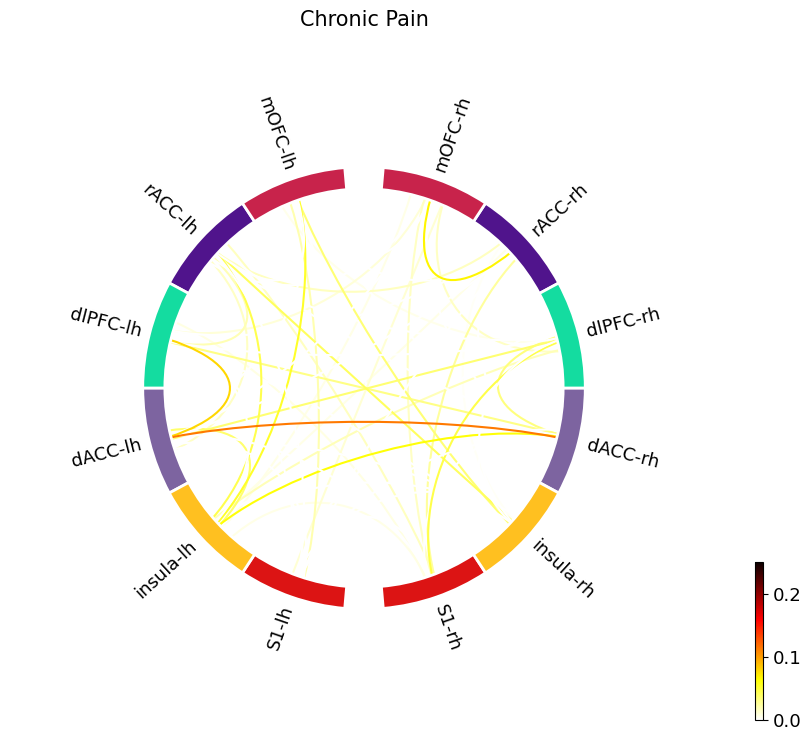

<Figure size 640x480 with 0 Axes>

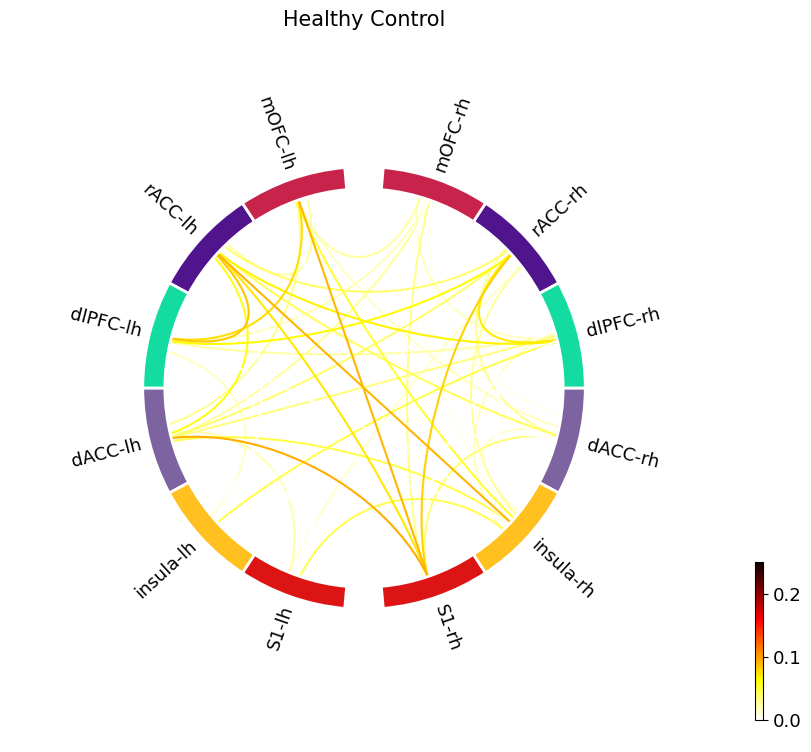

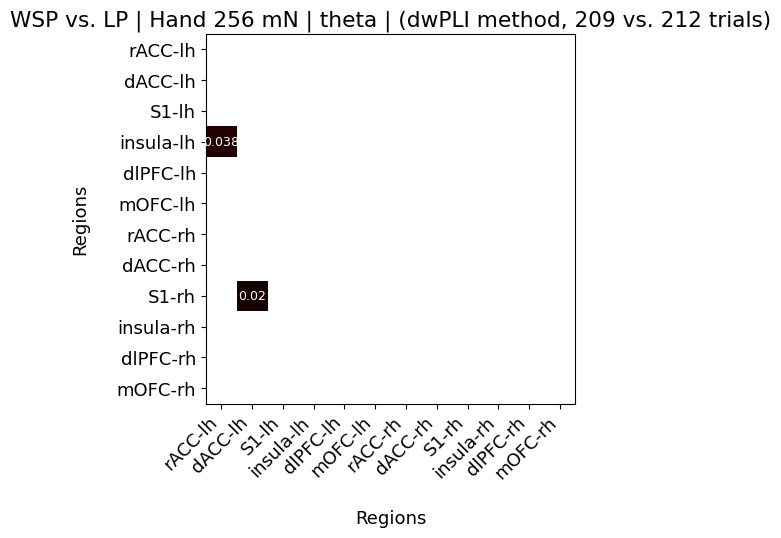

Hand 256 mN - Chronic Pain vs. Healthy Control - wpli2_debiased - alpha
Top 3 Connections in Chronic Pain group
+---------------------+-----------+---------------+
|     Connection      | Frequency | Mean Strength |
+---------------------+-----------+---------------+
| dlPFC-rh <-> S1-rh  |   4/19    |     0.543     |
| mOFC-rh <-> mOFC-lh |   3/19    |     0.47      |
|  S1-rh <-> mOFC-lh  |   3/19    |     0.365     |
+---------------------+-----------+---------------+ 

Top 3 Connections in Healthy Control group
+----------------------+-----------+---------------+
|      Connection      | Frequency | Mean Strength |
+----------------------+-----------+---------------+
| mOFC-lh <-> dlPFC-lh |   4/19    |     0.539     |
|  mOFC-lh <-> S1-lh   |   3/19    |     0.416     |
| insula-rh <-> S1-rh  |   2/19    |     0.636     |
+----------------------+-----------+---------------+ 

(19, 12, 12)

Num epochs: 209 vs. 212

Mann-Whitney U Test Between Chronic Pain and Healthy Control:
+----

<Figure size 640x480 with 0 Axes>

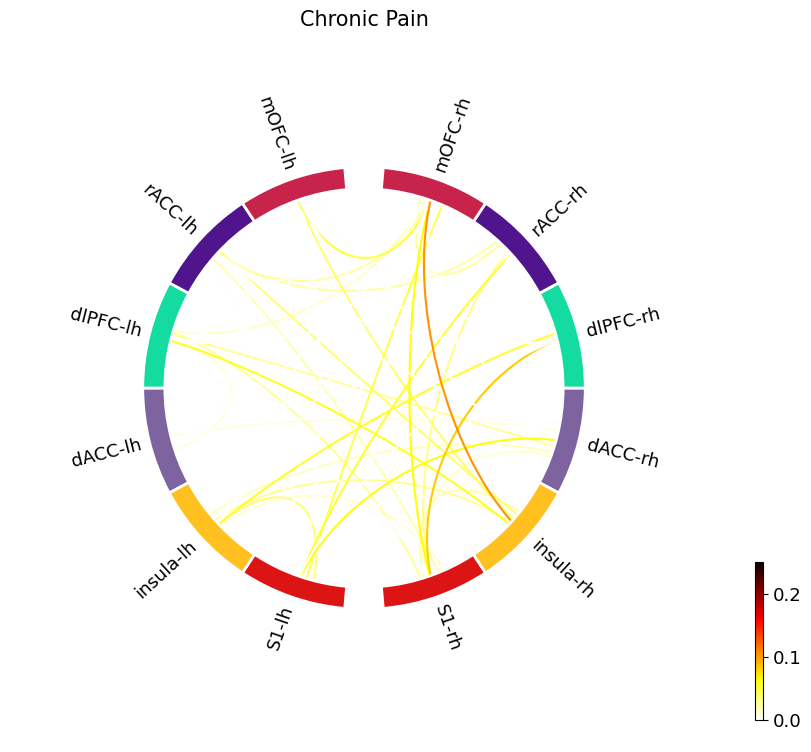

<Figure size 640x480 with 0 Axes>

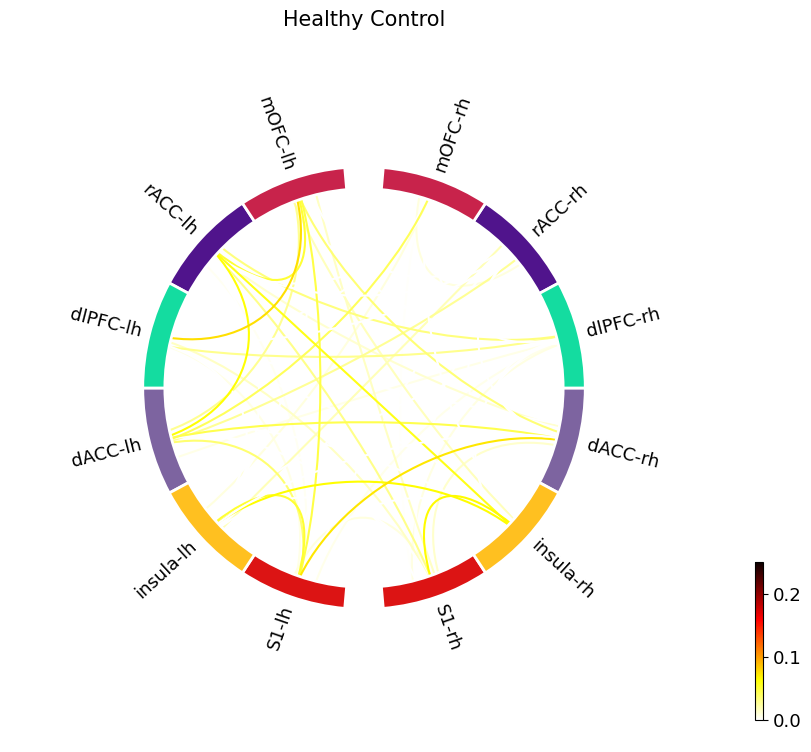

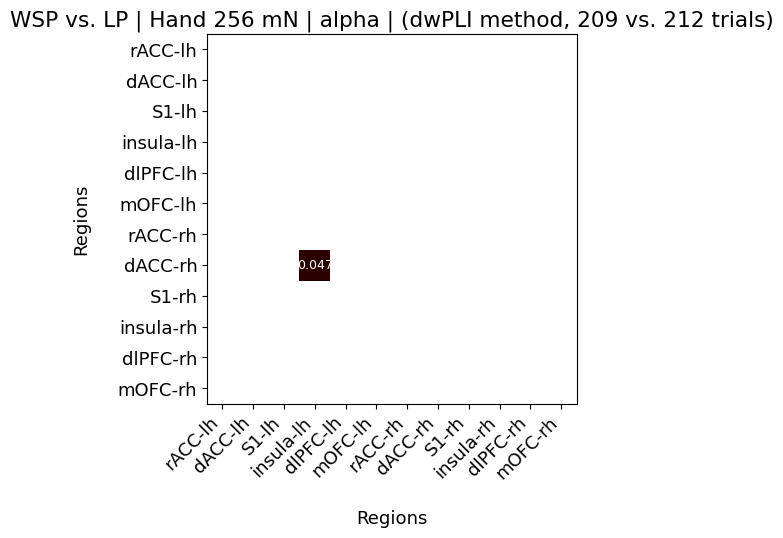

Hand 256 mN - Chronic Pain vs. Healthy Control - wpli2_debiased - beta
Top 3 Connections in Chronic Pain group
+----------------------+-----------+---------------+
|      Connection      | Frequency | Mean Strength |
+----------------------+-----------+---------------+
| insula-rh <-> S1-lh  |   4/19    |     0.18      |
| dlPFC-lh <-> rACC-lh |   3/19    |     0.337     |
| rACC-rh <-> dlPFC-lh |   3/19    |     0.355     |
+----------------------+-----------+---------------+ 

Top 3 Connections in Healthy Control group
+---------------------+-----------+---------------+
|     Connection      | Frequency | Mean Strength |
+---------------------+-----------+---------------+
| mOFC-lh <-> dACC-lh |   4/19    |     0.239     |
| mOFC-lh <-> rACC-lh |   3/19    |     0.33      |
| dlPFC-rh <-> S1-rh  |   3/19    |     0.311     |
+---------------------+-----------+---------------+ 

(19, 12, 12)

Num epochs: 209 vs. 212

Mann-Whitney U Test Between Chronic Pain and Healthy Control:
+-----

<Figure size 640x480 with 0 Axes>

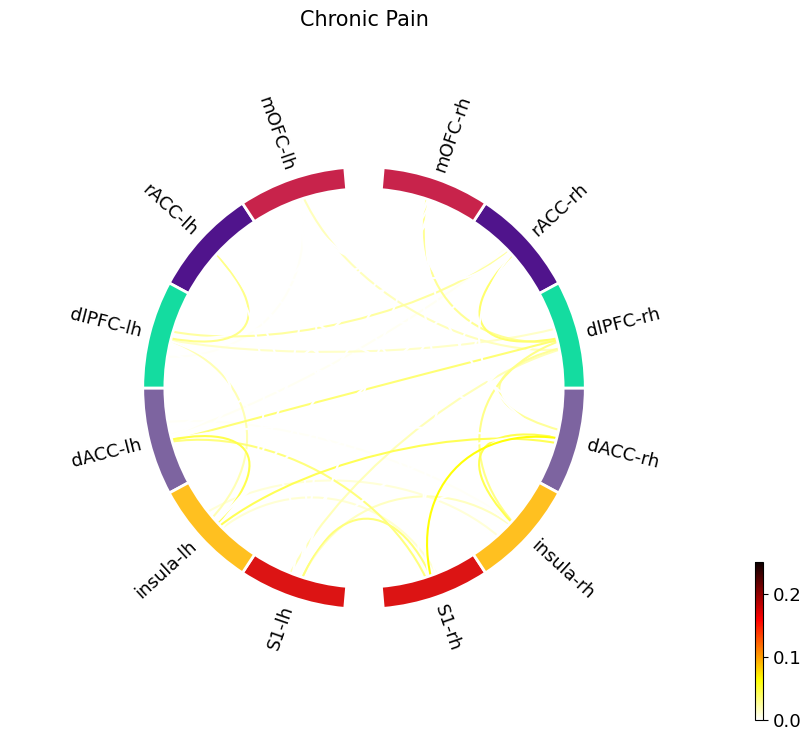

<Figure size 640x480 with 0 Axes>

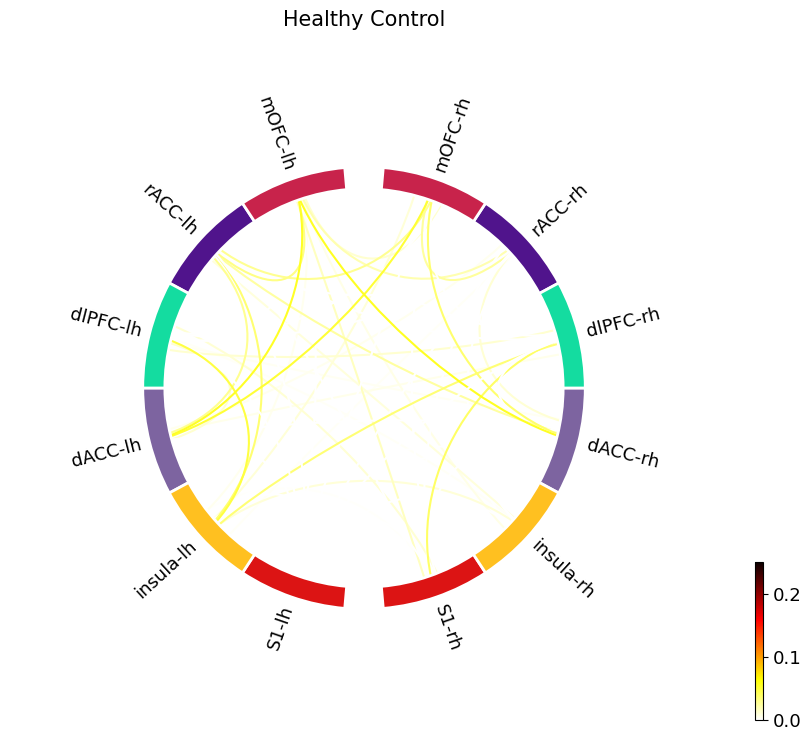

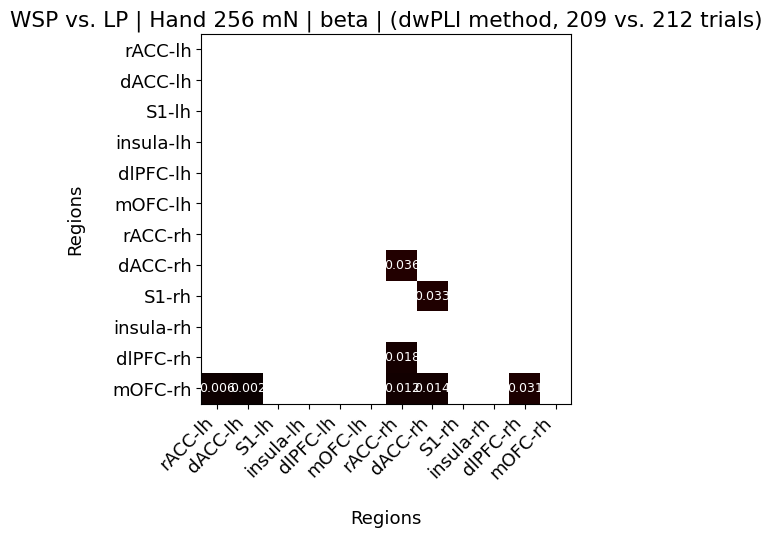

Hand 256 mN - Chronic Pain vs. Healthy Control - wpli2_debiased - low-gamma
Top 3 Connections in Chronic Pain group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
|   rACC-rh <-> S1-lh   |   3/19    |     0.188     |
|  S1-rh <-> dlPFC-lh   |   3/19    |     0.264     |
| insula-rh <-> rACC-lh |   3/19    |     0.174     |
+-----------------------+-----------+---------------+ 

Top 3 Connections in Healthy Control group
+---------------------+-----------+---------------+
|     Connection      | Frequency | Mean Strength |
+---------------------+-----------+---------------+
|  S1-rh <-> dACC-lh  |   3/19    |     0.256     |
| dACC-lh <-> rACC-lh |   3/19    |     0.167     |
| S1-rh <-> insula-lh |   2/19    |     0.158     |
+---------------------+-----------+---------------+ 

(19, 12, 12)

Num epochs: 209 vs. 212

Mann-Whitney U Test Between Chronic Pain and Healthy Con

<Figure size 640x480 with 0 Axes>

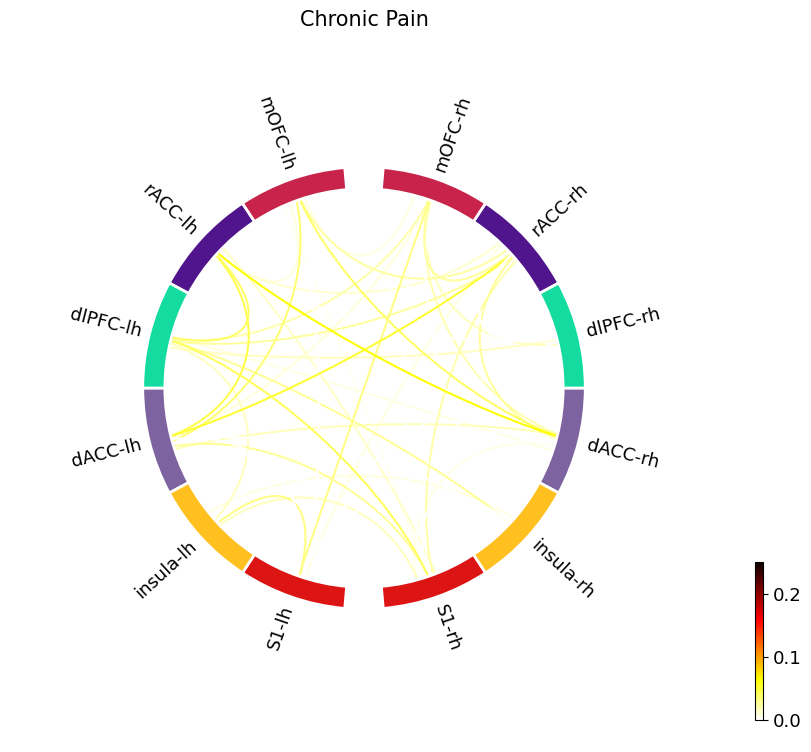

<Figure size 640x480 with 0 Axes>

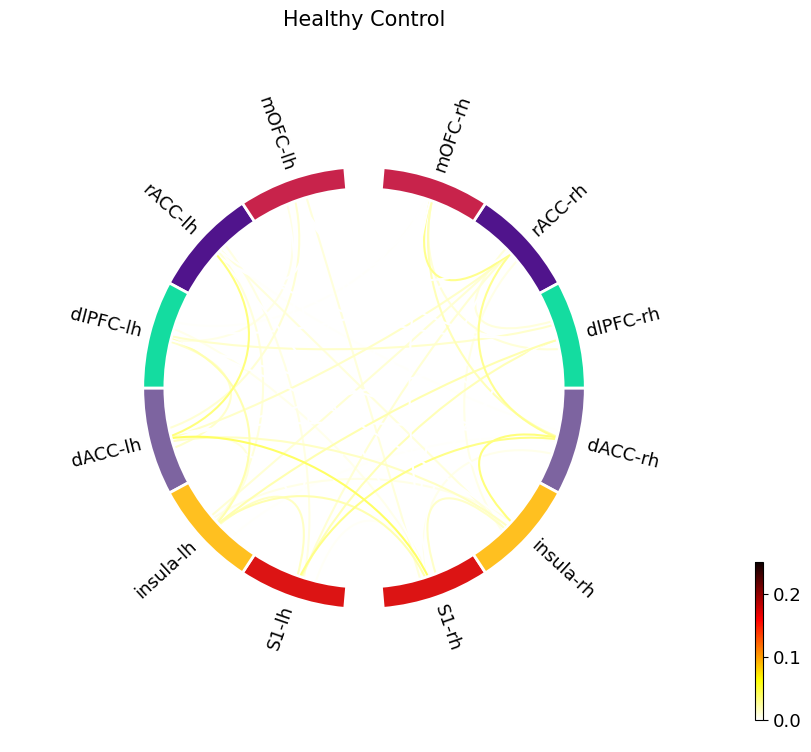

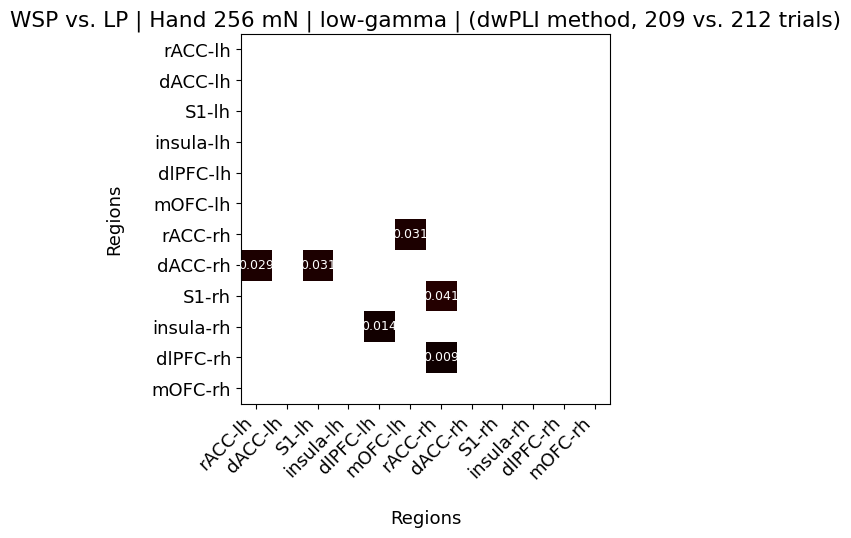

Hand 256 mN - Chronic Pain vs. Healthy Control - wpli2_debiased - high-gamma
Top 3 Connections in Chronic Pain group
+------------------------+-----------+---------------+
|       Connection       | Frequency | Mean Strength |
+------------------------+-----------+---------------+
| insula-rh <-> mOFC-lh  |   4/19    |     0.218     |
|  dACC-rh <-> rACC-rh   |   3/19    |     0.132     |
| dlPFC-rh <-> insula-rh |   3/19    |     0.122     |
+------------------------+-----------+---------------+ 

Top 3 Connections in Healthy Control group
+----------------------+-----------+---------------+
|      Connection      | Frequency | Mean Strength |
+----------------------+-----------+---------------+
| dlPFC-lh <-> rACC-lh |   3/19    |     0.194     |
| insula-lh <-> S1-lh  |   3/19    |     0.134     |
|  S1-rh <-> dlPFC-lh  |   3/19    |     0.142     |
+----------------------+-----------+---------------+ 

(19, 12, 12)

Num epochs: 209 vs. 212

Mann-Whitney U Test Between Chronic Pain 

<Figure size 640x480 with 0 Axes>

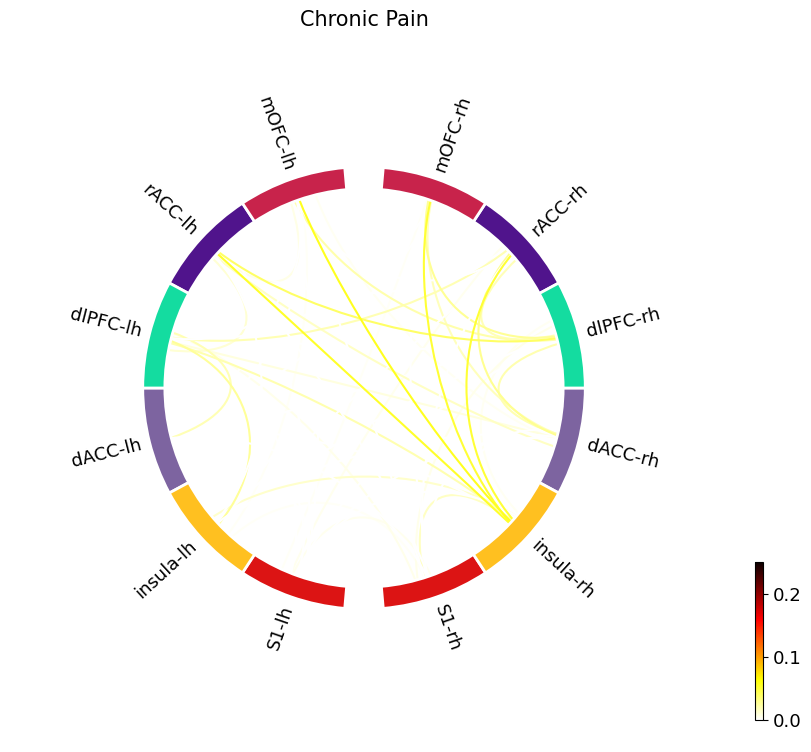

<Figure size 640x480 with 0 Axes>

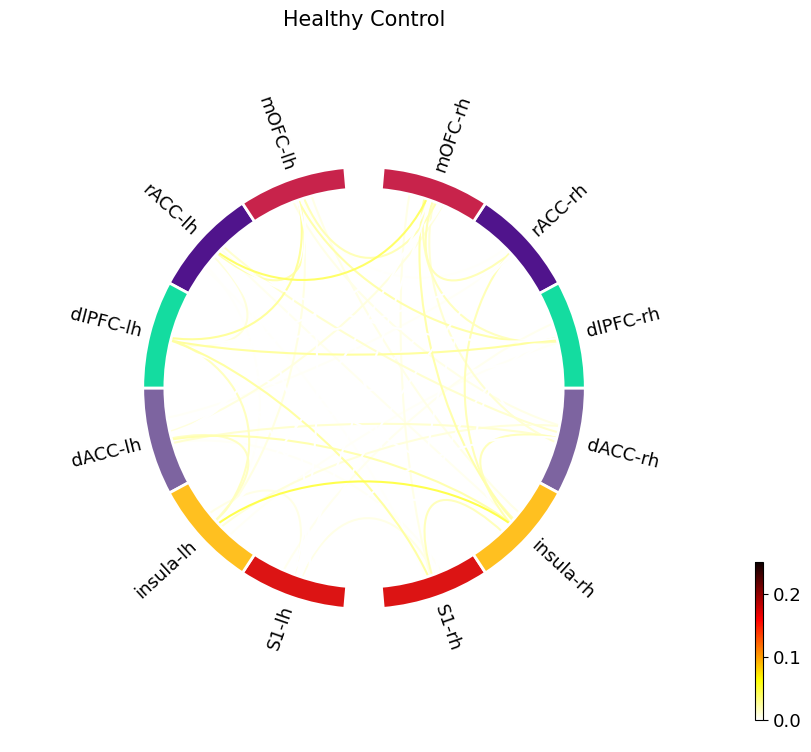

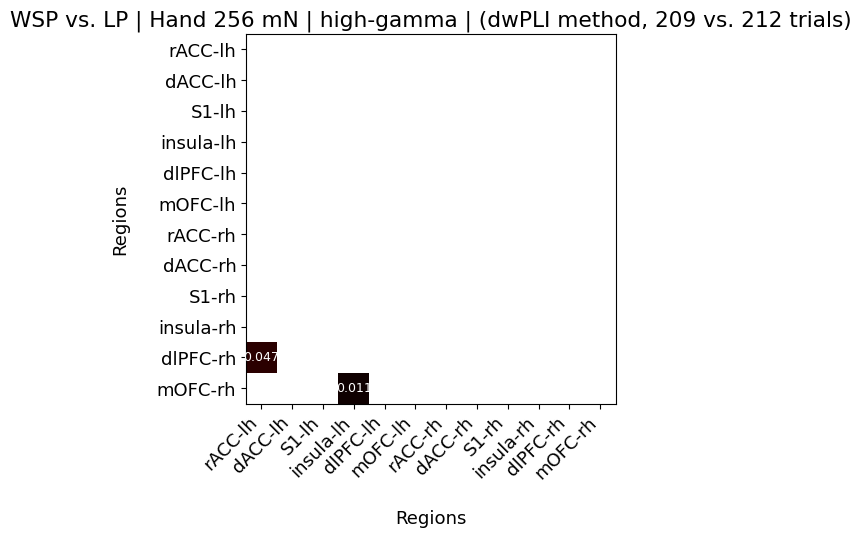

Eyes Open - Chronic Pain vs. Healthy Control - aec_symmetric - theta
Top 3 Connections in Chronic Pain group
+------------------------+-----------+---------------+
|       Connection       | Frequency | Mean Strength |
+------------------------+-----------+---------------+
| dlPFC-rh <-> insula-rh |   6/19    |     0.744     |
| dlPFC-rh <-> insula-lh |   3/19    |     0.748     |
|    mOFC-rh <-> S1-i    |   3/19    |     0.744     |
+------------------------+-----------+---------------+ 

Top 3 Connections in Healthy Control group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
|  rACC-rh <-> rACC-lh  |   5/19    |     0.779     |
| dlPFC-rh <-> dACC-rh  |   3/19    |     0.881     |
| insula-rh <-> dACC-lh |   3/19    |     0.784     |
+-----------------------+-----------+---------------+ 

(19, 12, 12)

Num epochs: 228 vs. 228

Mann-Whitney U Test Between Chronic Pain a

<Figure size 640x480 with 0 Axes>

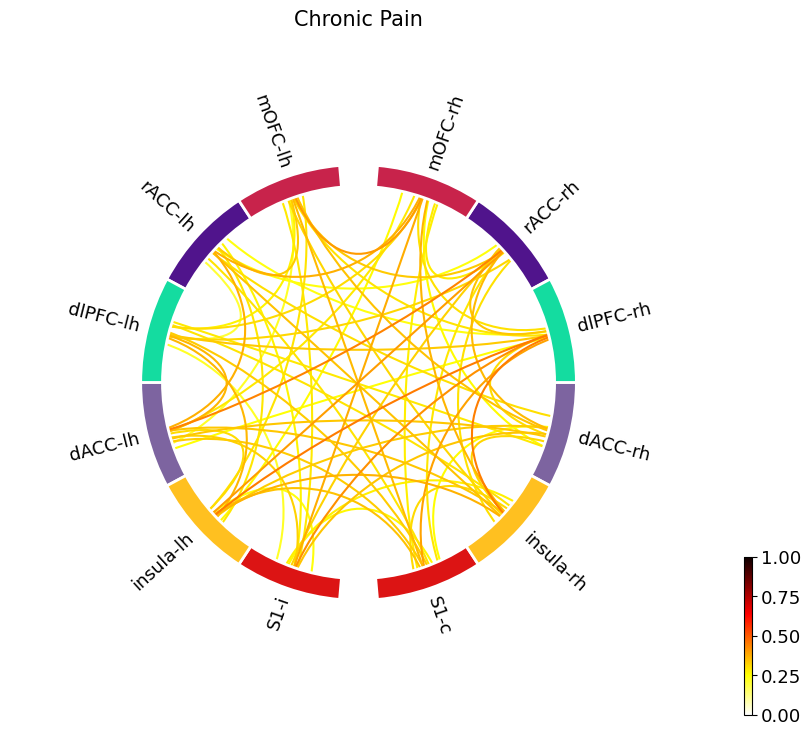

<Figure size 640x480 with 0 Axes>

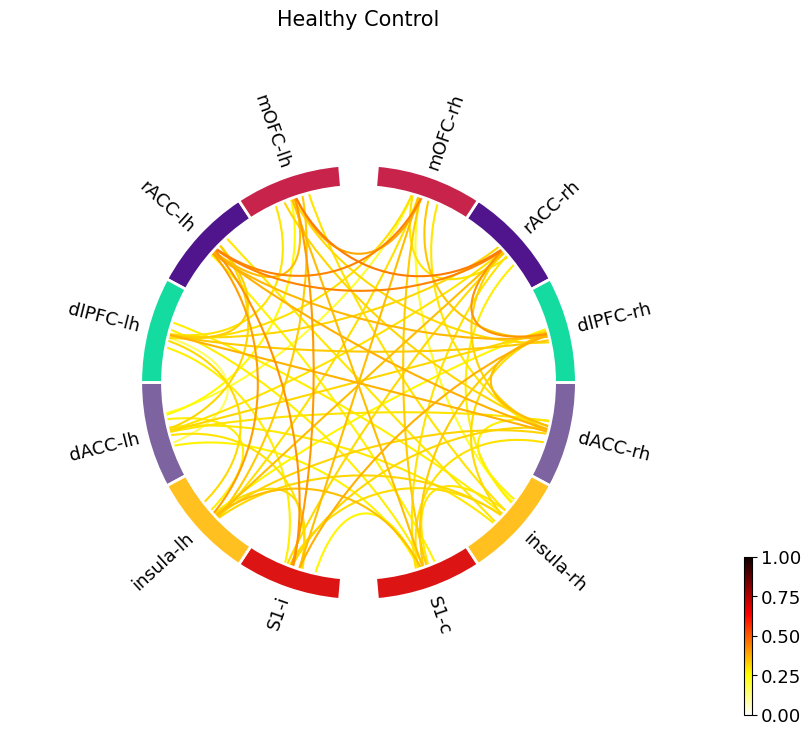

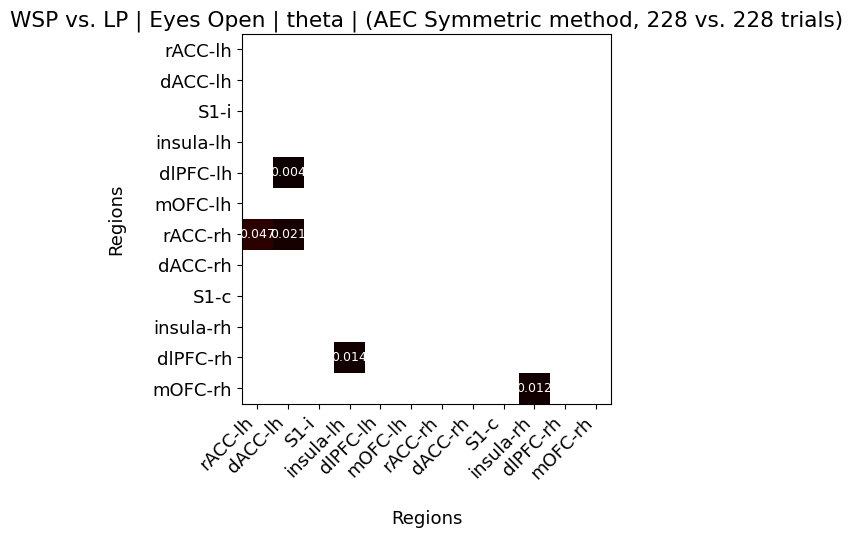

Eyes Open - Chronic Pain vs. Healthy Control - aec_symmetric - alpha
Top 3 Connections in Chronic Pain group
+---------------------+-----------+---------------+
|     Connection      | Frequency | Mean Strength |
+---------------------+-----------+---------------+
| mOFC-lh <-> dACC-lh |   3/19    |     0.743     |
|  dACC-rh <-> S1-i   |   3/19    |     0.592     |
| rACC-rh <-> dACC-lh |   3/19    |     0.688     |
+---------------------+-----------+---------------+ 

Top 3 Connections in Healthy Control group
+-------------------------+-----------+---------------+
|       Connection        | Frequency | Mean Strength |
+-------------------------+-----------+---------------+
| insula-rh <-> insula-lh |   3/19    |     0.673     |
|  insula-rh <-> dACC-rh  |   3/19    |     0.662     |
|   rACC-rh <-> dACC-lh   |   3/19    |     0.739     |
+-------------------------+-----------+---------------+ 

(19, 12, 12)

Num epochs: 228 vs. 228

Mann-Whitney U Test Between Chronic Pain and Heal

<Figure size 640x480 with 0 Axes>

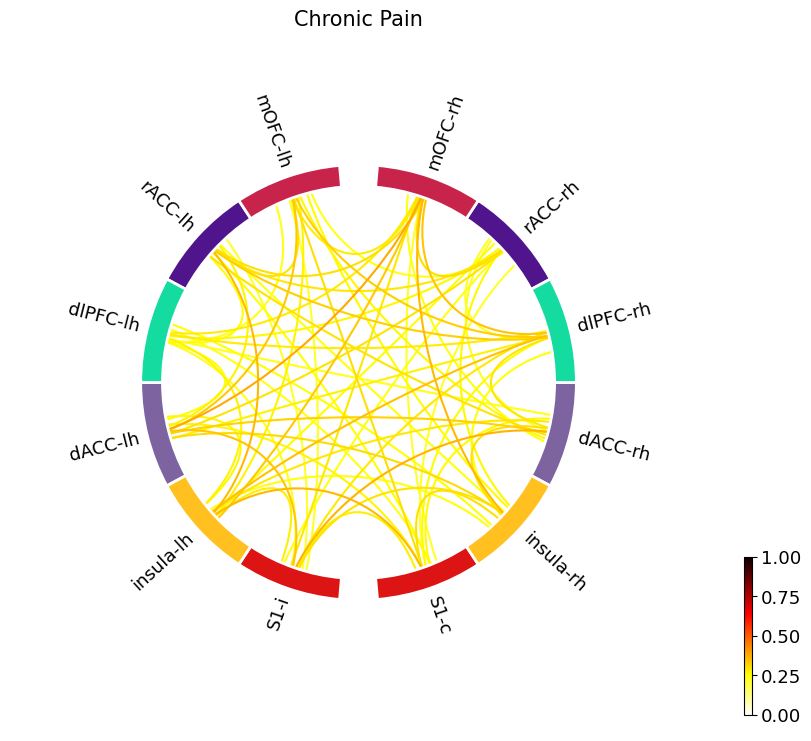

<Figure size 640x480 with 0 Axes>

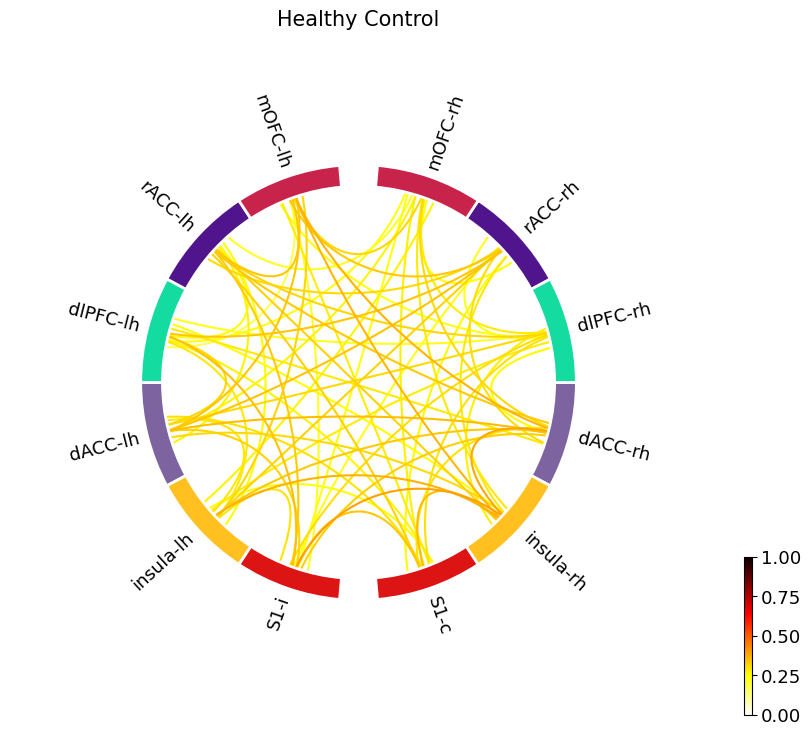

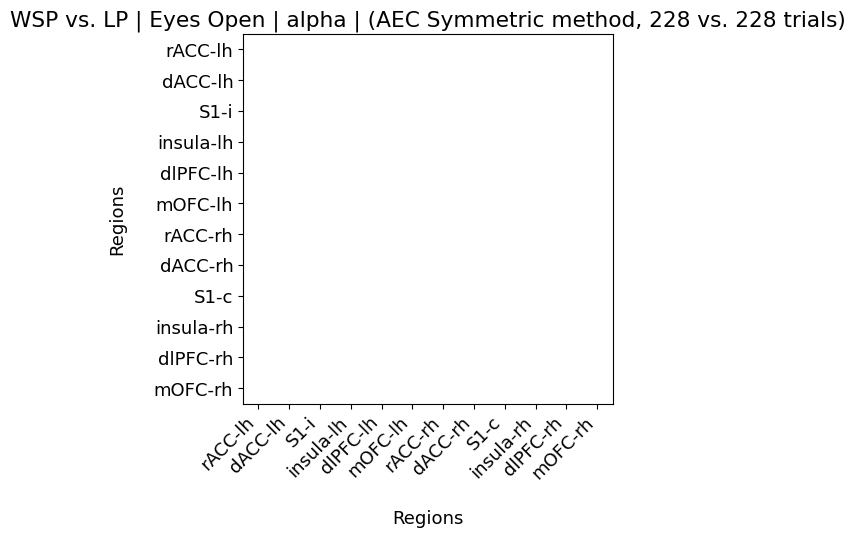

Eyes Open - Chronic Pain vs. Healthy Control - aec_symmetric - beta
Top 3 Connections in Chronic Pain group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
| insula-rh <-> rACC-rh |   4/19    |     0.475     |
| dlPFC-rh <-> rACC-rh  |   3/19    |     0.472     |
|  dACC-rh <-> rACC-rh  |   3/19    |     0.461     |
+-----------------------+-----------+---------------+ 

Top 3 Connections in Healthy Control group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
|  rACC-rh <-> rACC-lh  |   3/19    |     0.528     |
| rACC-rh <-> dlPFC-lh  |   3/19    |     0.395     |
| insula-lh <-> rACC-lh |   3/19    |     0.503     |
+-----------------------+-----------+---------------+ 

(19, 12, 12)

Num epochs: 228 vs. 228

Mann-Whitney U Test Between Chronic Pain and Healt

<Figure size 640x480 with 0 Axes>

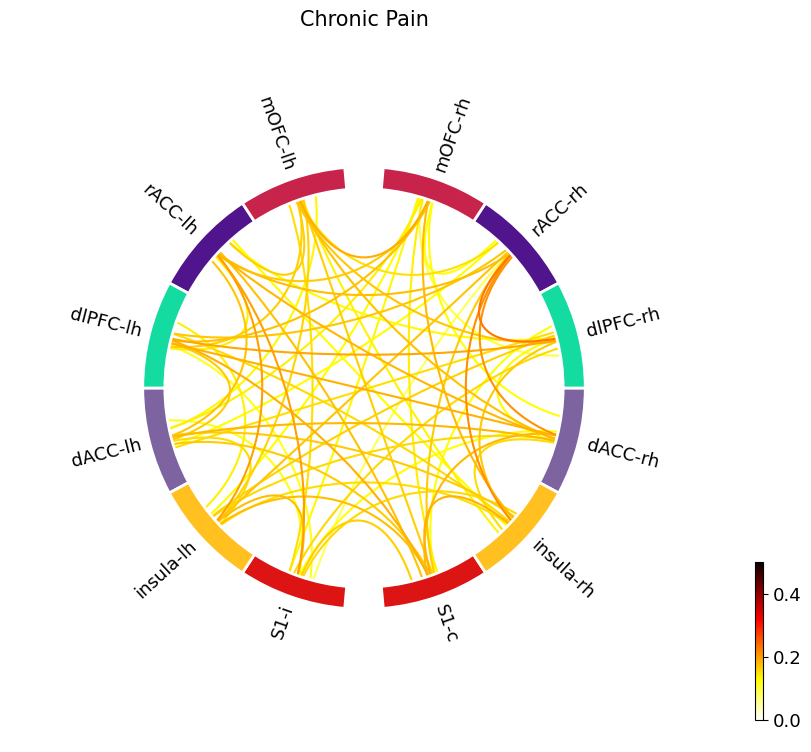

<Figure size 640x480 with 0 Axes>

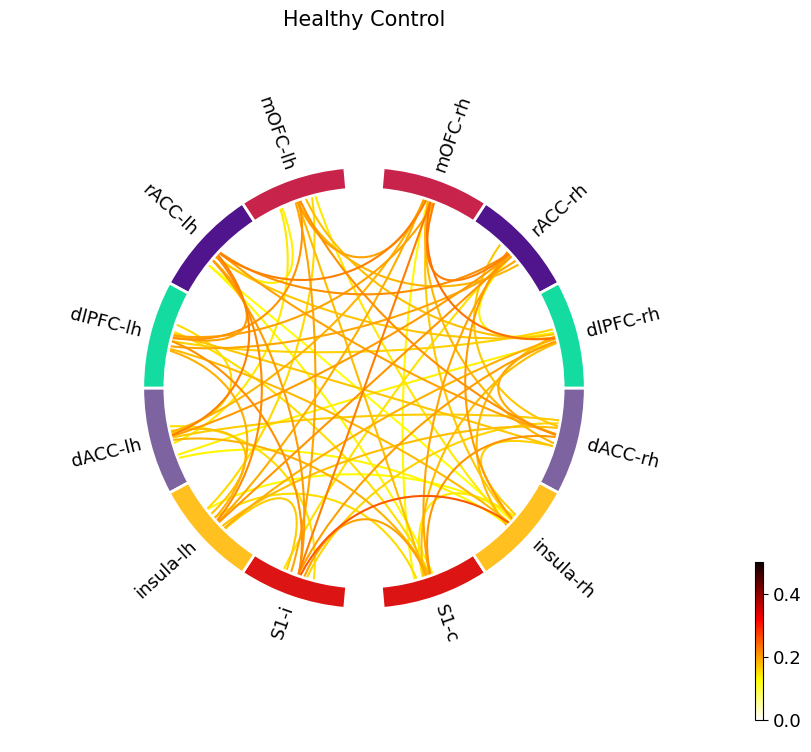

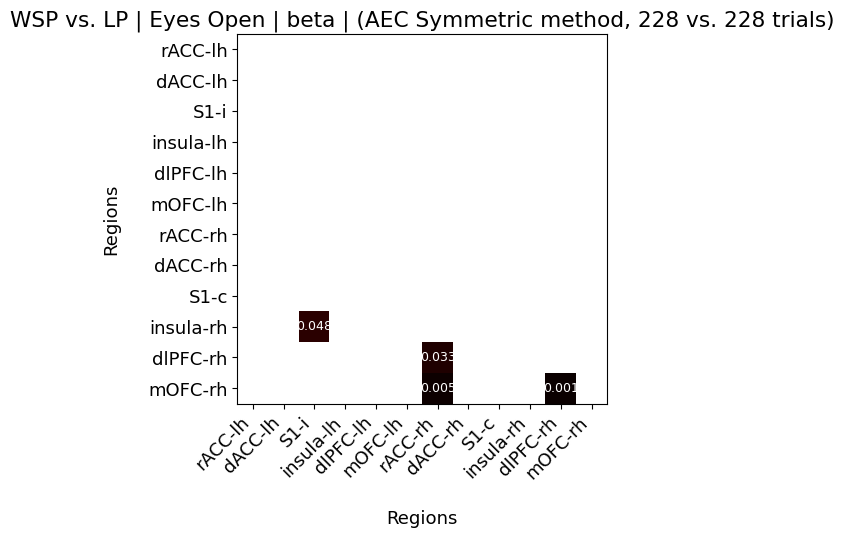

Eyes Open - Chronic Pain vs. Healthy Control - aec_symmetric - low-gamma
Top 3 Connections in Chronic Pain group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
| insula-rh <-> rACC-lh |   5/19    |     0.32      |
|  rACC-rh <-> rACC-lh  |   4/19    |     0.451     |
| rACC-rh <-> dlPFC-lh  |   4/19    |     0.409     |
+-----------------------+-----------+---------------+ 

Top 3 Connections in Healthy Control group
+-------------------------+-----------+---------------+
|       Connection        | Frequency | Mean Strength |
+-------------------------+-----------+---------------+
|   mOFC-rh <-> rACC-lh   |   5/19    |     0.354     |
|  dlPFC-rh <-> dACC-lh   |   3/19    |     0.328     |
| insula-rh <-> insula-lh |   3/19    |     0.381     |
+-------------------------+-----------+---------------+ 

(19, 12, 12)

Num epochs: 228 vs. 228

Mann-Whitney U Test Between Chr

<Figure size 640x480 with 0 Axes>

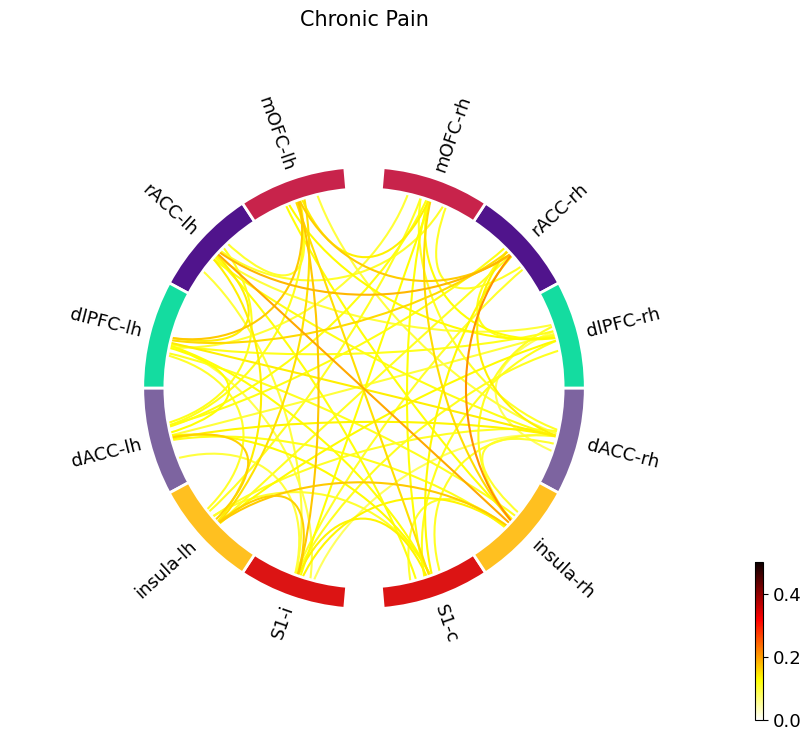

<Figure size 640x480 with 0 Axes>

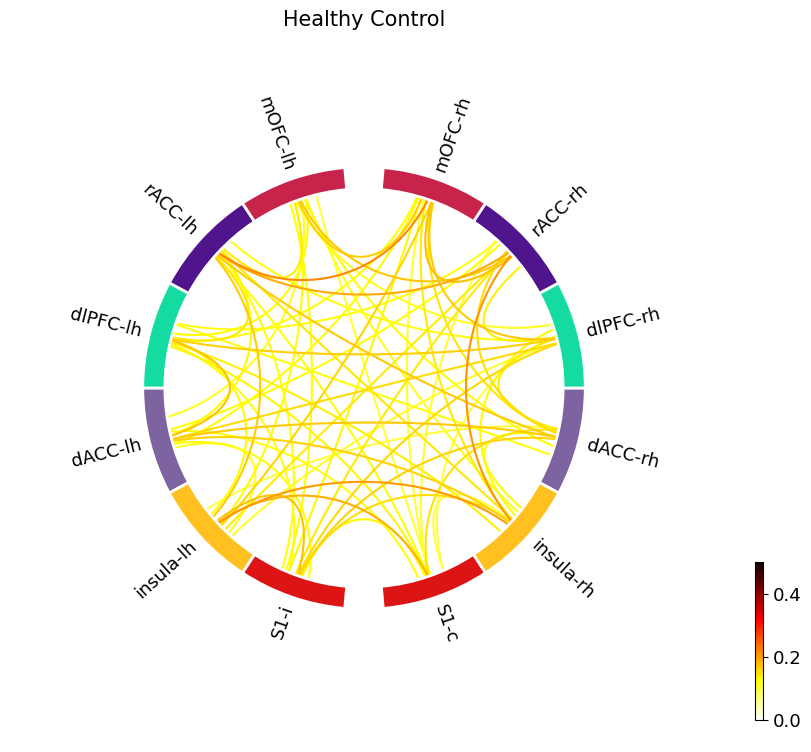

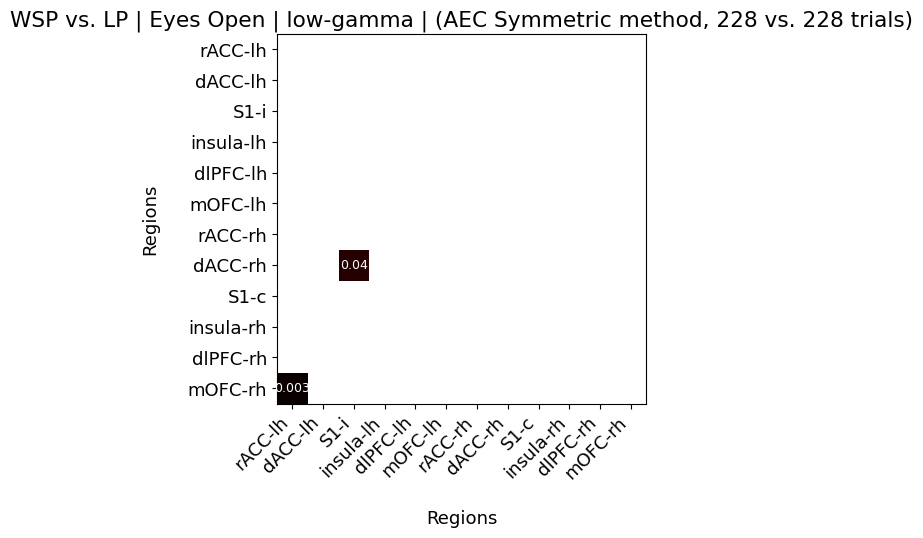

Eyes Open - Chronic Pain vs. Healthy Control - aec_symmetric - high-gamma
Top 3 Connections in Chronic Pain group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
| dlPFC-rh <-> dACC-rh  |   6/19    |     0.319     |
| insula-lh <-> rACC-lh |   4/19    |     0.372     |
| insula-rh <-> rACC-lh |   4/19    |     0.357     |
+-----------------------+-----------+---------------+ 

Top 3 Connections in Healthy Control group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
|  S1-c <-> insula-lh   |   4/19    |     0.434     |
|  rACC-rh <-> rACC-lh  |   4/19    |     0.411     |
| insula-rh <-> rACC-rh |   4/19    |     0.437     |
+-----------------------+-----------+---------------+ 

(19, 12, 12)

Num epochs: 228 vs. 228

Mann-Whitney U Test Between Chronic Pain and

<Figure size 640x480 with 0 Axes>

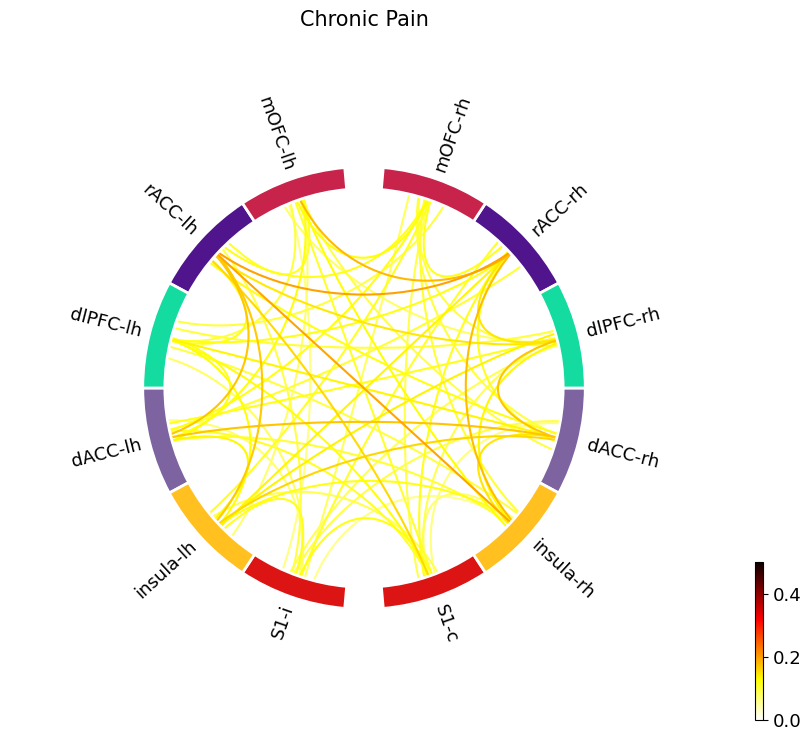

<Figure size 640x480 with 0 Axes>

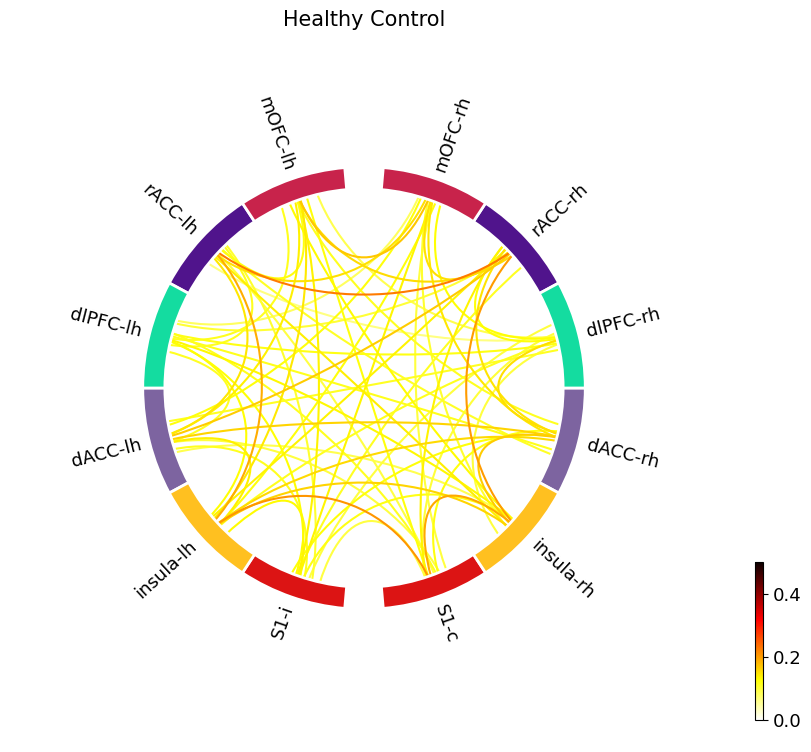

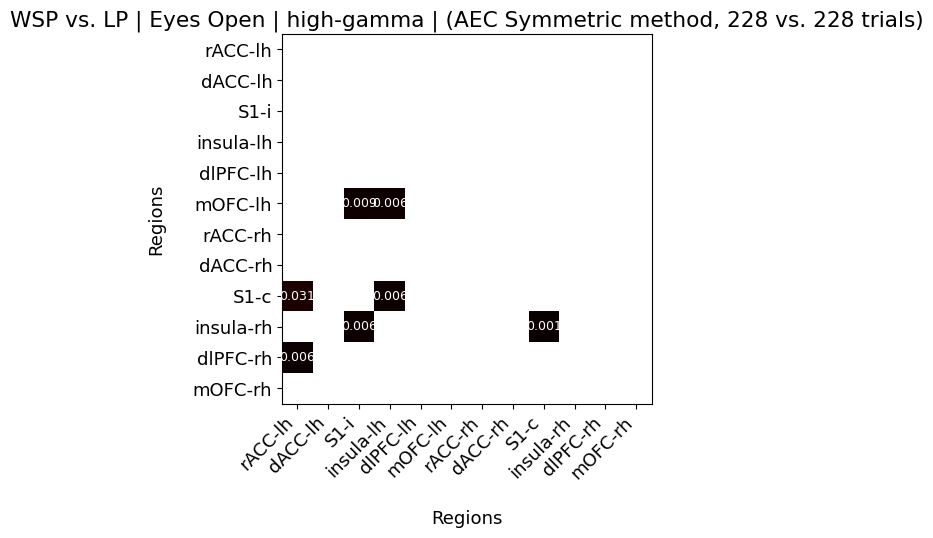

In [ ]:
# Widespread Pain vs Localized Pain
these_group_names = ["Chronic Pain", "Healthy Control", "Mann_Whitney_U_test"]
these_group_cons = [group_con_CP, group_con_HC]
these_sub_cons = [sub_con_CP, sub_con_HC]
these_sub_ids = [sub_ids_CP, sub_ids_HC]

sig_pairs_CP_HC = {}

for condition in conditions:

    sig_pairs_CP_HC[condition] = {}

    for method in con_methods:

        sig_pairs_CP_HC[condition][method] = {}

        # Ignore some specific condition/method combinations
        if condition=="Hand 256 mN" and "aec" in method:
            continue
        elif condition=="Eyes Open" and method=="wpli2_debiased":
            continue
        
        for band in band_names:
            # Select groups for mann-whitney
            print(f"{condition} - {these_group_names[0]} vs. {these_group_names[1]} - {method} - {band}")
        
            # For each of the top 3 connections, add the connection, its frequency, and its mean strength to a list  
            top_3_info=None
            group_con=None
            for group_con,group_name,sub_con in zip(these_group_cons, these_group_names, these_sub_cons):
                table_data = []  
                top_3_info = group_con[condition][method][band]["top 3"] 
                print(f"Top 3 Connections in {group_name} group")
                for i in range(3):  
                    connection = top_3_info["connections"][i]  
                    frequency = top_3_info["frequency"][i]  
                    mean_strength = top_3_info["mean strength"][i]
                    if 'Eyes' in condition:
                        table_data.append([f"{roi_acronyms_resting[connection[0]]} <-> {roi_acronyms_resting[connection[1]]}", f"{frequency}/{len(sub_con)}", mean_strength]) 
                    else:
                        table_data.append([f"{roi_acronyms[connection[0]]} <-> {roi_acronyms[connection[1]]}", f"{frequency}/{len(sub_con)}", mean_strength]) 
                        
                # Define table headers  
                headers = ['Connection', 'Frequency', 'Mean Strength']  
                
                # Print the table  
                print(tabulate(table_data, headers, tablefmt='pretty'),'\n')  

            group1_stack = these_group_cons[0][condition][method][band]["data"]
            print(group1_stack.shape)
            group2_stack = these_group_cons[1][condition][method][band]["data"]

            nepochs_1 = these_group_cons[0][condition]['num_epochs']
            nepochs_2 = these_group_cons[1][condition]['num_epochs']
            
            # Compute the Mann-Whitney U test
            p_values, means_1, sem_1, means_2, sem_2 = fc.mann_whitney_test(
                group1_stack,
                group2_stack,
                roi_acronyms=roi_acronyms if 'Eyes' not in condition else roi_acronyms_resting,
                sub_ids1=these_sub_ids[0],
                sub_ids2=these_sub_ids[1],
                condition=condition,
                bilateral_pain_ids=bilateral_pain_ids,
                round_neg_vals=round_neg_vals,
                method=method)
            
            #print(p_values)

            # Need to custom set this because the colors blow out
            if 'Eyes' in condition and band in ["theta","alpha"]:
                vmin = 0.0
                vmax = 1.0
            elif 'Eyes' in condition and band not in ["theta","alpha"]:
                vmin = 0.0
                vmax = 0.5
            else:
                vmin = None
                vmax = None
            
            # Plotting
            # Gather the information for plotting
            plot_kwargs= dict(
                method=method,
                band=band, 
                roi_names=roi_names,
                roi_acronyms=roi_acronyms if 'Eyes' not in condition else roi_acronyms_resting,
                condition=condition,
                vmin=vmin,
                vmax=vmax,
                group_names=these_group_names,
                nepochs=[nepochs_1, nepochs_2],
                titles=[these_group_names[0], 
                        these_group_names[1],
                        "WSP vs. LP",],
                save_names=["Mann_Whitney_U_test",
                            these_group_names[0], 
                            these_group_names[1],
                            ],
                save_path='',
                )
 
            print(f"\nNum epochs: {nepochs_1} vs. {nepochs_2}")               
            sig_pairs_CP_HC[condition][method][band] = fc.plot_connectivity_and_stats(means_1=means_1,
                                        means_2=means_2,
                                        sem_1=sem_1,
                                        sem_2=sem_2,
                                        p_values=p_values,
                                        **plot_kwargs,
                                        save_fig=True,
                                        highlight_pvals=highlight_pvals,
                                        min_fc_val=None,
                                        set_title=set_title,
                                        show_fc_vals=show_fc_vals,
                                        round_neg_vals=round_neg_vals,
            )       

### WSP vs. LP Mann-Whitney

Hand 256 mN - Chronic Widespread Pain vs. Chronic Localized Pain - wpli2_debiased - theta
Top 3 Connections in Chronic Widespread Pain group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
| insula-rh <-> rACC-lh |   3/12    |     0.285     |
| dlPFC-rh <-> dACC-lh  |   2/12    |     0.266     |
|   rACC-rh <-> S1-lh   |   2/12    |     0.375     |
+-----------------------+-----------+---------------+ 

Top 3 Connections in Chronic Localized Pain group
+----------------------+-----------+---------------+
|      Connection      | Frequency | Mean Strength |
+----------------------+-----------+---------------+
| mOFC-rh <-> rACC-rh  |   4/12    |     0.547     |
| dACC-rh <-> dlPFC-lh |   3/12    |     0.572     |
| dACC-rh <-> dACC-lh  |   3/12    |     0.383     |
+----------------------+-----------+---------------+ 

(12, 12, 12)

Num epochs: 126 vs. 137

Mann-Whitney U Te

<Figure size 640x480 with 0 Axes>

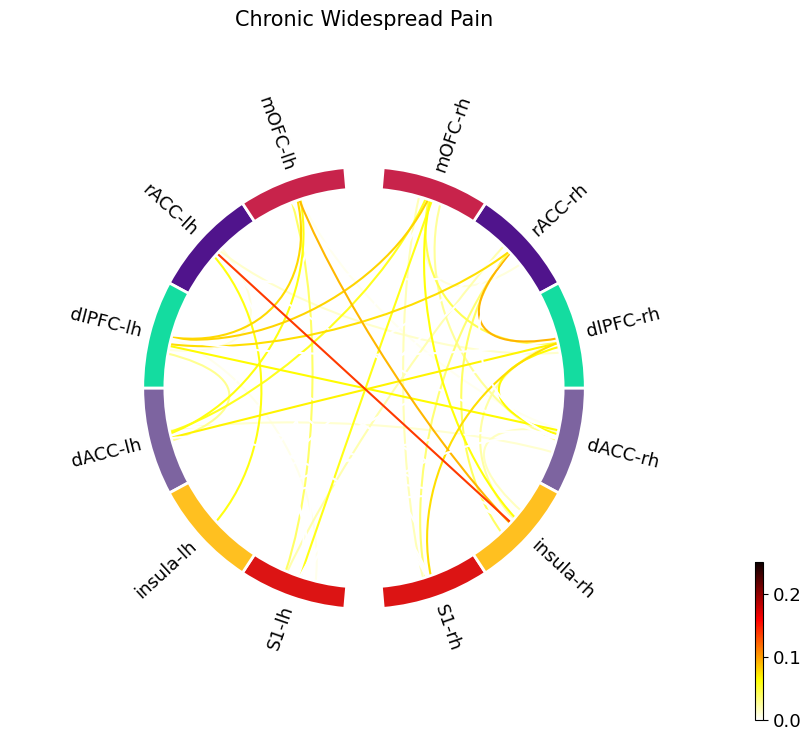

<Figure size 640x480 with 0 Axes>

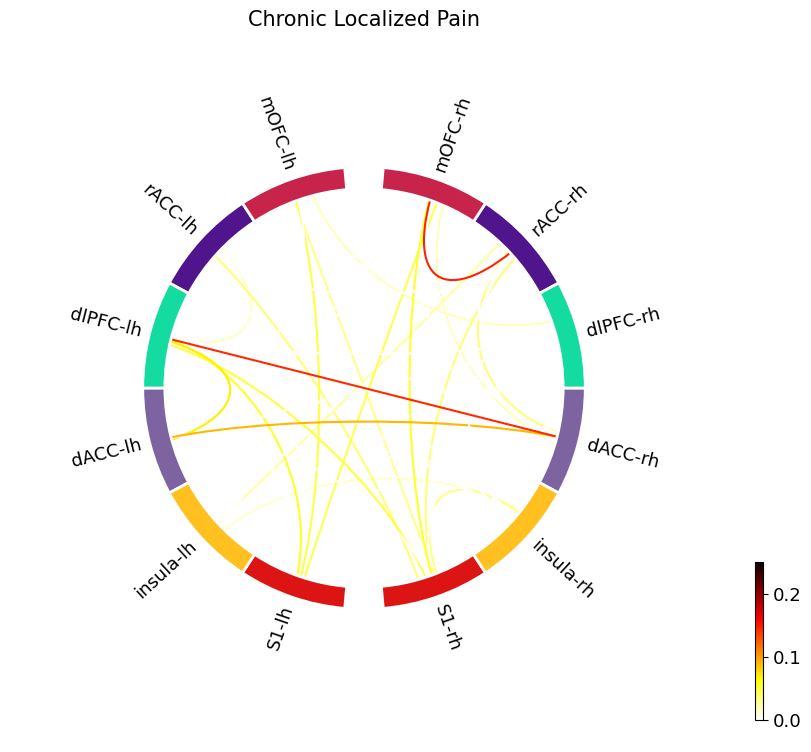

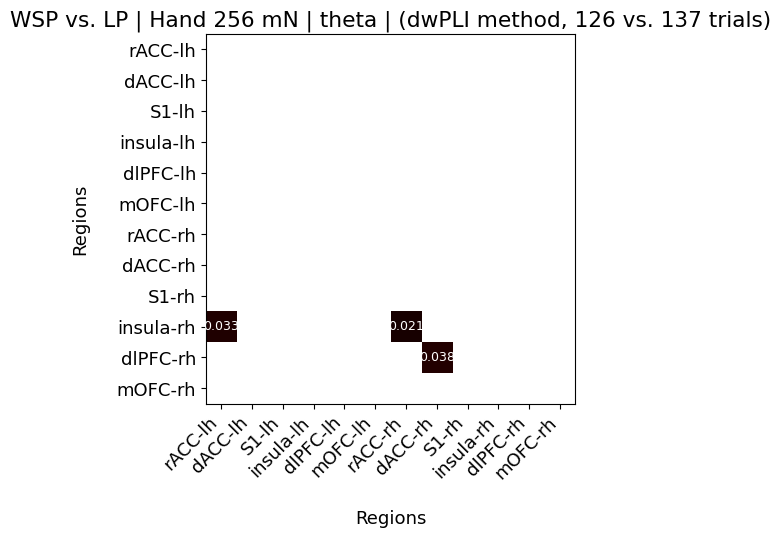

Hand 256 mN - Chronic Widespread Pain vs. Chronic Localized Pain - wpli2_debiased - alpha
Top 3 Connections in Chronic Widespread Pain group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
|  dlPFC-rh <-> S1-rh   |   3/12    |     0.516     |
|  mOFC-rh <-> mOFC-lh  |   2/12    |     0.52      |
| mOFC-lh <-> insula-lh |   2/12    |     0.28      |
+-----------------------+-----------+---------------+ 

Top 3 Connections in Chronic Localized Pain group
+-------------------+-----------+---------------+
|    Connection     | Frequency | Mean Strength |
+-------------------+-----------+---------------+
| S1-rh <-> rACC-lh |   2/12    |     0.296     |
| S1-rh <-> rACC-rh |   2/12    |     0.43      |
| mOFC-rh <-> S1-rh |   2/12    |     0.349     |
+-------------------+-----------+---------------+ 

(12, 12, 12)

Num epochs: 126 vs. 137

Mann-Whitney U Test Between Chronic Wi

<Figure size 640x480 with 0 Axes>

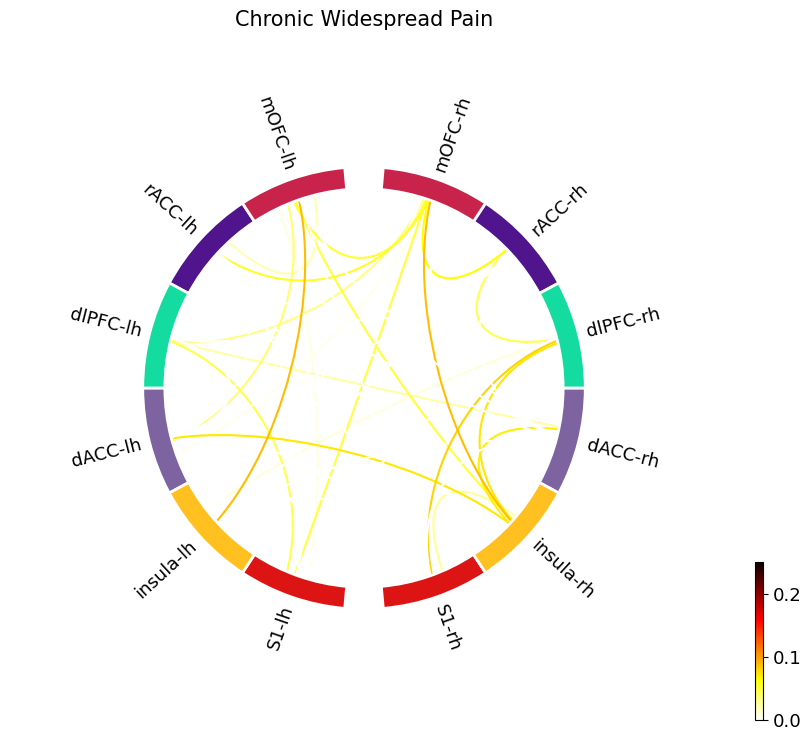

<Figure size 640x480 with 0 Axes>

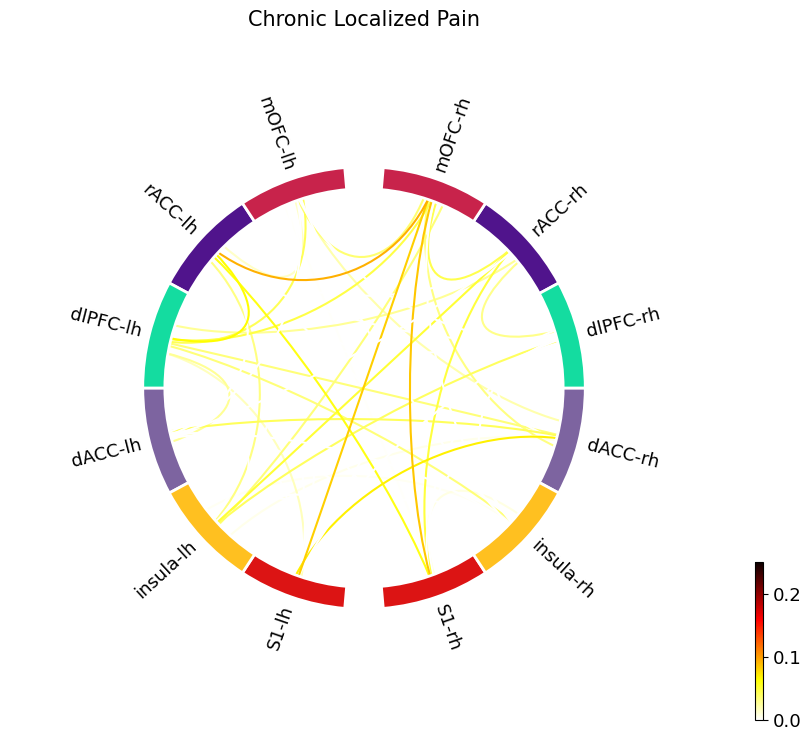

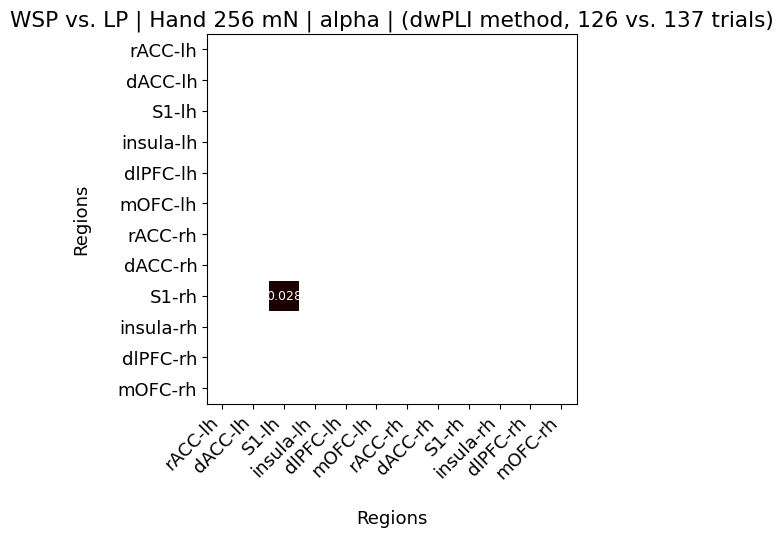

Hand 256 mN - Chronic Widespread Pain vs. Chronic Localized Pain - wpli2_debiased - beta
Top 3 Connections in Chronic Widespread Pain group
+---------------------+-----------+---------------+
|     Connection      | Frequency | Mean Strength |
+---------------------+-----------+---------------+
| insula-rh <-> S1-lh |   2/12    |     0.154     |
|  S1-lh <-> rACC-lh  |   2/12    |     0.278     |
|  rACC-rh <-> S1-lh  |   2/12    |     0.202     |
+---------------------+-----------+---------------+ 

Top 3 Connections in Chronic Localized Pain group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
| insula-rh <-> dACC-lh |   3/12    |     0.198     |
| mOFC-rh <-> dlPFC-rh  |   2/12    |     0.189     |
|  rACC-rh <-> dACC-lh  |   2/12    |     0.214     |
+-----------------------+-----------+---------------+ 

(12, 12, 12)

Num epochs: 126 vs. 137

Mann-Whitney U Test Betwe

<Figure size 640x480 with 0 Axes>

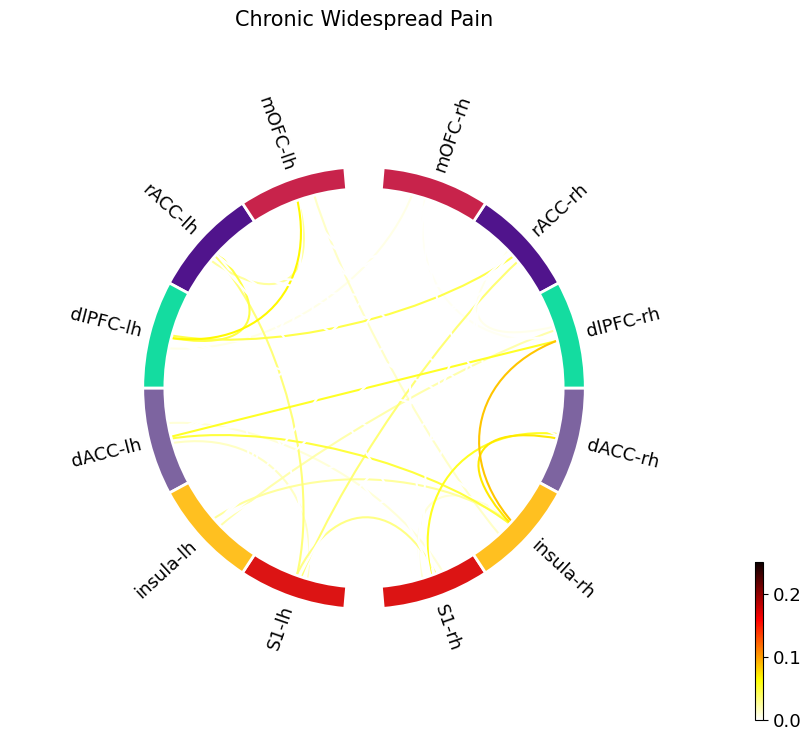

<Figure size 640x480 with 0 Axes>

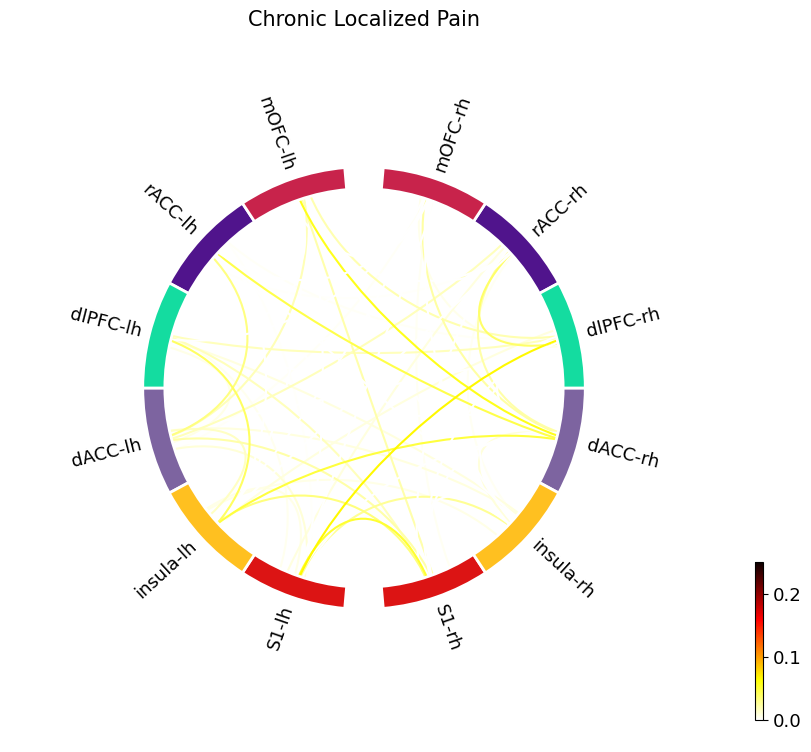

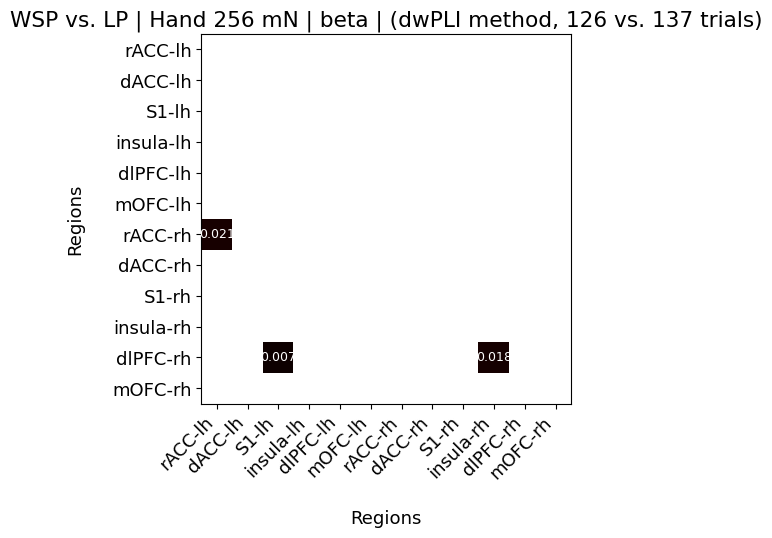

Hand 256 mN - Chronic Widespread Pain vs. Chronic Localized Pain - wpli2_debiased - low-gamma
Top 3 Connections in Chronic Widespread Pain group
+----------------------+-----------+---------------+
|      Connection      | Frequency | Mean Strength |
+----------------------+-----------+---------------+
| mOFC-rh <-> rACC-lh  |   4/12    |     0.166     |
|  dACC-rh <-> S1-lh   |   2/12    |     0.136     |
| dlPFC-lh <-> rACC-lh |   2/12    |     0.18      |
+----------------------+-----------+---------------+ 

Top 3 Connections in Chronic Localized Pain group
+------------------------+-----------+---------------+
|       Connection       | Frequency | Mean Strength |
+------------------------+-----------+---------------+
| insula-rh <-> rACC-lh  |   3/12    |     0.168     |
|  mOFC-rh <-> dACC-rh   |   2/12    |     0.158     |
| dlPFC-rh <-> insula-rh |   2/12    |     0.11      |
+------------------------+-----------+---------------+ 

(12, 12, 12)

Num epochs: 126 vs. 137

Mann-W

<Figure size 640x480 with 0 Axes>

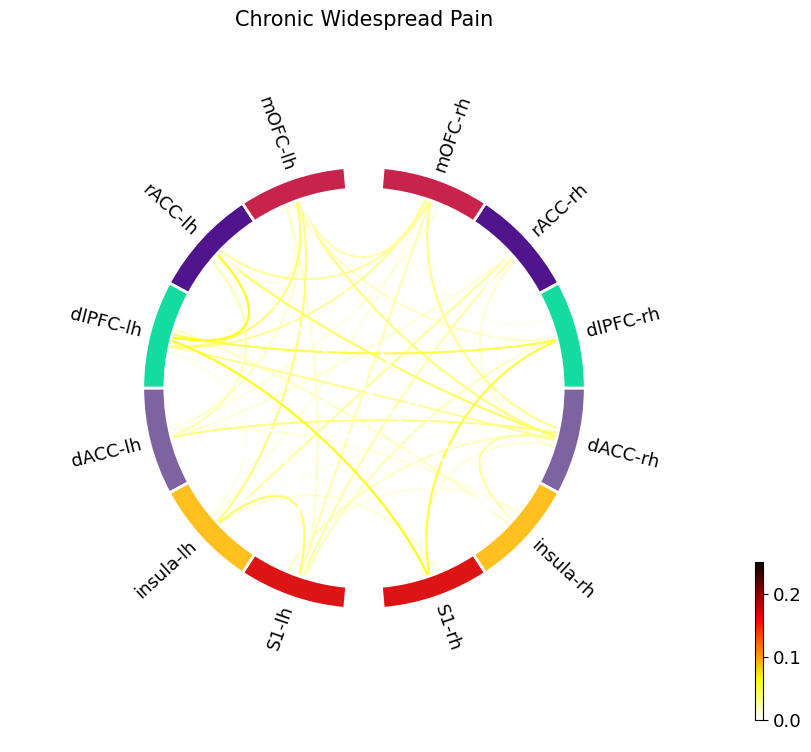

<Figure size 640x480 with 0 Axes>

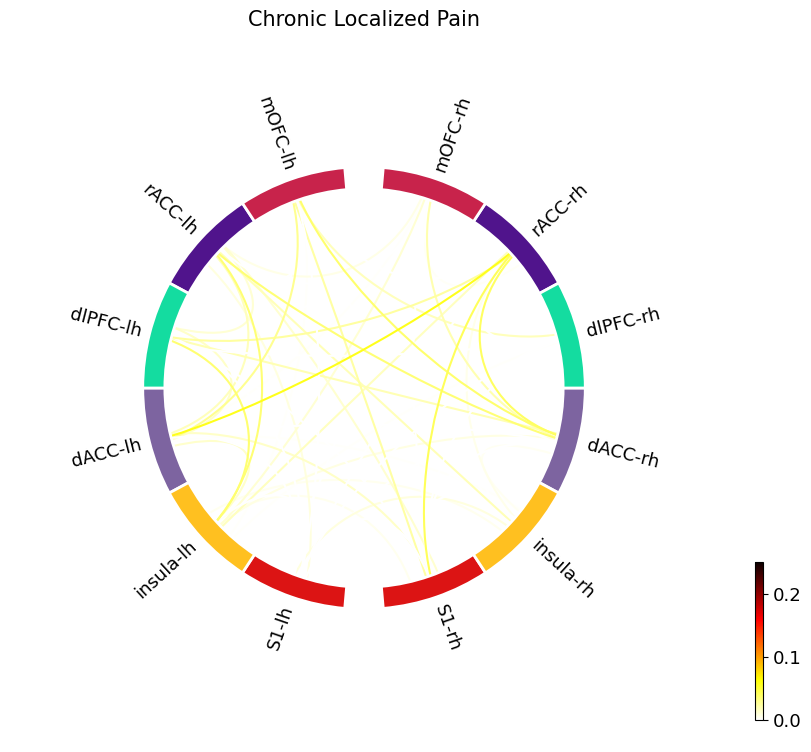

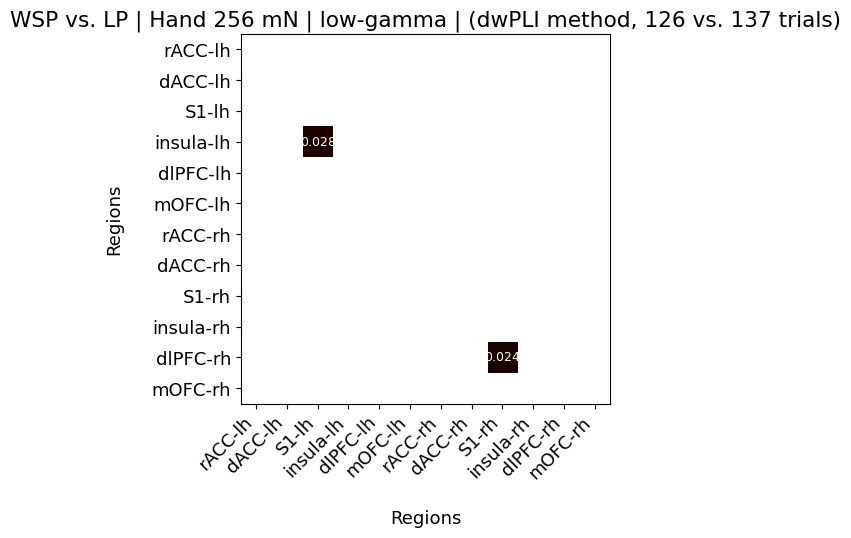

Hand 256 mN - Chronic Widespread Pain vs. Chronic Localized Pain - wpli2_debiased - high-gamma
Top 3 Connections in Chronic Widespread Pain group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
| dlPFC-rh <-> dACC-lh  |   2/12    |     0.222     |
| dlPFC-rh <-> dACC-rh  |   2/12    |     0.146     |
| dACC-rh <-> insula-lh |   2/12    |     0.152     |
+-----------------------+-----------+---------------+ 

Top 3 Connections in Chronic Localized Pain group
+------------------------+-----------+---------------+
|       Connection       | Frequency | Mean Strength |
+------------------------+-----------+---------------+
| mOFC-lh <-> insula-lh  |   2/12    |     0.169     |
| dlPFC-rh <-> insula-rh |   2/12    |     0.136     |
|   S1-lh <-> dACC-lh    |   2/12    |     0.144     |
+------------------------+-----------+---------------+ 

(12, 12, 12)

Num epochs: 126 vs. 137

<Figure size 640x480 with 0 Axes>

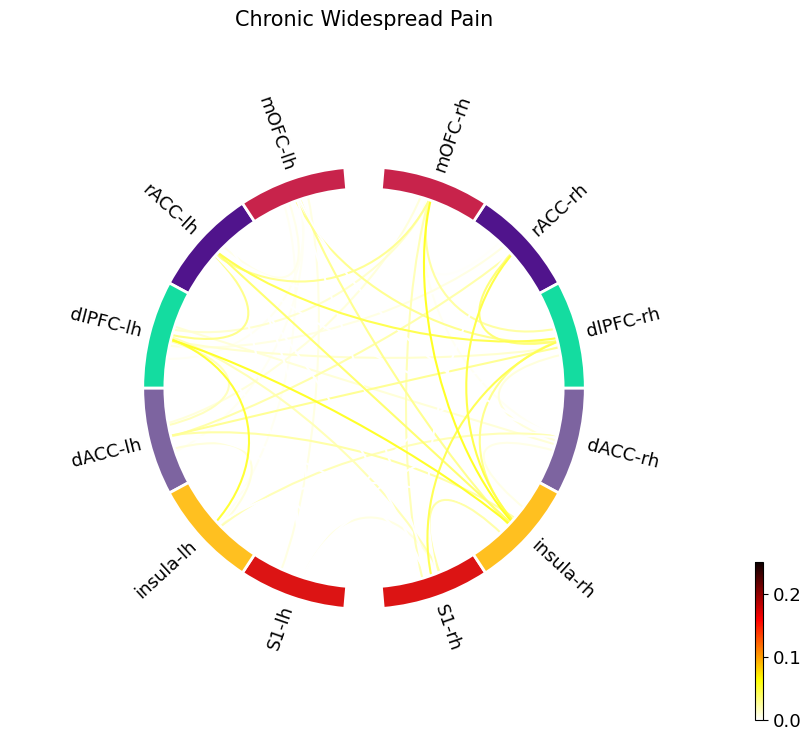

<Figure size 640x480 with 0 Axes>

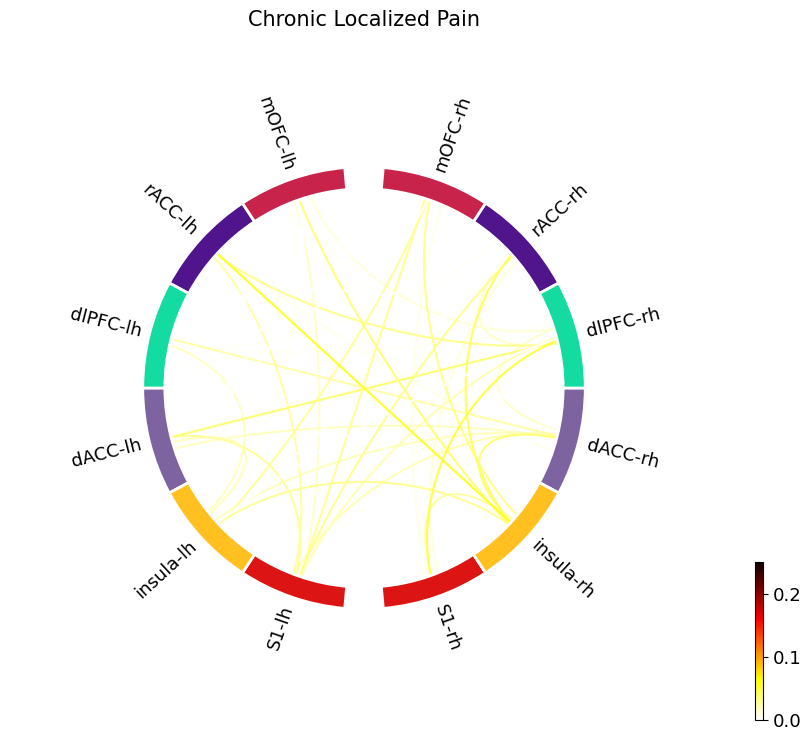

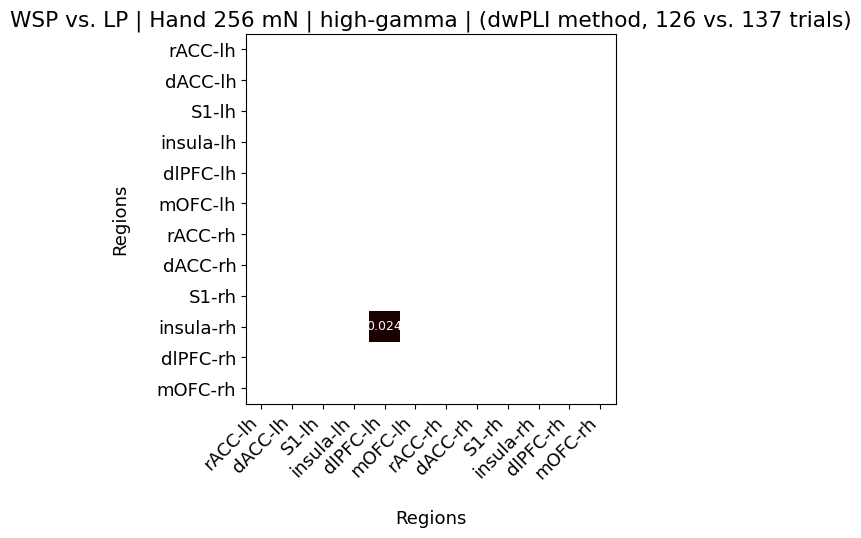

Eyes Open - Chronic Widespread Pain vs. Chronic Localized Pain - aec_symmetric - theta
Top 3 Connections in Chronic Widespread Pain group
+------------------------+-----------+---------------+
|       Connection       | Frequency | Mean Strength |
+------------------------+-----------+---------------+
|  mOFC-rh <-> mOFC-lh   |   3/12    |      0.8      |
| mOFC-lh <-> insula-lh  |   3/12    |     0.815     |
| dlPFC-rh <-> insula-rh |   2/12    |     0.786     |
+------------------------+-----------+---------------+ 

Top 3 Connections in Chronic Localized Pain group
+------------------------+-----------+---------------+
|       Connection       | Frequency | Mean Strength |
+------------------------+-----------+---------------+
|  dlPFC-rh <-> rACC-rh  |   2/12    |     0.73      |
|  rACC-rh <-> rACC-lh   |   2/12    |     0.79      |
| dlPFC-rh <-> insula-lh |   2/12    |     0.744     |
+------------------------+-----------+---------------+ 

(12, 12, 12)

Num epochs: 144 vs. 144


<Figure size 640x480 with 0 Axes>

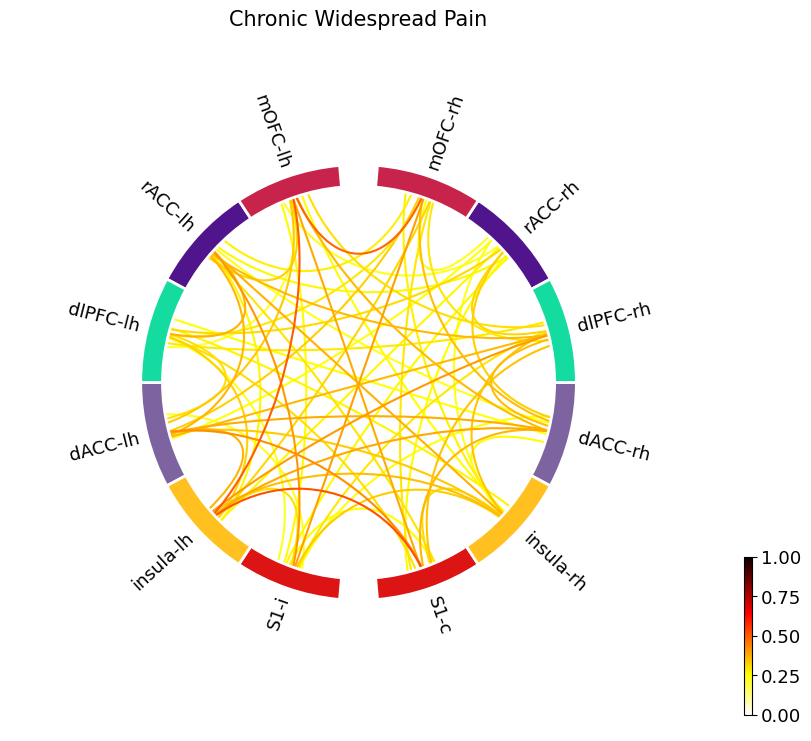

<Figure size 640x480 with 0 Axes>

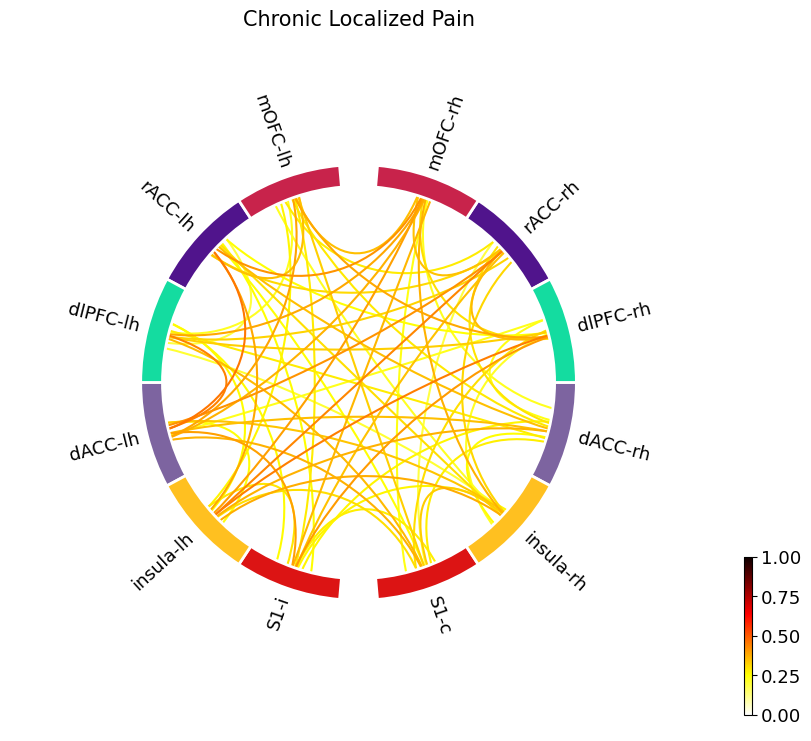

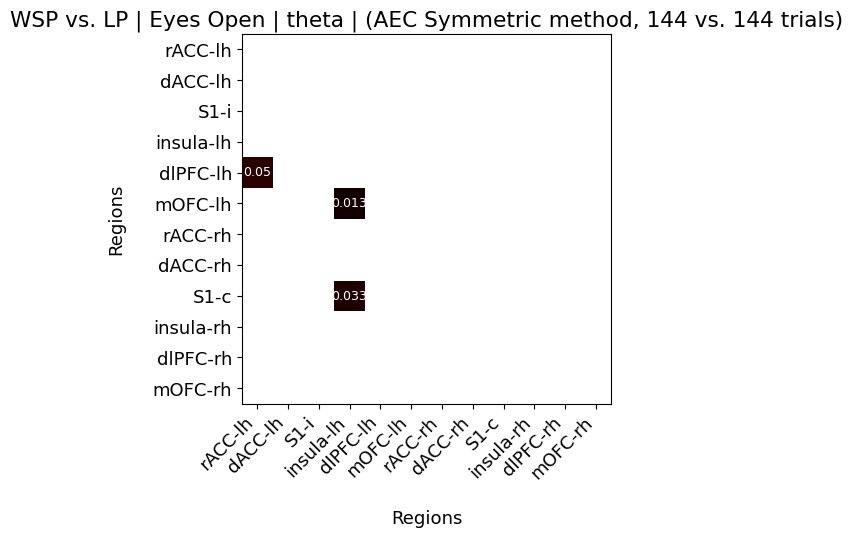

Eyes Open - Chronic Widespread Pain vs. Chronic Localized Pain - aec_symmetric - alpha
Top 3 Connections in Chronic Widespread Pain group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
|  mOFC-rh <-> rACC-lh  |   2/12    |     0.702     |
|  mOFC-lh <-> dACC-lh  |   2/12    |     0.784     |
| insula-rh <-> dACC-rh |   2/12    |     0.835     |
+-----------------------+-----------+---------------+ 

Top 3 Connections in Chronic Localized Pain group
+---------------------+-----------+---------------+
|     Connection      | Frequency | Mean Strength |
+---------------------+-----------+---------------+
| insula-rh <-> S1-c  |   2/12    |     0.66      |
| mOFC-lh <-> rACC-lh |   2/12    |     0.623     |
|  S1-c <-> mOFC-lh   |   2/12    |     0.684     |
+---------------------+-----------+---------------+ 

(12, 12, 12)

Num epochs: 144 vs. 144

Mann-Whitney U Test Between

<Figure size 640x480 with 0 Axes>

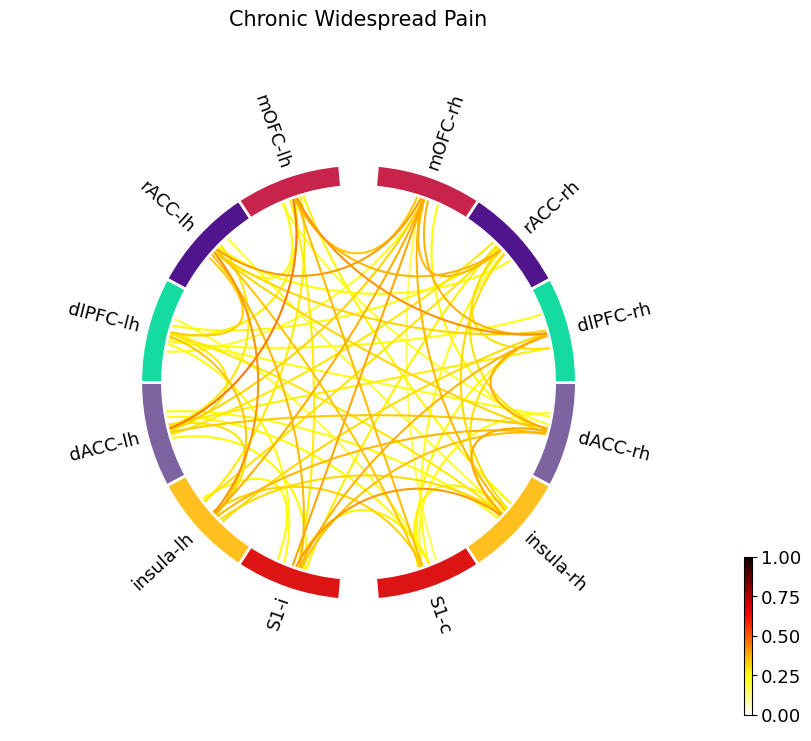

<Figure size 640x480 with 0 Axes>

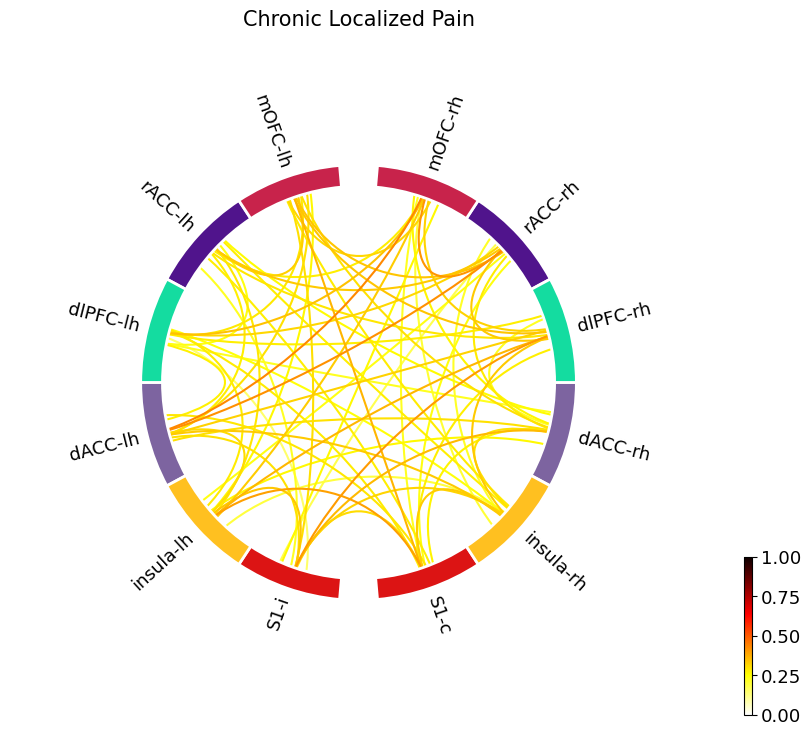

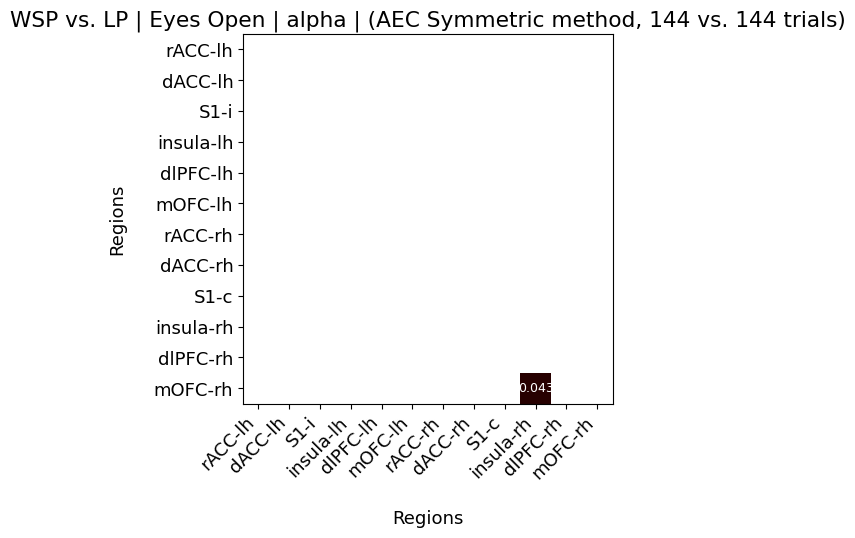

Eyes Open - Chronic Widespread Pain vs. Chronic Localized Pain - aec_symmetric - beta
Top 3 Connections in Chronic Widespread Pain group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
|  dACC-rh <-> dACC-lh  |   2/12    |     0.402     |
| insula-rh <-> rACC-rh |   2/12    |     0.461     |
| dACC-rh <-> insula-lh |   2/12    |     0.466     |
+-----------------------+-----------+---------------+ 

Top 3 Connections in Chronic Localized Pain group
+----------------------+-----------+---------------+
|      Connection      | Frequency | Mean Strength |
+----------------------+-----------+---------------+
| rACC-rh <-> rACC-lh  |   5/12    |     0.476     |
| dlPFC-rh <-> rACC-rh |   2/12    |     0.479     |
|   S1-c <-> rACC-lh   |   2/12    |     0.43      |
+----------------------+-----------+---------------+ 

(12, 12, 12)

Num epochs: 144 vs. 144

Mann-Whitney U Test B

<Figure size 640x480 with 0 Axes>

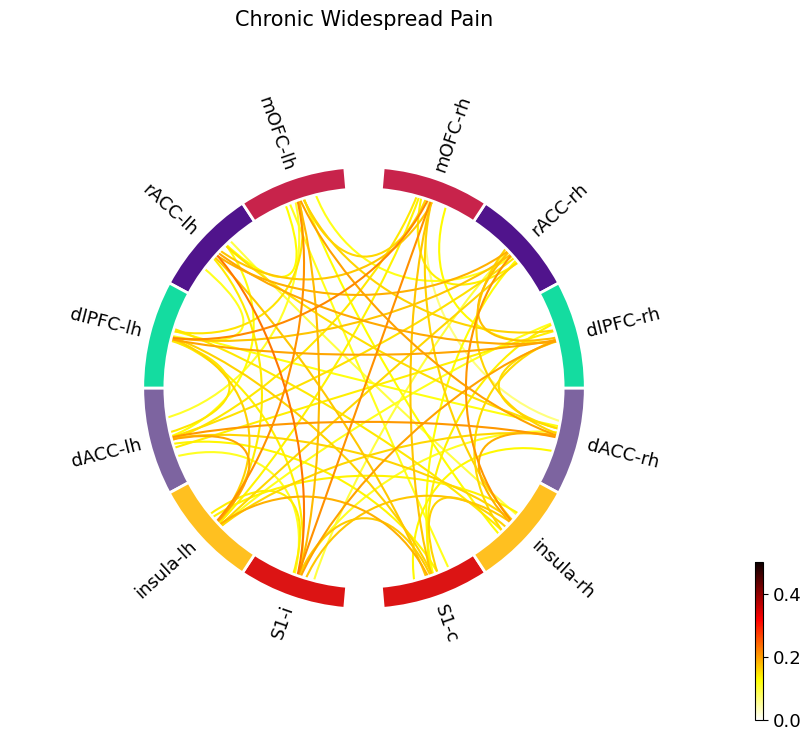

<Figure size 640x480 with 0 Axes>

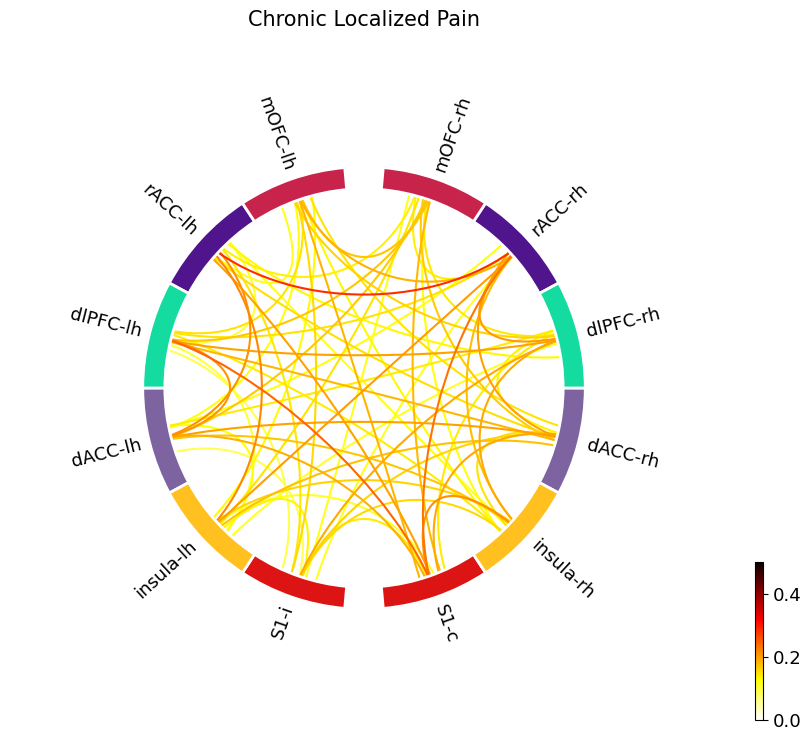

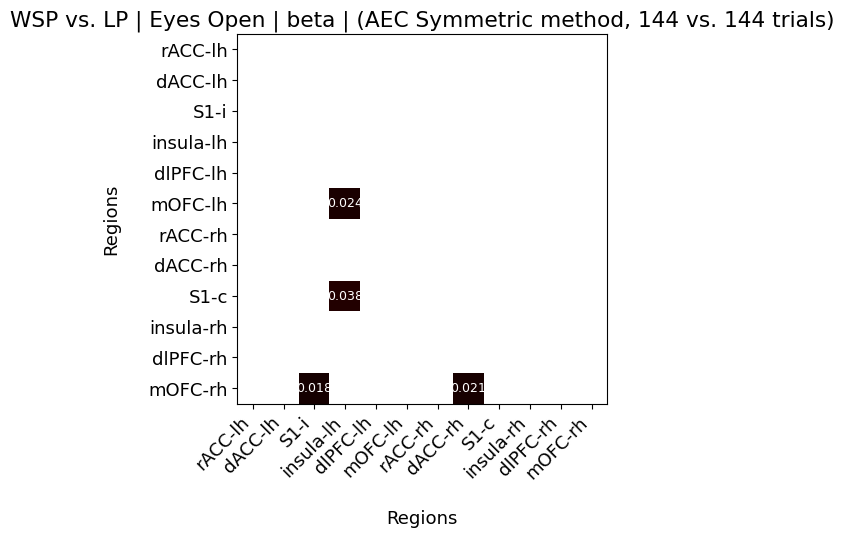

Eyes Open - Chronic Widespread Pain vs. Chronic Localized Pain - aec_symmetric - low-gamma
Top 3 Connections in Chronic Widespread Pain group
+----------------------+-----------+---------------+
|      Connection      | Frequency | Mean Strength |
+----------------------+-----------+---------------+
| rACC-rh <-> rACC-lh  |   4/12    |     0.435     |
| rACC-rh <-> dlPFC-lh |   2/12    |     0.388     |
| dlPFC-lh <-> rACC-lh |   2/12    |     0.392     |
+----------------------+-----------+---------------+ 

Top 3 Connections in Chronic Localized Pain group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
| insula-rh <-> rACC-rh |   3/12    |     0.392     |
| insula-rh <-> rACC-lh |   2/12    |     0.287     |
|  rACC-rh <-> mOFC-lh  |   2/12    |     0.353     |
+-----------------------+-----------+---------------+ 

(12, 12, 12)

Num epochs: 144 vs. 144

Mann-Whitney U T

<Figure size 640x480 with 0 Axes>

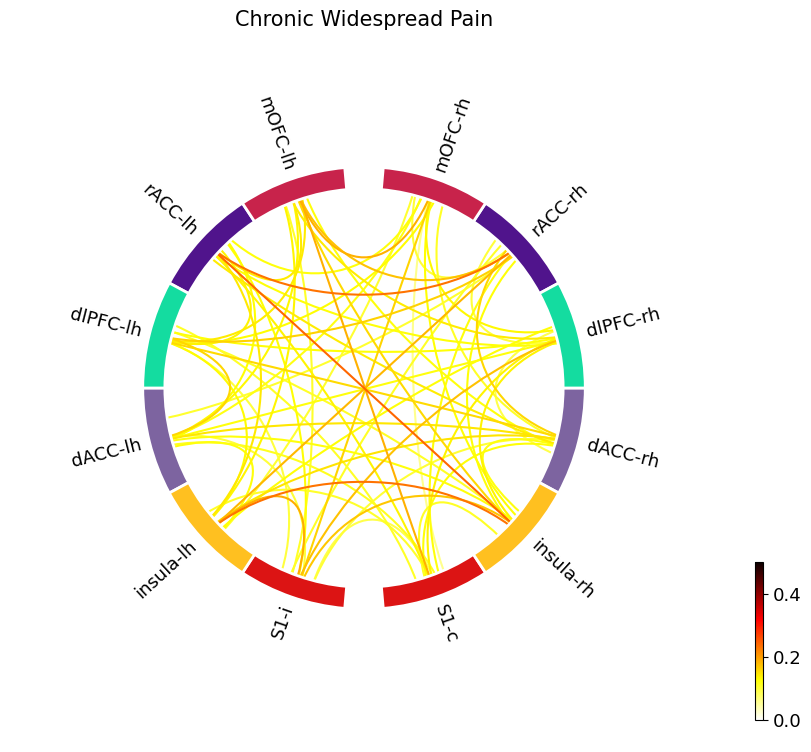

<Figure size 640x480 with 0 Axes>

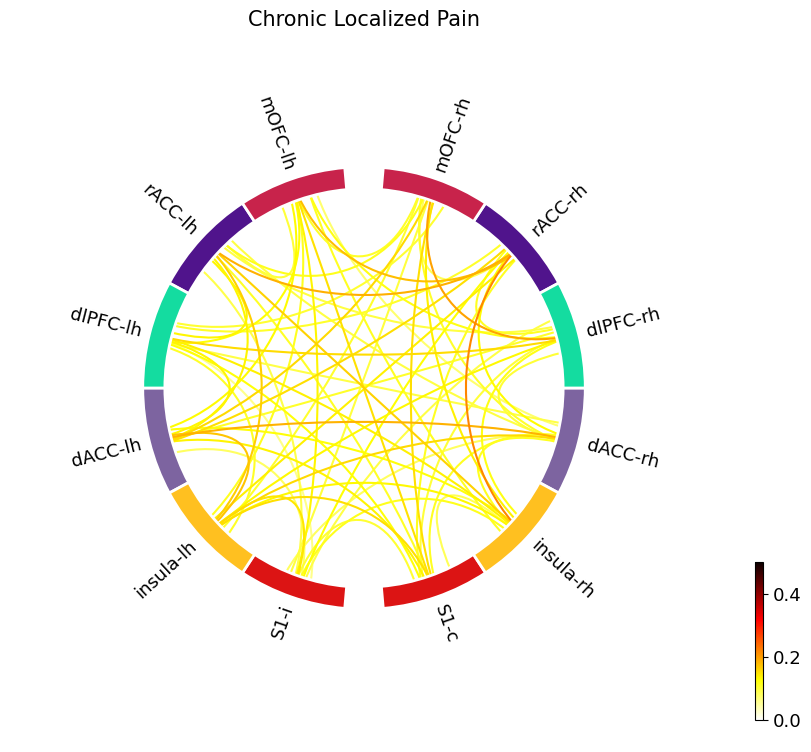

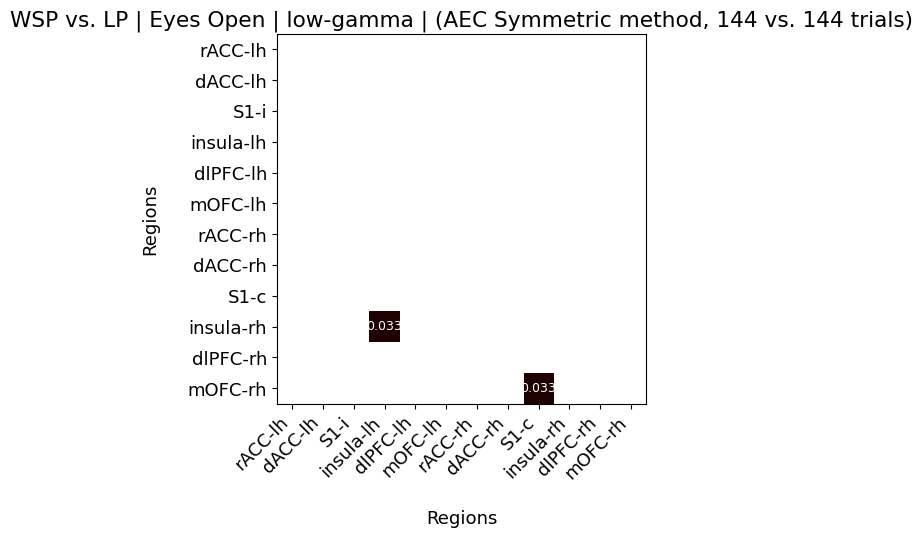

Eyes Open - Chronic Widespread Pain vs. Chronic Localized Pain - aec_symmetric - high-gamma
Top 3 Connections in Chronic Widespread Pain group
+-------------------------+-----------+---------------+
|       Connection        | Frequency | Mean Strength |
+-------------------------+-----------+---------------+
|  insula-rh <-> rACC-rh  |   3/12    |     0.453     |
| insula-rh <-> insula-lh |   3/12    |     0.335     |
|  insula-lh <-> rACC-lh  |   2/12    |     0.393     |
+-------------------------+-----------+---------------+ 

Top 3 Connections in Chronic Localized Pain group
+-----------------------+-----------+---------------+
|      Connection       | Frequency | Mean Strength |
+-----------------------+-----------+---------------+
| insula-rh <-> rACC-rh |   3/12    |     0.46      |
| insula-rh <-> rACC-lh |   2/12    |     0.288     |
|  mOFC-lh <-> dACC-lh  |   2/12    |     0.295     |
+-----------------------+-----------+---------------+ 

(12, 12, 12)

Num epochs: 144 vs.

<Figure size 640x480 with 0 Axes>

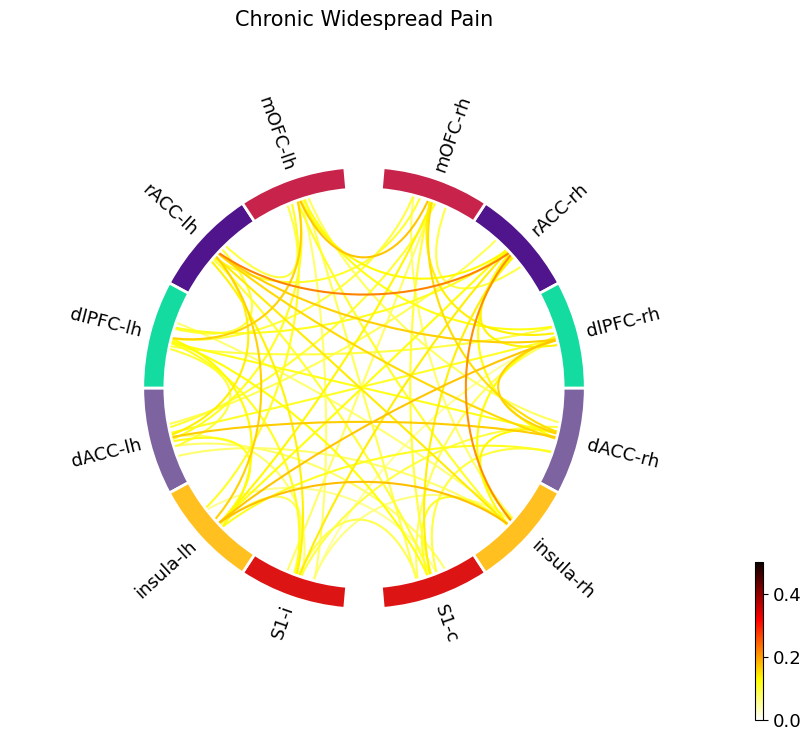

<Figure size 640x480 with 0 Axes>

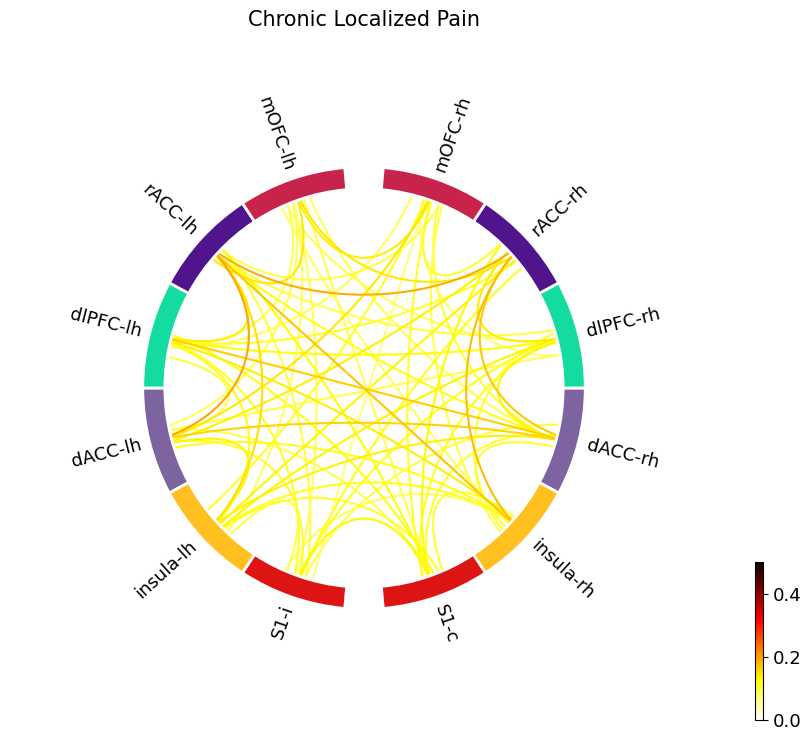

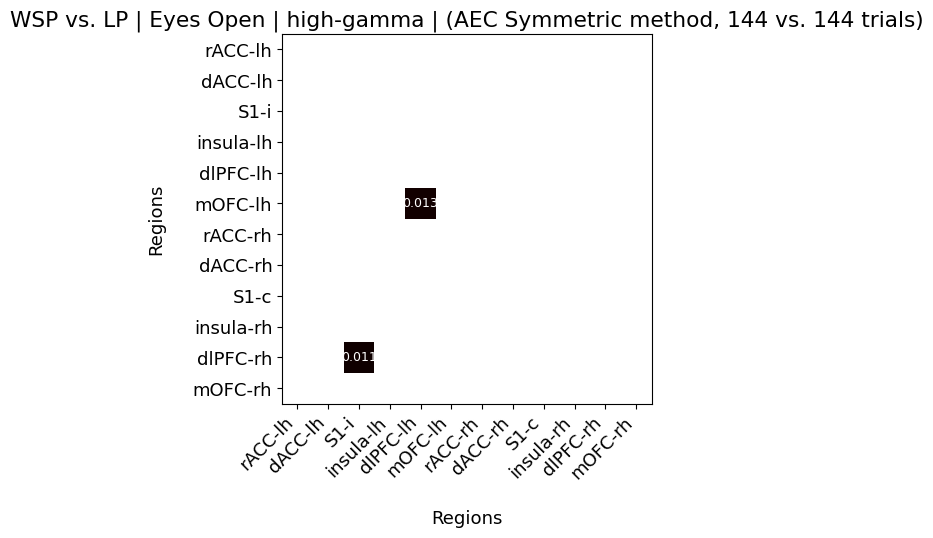

In [ ]:
# Widespread Pain vs Localized Pain
these_group_names = ["Chronic Widespread Pain", "Chronic Localized Pain", "Mann_Whitney_U_test"]
these_group_cons = [group_con_WSP, group_con_LP]
these_sub_cons = [sub_con_WSP, sub_con_LP]
these_sub_ids = [sub_ids_WSP, sub_ids_LP]

sig_pairs_WSP_LP = {}

for condition in conditions:

    sig_pairs_WSP_LP[condition] = {}

    for method in con_methods:

        sig_pairs_WSP_LP[condition][method] = {}

        # Ignore some specific condition/method combinations
        if condition=="Hand 256 mN" and "aec" in method:
            continue
        elif condition=="Eyes Open" and method=="wpli2_debiased":
            continue
        
        for band in band_names:
            # Select groups for mann-whitney
            print(f"{condition} - {these_group_names[0]} vs. {these_group_names[1]} - {method} - {band}")
        
            # For each of the top 3 connections, add the connection, its frequency, and its mean strength to a list  
            top_3_info=None
            group_con=None
            for group_con,group_name,sub_con in zip(these_group_cons, these_group_names, these_sub_cons):
                table_data = []  
                top_3_info = group_con[condition][method][band]["top 3"] 
                print(f"Top 3 Connections in {group_name} group")
                for i in range(3):  
                    connection = top_3_info["connections"][i]  
                    frequency = top_3_info["frequency"][i]  
                    mean_strength = top_3_info["mean strength"][i]
                    if 'Eyes' in condition:
                        table_data.append([f"{roi_acronyms_resting[connection[0]]} <-> {roi_acronyms_resting[connection[1]]}", f"{frequency}/{len(sub_con)}", mean_strength]) 
                    else:
                        table_data.append([f"{roi_acronyms[connection[0]]} <-> {roi_acronyms[connection[1]]}", f"{frequency}/{len(sub_con)}", mean_strength]) 
                        
                # Define table headers  
                headers = ['Connection', 'Frequency', 'Mean Strength']  
                
                # Print the table  
                print(tabulate(table_data, headers, tablefmt='pretty'),'\n')  

            group1_stack = these_group_cons[0][condition][method][band]["data"]
            print(group1_stack.shape)
            group2_stack = these_group_cons[1][condition][method][band]["data"]

            nepochs_1 = these_group_cons[0][condition]['num_epochs']
            nepochs_2 = these_group_cons[1][condition]['num_epochs']
            
            # Compute the Mann-Whitney U test
            p_values, means_1, sem_1, means_2, sem_2 = fc.mann_whitney_test(
                group1_stack,
                group2_stack,
                roi_acronyms=roi_acronyms if 'Eyes' not in condition else roi_acronyms_resting,
                sub_ids1=these_sub_ids[0],
                sub_ids2=these_sub_ids[1],
                condition=condition,
                bilateral_pain_ids=bilateral_pain_ids,
                round_neg_vals=round_neg_vals,
                method=method)
            
            #print(p_values)

            # Need to custom set this because the colors blow out
            if 'Eyes' in condition and band in ["theta","alpha"]:
                vmin = 0.0
                vmax = 1.0
            elif 'Eyes' in condition and band not in ["theta","alpha"]:
                vmin = 0.0
                vmax = 0.5
            else:
                vmin = None
                vmax = None
            
            # Plotting
            # Gather the information for plotting
            plot_kwargs= dict(
                method=method,
                band=band, 
                roi_names=roi_names,
                roi_acronyms=roi_acronyms if 'Eyes' not in condition else roi_acronyms_resting,
                condition=condition,
                vmin=vmin,
                vmax=vmax,
                group_names=these_group_names,
                nepochs=[nepochs_1, nepochs_2],
                titles=[these_group_names[0], 
                        these_group_names[1],
                        "WSP vs. LP",],
                save_names=["Mann_Whitney_U_test",
                            these_group_names[0], 
                            these_group_names[1],
                            ],
                save_path='',
                )
 
            print(f"\nNum epochs: {nepochs_1} vs. {nepochs_2}")               
            sig_pairs_WSP_LP[condition][method][band] = fc.plot_connectivity_and_stats(means_1=means_1,
                                        means_2=means_2,
                                        sem_1=sem_1,
                                        sem_2=sem_2,
                                        p_values=p_values,
                                        **plot_kwargs,
                                        save_fig=True,
                                        highlight_pvals=highlight_pvals,
                                        min_fc_val=None,
                                        set_title=set_title,
                                        show_fc_vals=show_fc_vals,
                                        round_neg_vals=round_neg_vals,
            )

In [ ]:
#testtest
#not a necessary block of code, just testing
for condition in conditions:
    for method in con_methods:
        # Ignore some specific condition/method combinations
        if condition=="Hand 256 mN" and "aec" in method:
            continue
        elif condition=="Eyes Open" and method=="wpli2_debiased":
            continue
        for band in band_names:
            print(f"{condition} - {method} - {band}")
            for i in range(0, len(sig_pairs_CP_HC[condition][method][band])):
                print(sig_pairs_CP_HC[condition][method][band][i])
            print()

Hand 256 mN - wpli2_debiased - theta
['insula-lh', 'rACC-lh', 0.0382, '0.044 ± 0.046', '-0.049 ± 0.033']
['S1-rh', 'dACC-lh', 0.0195, '-0.074 ± 0.025', '0.094 ± 0.054']

Hand 256 mN - wpli2_debiased - alpha
['dACC-rh', 'insula-lh', 0.0471, '0.017 ± 0.036', '-0.073 ± 0.021']

Hand 256 mN - wpli2_debiased - beta
['dACC-rh', 'rACC-rh', 0.0355, '-0.053 ± 0.018', '0.011 ± 0.018']
['S1-rh', 'dACC-rh', 0.0331, '0.062 ± 0.03', '-0.029 ± 0.019']
['dlPFC-rh', 'rACC-rh', 0.018, '0.037 ± 0.023', '-0.03 ± 0.024']
['mOFC-rh', 'rACC-lh', 0.0055, '-0.061 ± 0.019', '0.028 ± 0.022']
['mOFC-rh', 'dACC-lh', 0.002, '-0.049 ± 0.015', '0.05 ± 0.025']
['mOFC-rh', 'rACC-rh', 0.012, '-0.047 ± 0.019', '0.025 ± 0.019']
['mOFC-rh', 'dACC-rh', 0.0142, '-0.039 ± 0.023', '0.037 ± 0.02']
['mOFC-rh', 'dlPFC-rh', 0.0307, '0.027 ± 0.03', '-0.027 ± 0.019']

Hand 256 mN - wpli2_debiased - low-gamma
['rACC-rh', 'mOFC-lh', 0.0307, '0.023 ± 0.024', '-0.032 ± 0.016']
['dACC-rh', 'rACC-lh', 0.0285, '0.063 ± 0.017', '0.002 ± 0.0

In [ ]:
#testtest
#not a necessary block of code, just testing
for condition in conditions:
    for method in con_methods:
        # Ignore some specific condition/method combinations
        if condition=="Hand 256 mN" and "aec" in method:
            continue
        elif condition=="Eyes Open" and method=="wpli2_debiased":
            continue
        for band in band_names:
            print(f"{condition} - {method} - {band}")
            for i in range(0, len(sig_pairs_WSP_LP[condition][method][band])):
                print(sig_pairs_WSP_LP[condition][method][band][i])
            print()

Hand 256 mN - wpli2_debiased - theta
['insula-rh', 'rACC-lh', 0.0326, '0.138 ± 0.064', '-0.047 ± 0.051']
['insula-rh', 'rACC-rh', 0.0209, '0.039 ± 0.062', '-0.09 ± 0.033']
['dlPFC-rh', 'dACC-rh', 0.0376, '0.065 ± 0.039', '-0.05 ± 0.024']

Hand 256 mN - wpli2_debiased - alpha
['S1-rh', 'S1-lh', 0.0282, '-0.125 ± 0.031', '-0.017 ± 0.037']

Hand 256 mN - wpli2_debiased - beta
['rACC-rh', 'rACC-lh', 0.0209, '-0.074 ± 0.019', '0.002 ± 0.02']
['dlPFC-rh', 'S1-lh', 0.0066, '-0.046 ± 0.027', '0.066 ± 0.024']
['dlPFC-rh', 'insula-rh', 0.0179, '0.085 ± 0.036', '-0.044 ± 0.028']

Hand 256 mN - wpli2_debiased - low-gamma
['insula-lh', 'S1-lh', 0.0282, '0.038 ± 0.022', '-0.031 ± 0.017']
['dlPFC-rh', 'S1-rh', 0.0243, '0.049 ± 0.026', '-0.03 ± 0.02']

Hand 256 mN - wpli2_debiased - high-gamma
['insula-rh', 'dlPFC-lh', 0.0243, '0.053 ± 0.018', '-0.01 ± 0.014']

Eyes Open - aec_symmetric - theta
['dlPFC-lh', 'rACC-lh', 0.0496, '0.369 ± 0.066', '0.194 ± 0.044']
['mOFC-lh', 'insula-lh', 0.013, '0.497 ± 0

### Compare original and surrogate connectivity values -- CP vs. HC

In [ ]:
new_pvals_CP_HC = {}

for condition in conditions:

    new_pvals_CP_HC[condition] = {}

    for method in con_methods:
        # Ignore some specific condition/method combinations
        if condition=="Hand 256 mN" and "aec" in method:
            continue
        elif condition=="Eyes Open" and method=="wpli2_debiased":
            continue

        new_pvals_CP_HC[condition][method] = {}

        for band in band_names:

            new_pvals_CP_HC[condition][method][band] = {}

            for i in range(0, len(sig_pairs_CP_HC[condition][method][band])):
                roi1 = sig_pairs_CP_HC[condition][method][band][i][0]
                roi2 = sig_pairs_CP_HC[condition][method][band][i][1]
                pval = sig_pairs_CP_HC[condition][method][band][i][2]
                mean1 = sig_pairs_CP_HC[condition][method][band][i][3]
                mean2 = sig_pairs_CP_HC[condition][method][band][i][4]

                roi_index1 = 0
                roi_index2 = 0

                if 'Eyes' in condition:
                    roi_index1 = roi_acronyms_resting.index(roi1)
                    roi_index2 = roi_acronyms_resting.index(roi2)
                else:
                    roi_index1 = roi_acronyms.index(roi1)
                    roi_index2 = roi_acronyms.index(roi2)
                
                #print(condition, method, band, roi_index1, roi_index2, pval, mean1, mean2)
                new_pvals_CP_HC[condition][method][band][roi_index1] = {}
                new_pvals_CP_HC[condition][method][band][roi_index1][roi_index2] = {}

                # Gather connectivity info for whichever mean is greater
                if mean1 > mean2:
                    sub_ids = sub_ids_CP
                    sub_con = sub_con_CP
                    all_sub_con = all_sub_con_CP
                else:
                    sub_ids = sub_con_HC
                    sub_con = sub_con_HC
                    all_sub_con = all_sub_con_HC

                for sub_id in sub_ids:
                    # Find this subject's original data connectivity for this ROI pair
                    orig_connectivity = sub_con[sub_id][condition][method][band]['data'][roi_index1][roi_index2]
                    # Gather connectivities from this subject's surrogate data for this ROI pair
                    all_connectivities = []
                    # Keep count of how many surrogate data connectivity values are greater than the original connectivity
                    greater_than = 0
                    for i in range(0, repetitions):
                        temp_conn = all_sub_con[i][sub_id][condition][method][band]['data'][roi_index1][roi_index2]
                        if temp_conn > orig_connectivity:
                            greater_than += 1
                        all_connectivities.append(temp_conn)
                    # Add the fraction of surr. connectivities > orig. connectivity, the orig. value, and array of the surrogate values to dictionary
                    new_pvals_CP_HC[condition][method][band][roi_index1][roi_index2][sub_id] = [greater_than, orig_connectivity, all_connectivities]

    

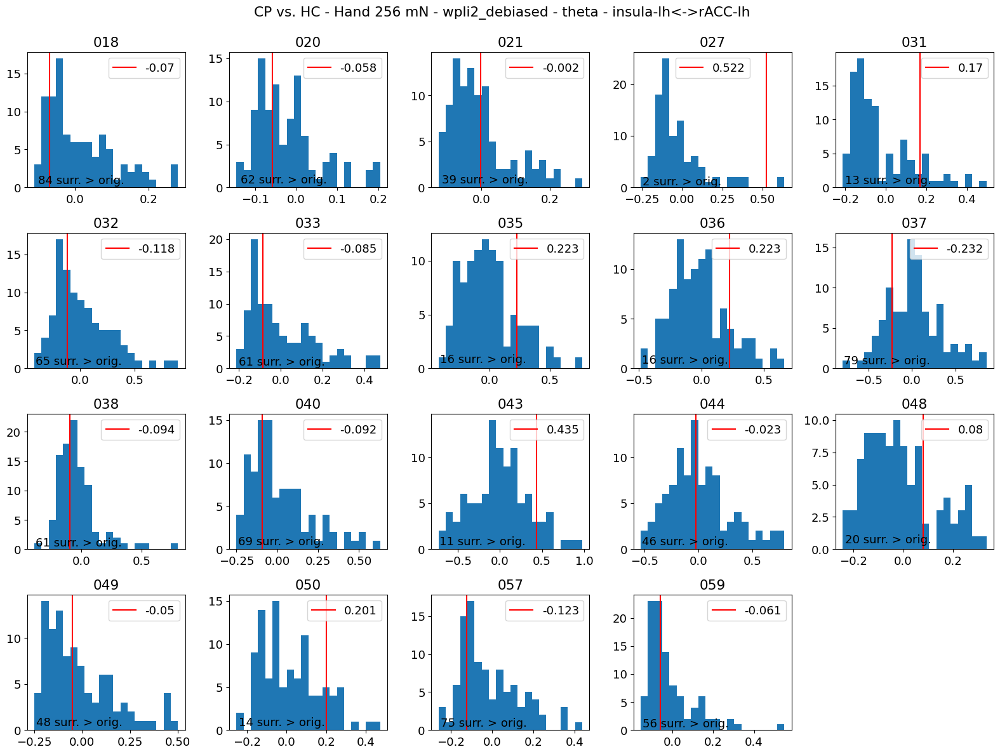

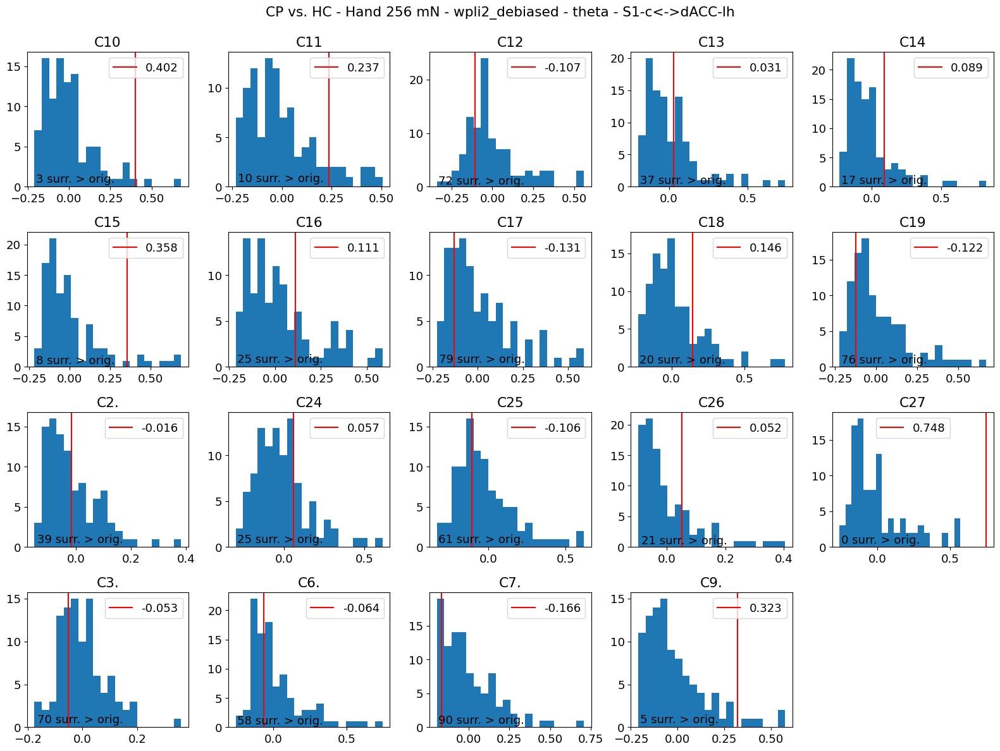

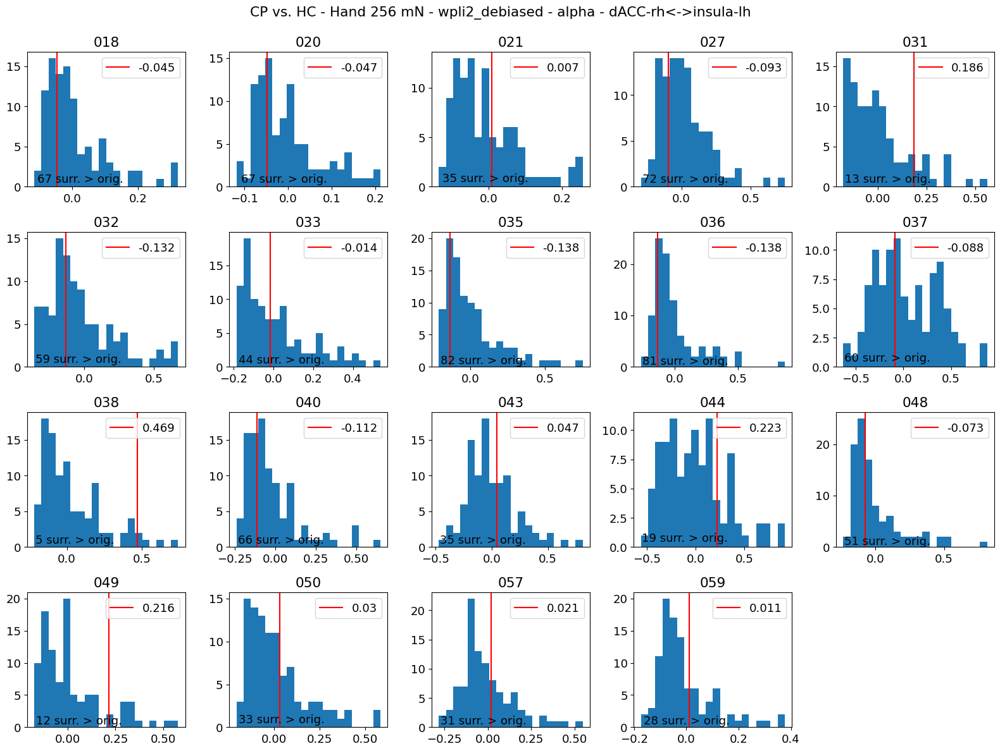

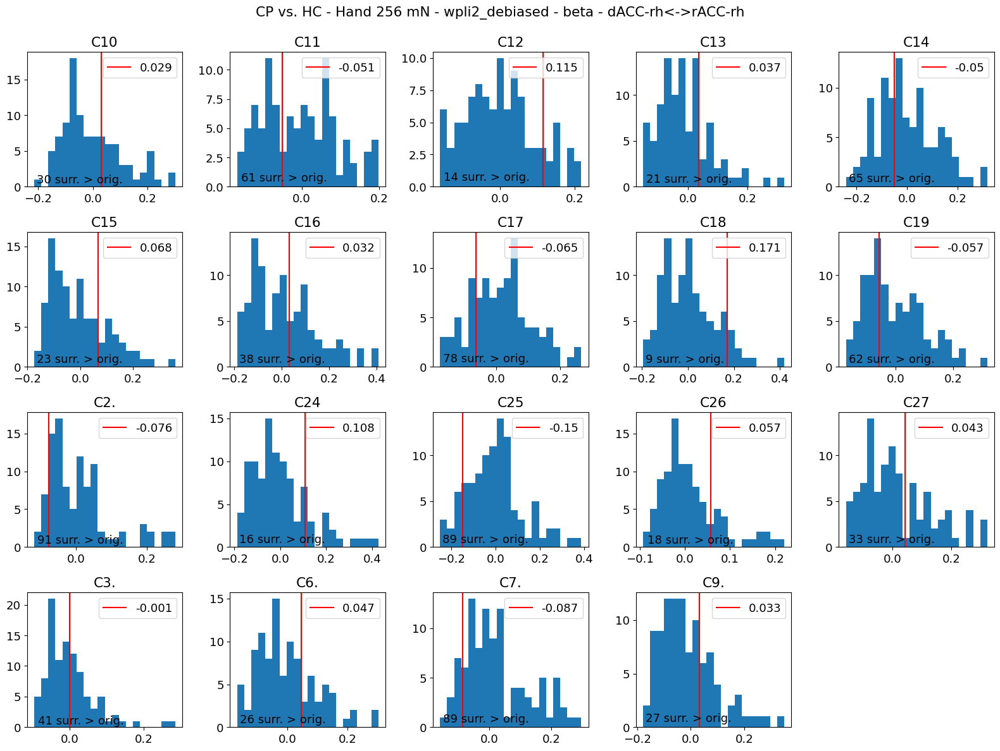

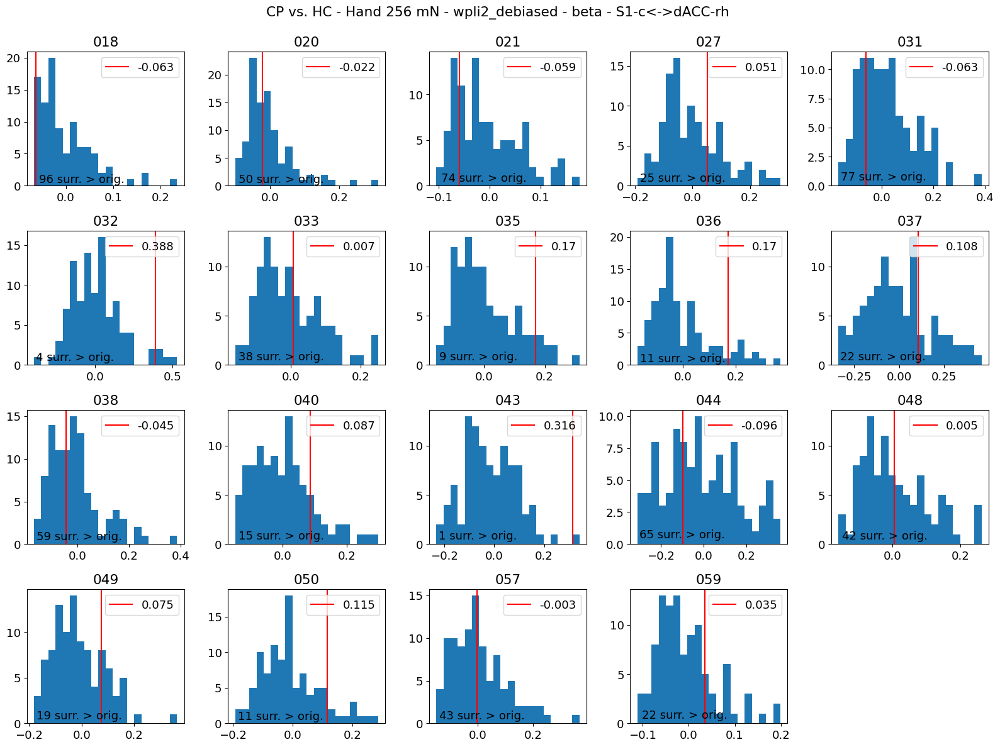

...

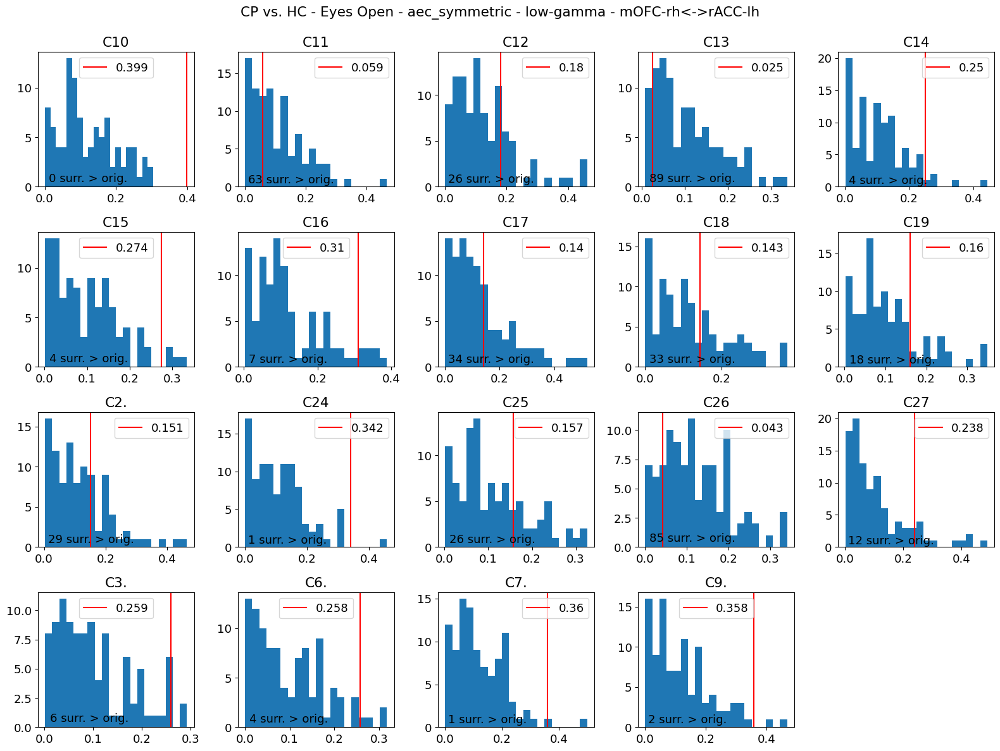

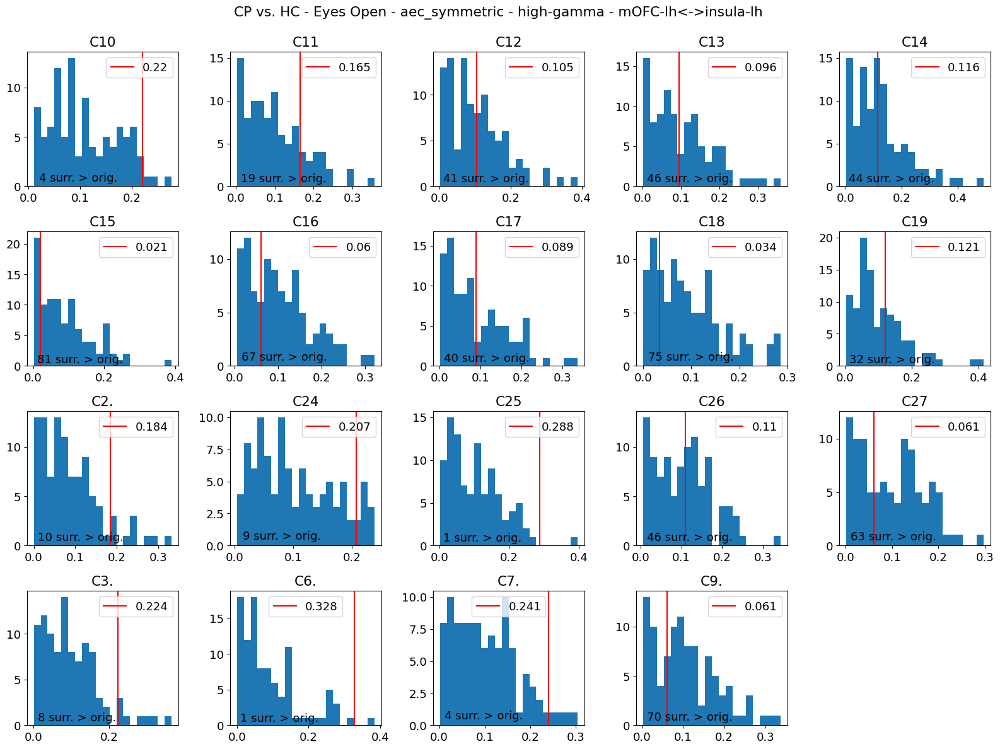

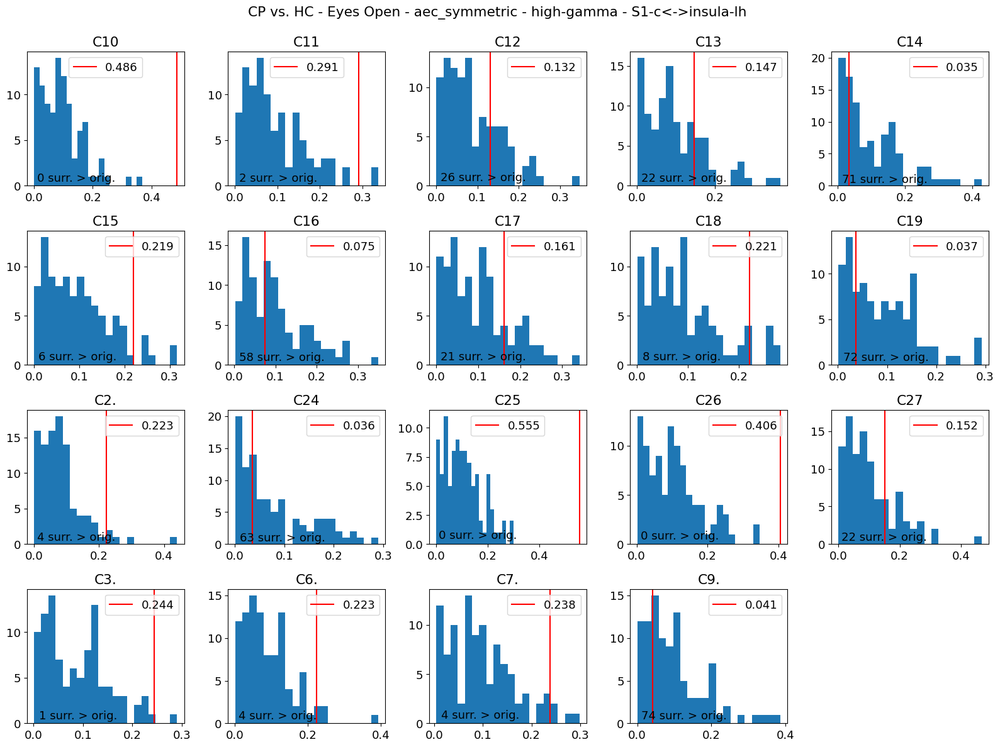

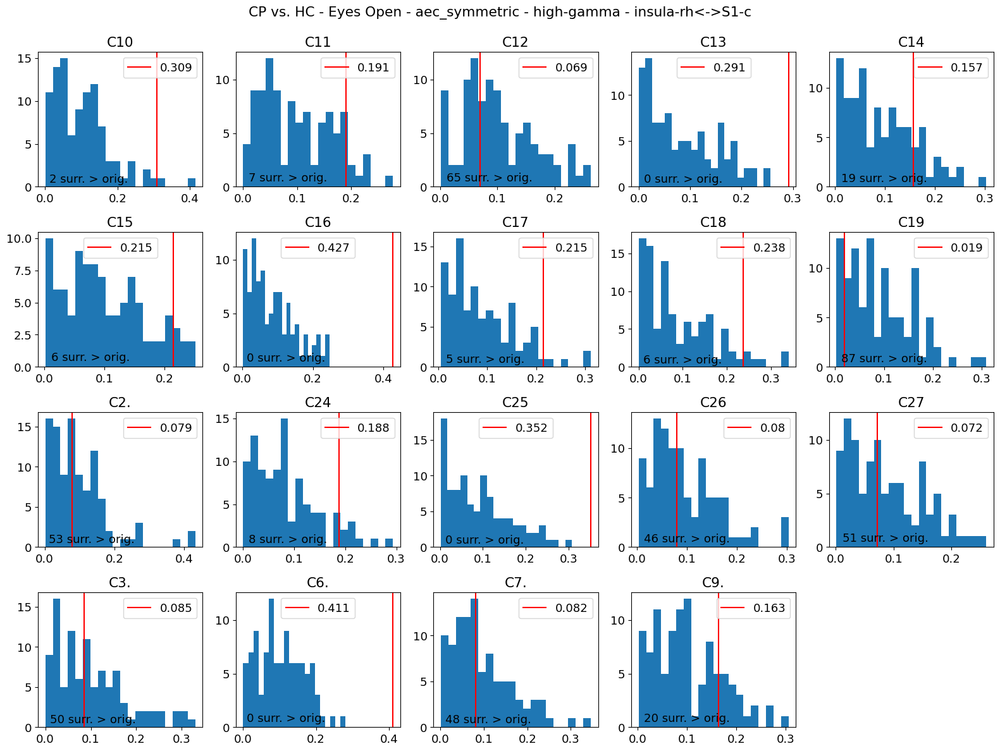

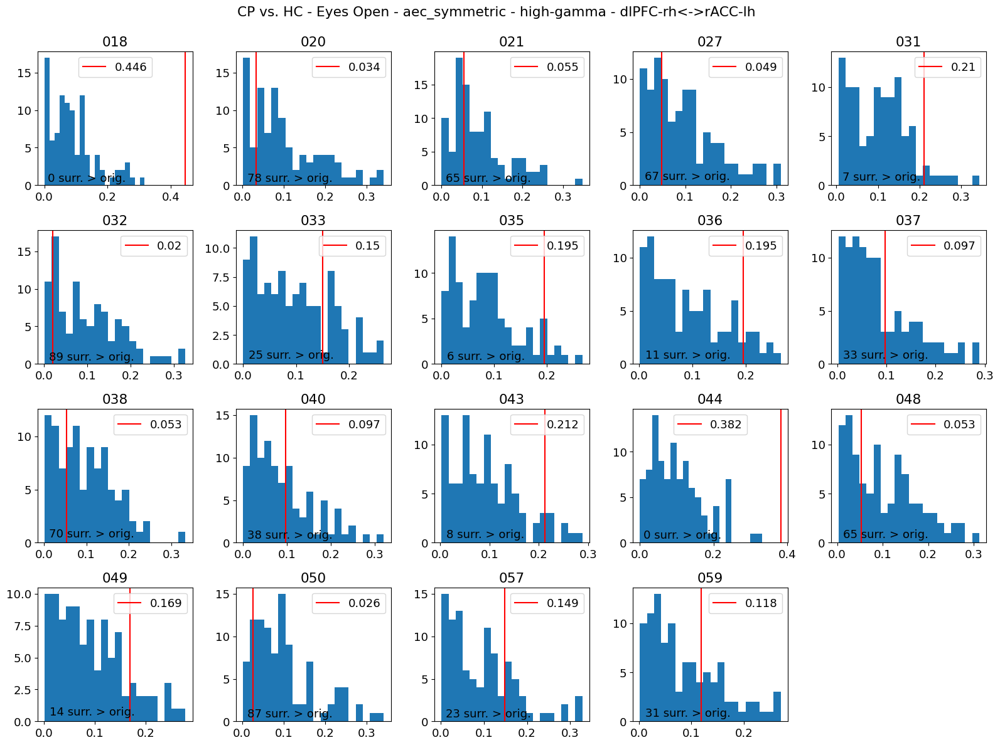

In [ ]:
with PdfPages('CP_HC_output_figures_bin-num20.pdf') as pdf:
    for condition in conditions:  
        for method in con_methods:
            # Ignore some specific condition/method combinations
            if condition=="Hand 256 mN" and "aec" in method:
                continue
            elif condition=="Eyes Open" and method=="wpli2_debiased":
                continue
            for band in band_names:
                temp = new_pvals_CP_HC[condition][method][band]
                for roi1 in temp.keys():
                    temp2 = temp[roi1]
                    for roi2 in temp2.keys():
                        temp3 = temp2[roi2]

                        plt.figure(figsize=(16,12))
                        plt.suptitle('CP vs. HC - ' + condition + ' - ' + method + ' - ' + band + ' - ' + roi_acronyms_resting[roi1] + '<->' + roi_acronyms_resting[roi2], y=0.99)
                        count = 1
                        for sub_id in temp3.keys():
                            greater_than = temp3[sub_id][0]
                            orig_conn = temp3[sub_id][1]
                            connectivities = temp3[sub_id][2]
                            connectivities.sort()

                            plt.subplot(4,5,count)
                            plt.title(sub_id)
                            plt.hist(connectivities, 20, (connectivities[0], connectivities[len(connectivities)-1]))
                            plt.axvline(x=orig_conn, color='red', label=round(orig_conn,3))
                            plt.text(connectivities[0]+0.01, 0.5, str(greater_than)+' surr. > orig.')
                            plt.legend()
                            
                            count += 1
                        plt.tight_layout()
                        pdf.savefig()
                        plt.show()
                        plt.close()
               

### Compare original and surrogate connectivity values -- WSP vs. LP

In [ ]:
new_pvals_WSP_LC = {}

for condition in conditions:

    new_pvals_WSP_LC[condition] = {}
    
    for method in con_methods:
        # Ignore some specific condition/method combinations
        if condition=="Hand 256 mN" and "aec" in method:
            continue
        elif condition=="Eyes Open" and method=="wpli2_debiased":
            continue

        new_pvals_WSP_LC[condition][method] = {}

        for band in band_names:

            new_pvals_WSP_LC[condition][method][band] = {}

            for i in range(0, len(sig_pairs_WSP_LP[condition][method][band])):
                roi1 = sig_pairs_WSP_LP[condition][method][band][i][0]
                roi2 = sig_pairs_WSP_LP[condition][method][band][i][1]
                pval = sig_pairs_WSP_LP[condition][method][band][i][2]
                mean1 = sig_pairs_WSP_LP[condition][method][band][i][3]
                mean2 = sig_pairs_WSP_LP[condition][method][band][i][4]

                roi_index1 = 0
                roi_index2 = 0

                if 'Eyes' in condition:
                    roi_index1 = roi_acronyms_resting.index(roi1)
                    roi_index2 = roi_acronyms_resting.index(roi2)
                else:
                    roi_index1 = roi_acronyms.index(roi1)
                    roi_index2 = roi_acronyms.index(roi2)
                
                #print(condition, method, band, roi_index1, roi_index2, pval, mean1, mean2)
                new_pvals_WSP_LC[condition][method][band][roi_index1] = {}
                new_pvals_WSP_LC[condition][method][band][roi_index1][roi_index2] = {}

                # Gather connectivity info for whichever mean is greater
                if mean1 > mean2:
                    sub_ids = sub_ids_WSP
                    sub_con = sub_con_WSP
                    all_sub_con = all_sub_con_WSP
                else:
                    sub_ids = sub_ids_LP
                    sub_con = sub_con_LP
                    all_sub_con = all_sub_con_LP
                for sub_id in sub_ids:
                    # Find this subject's original data connectivity for this ROI pair
                    orig_connectivity = sub_con[sub_id][condition][method][band]['data'][roi_index1][roi_index2]
                    # Gather connectivities from this subject's surrogate data for this ROI pair
                    all_connectivities = []
                    # Keep count of how many surrogate data connectivity values are greater than the original connectivity
                    greater_than = 0
                    for i in range(0, repetitions):
                        temp_conn = all_sub_con[i][sub_id][condition][method][band]['data'][roi_index1][roi_index2]
                        if temp_conn > orig_connectivity:
                            greater_than += 1
                        all_connectivities.append(temp_conn)
                        # Add the fraction of surr. connectivities > orig. connectivity, the orig. value, and array of the surrogate values to dictionary
                        new_pvals_WSP_LC[condition][method][band][roi_index1][roi_index2][sub_id] = [greater_than, orig_connectivity, all_connectivities]

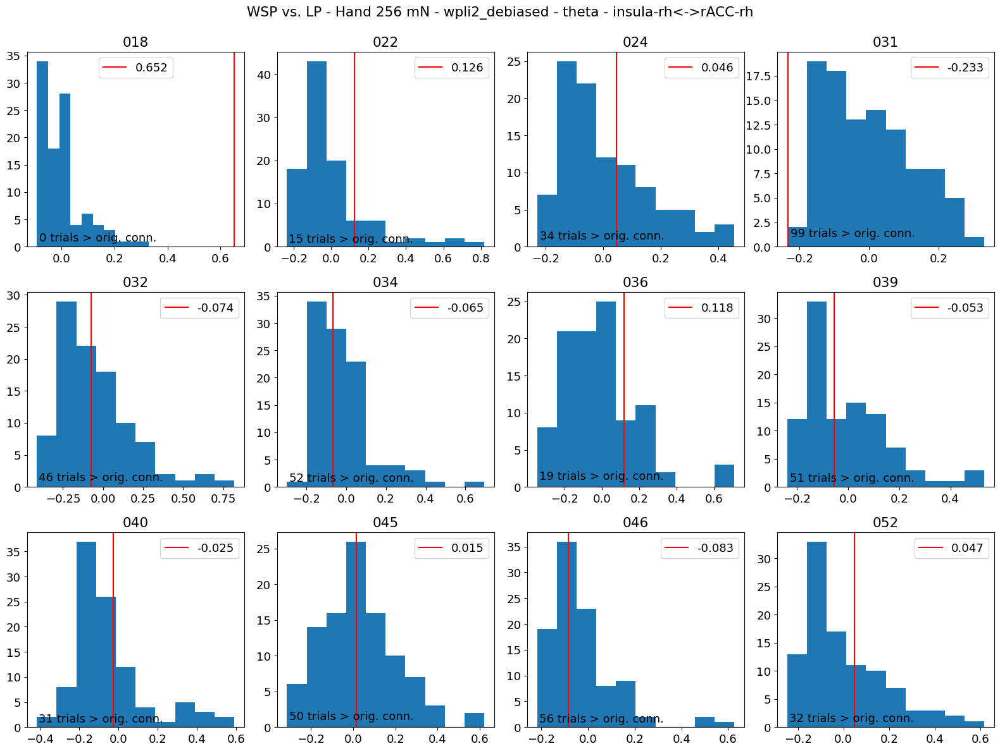

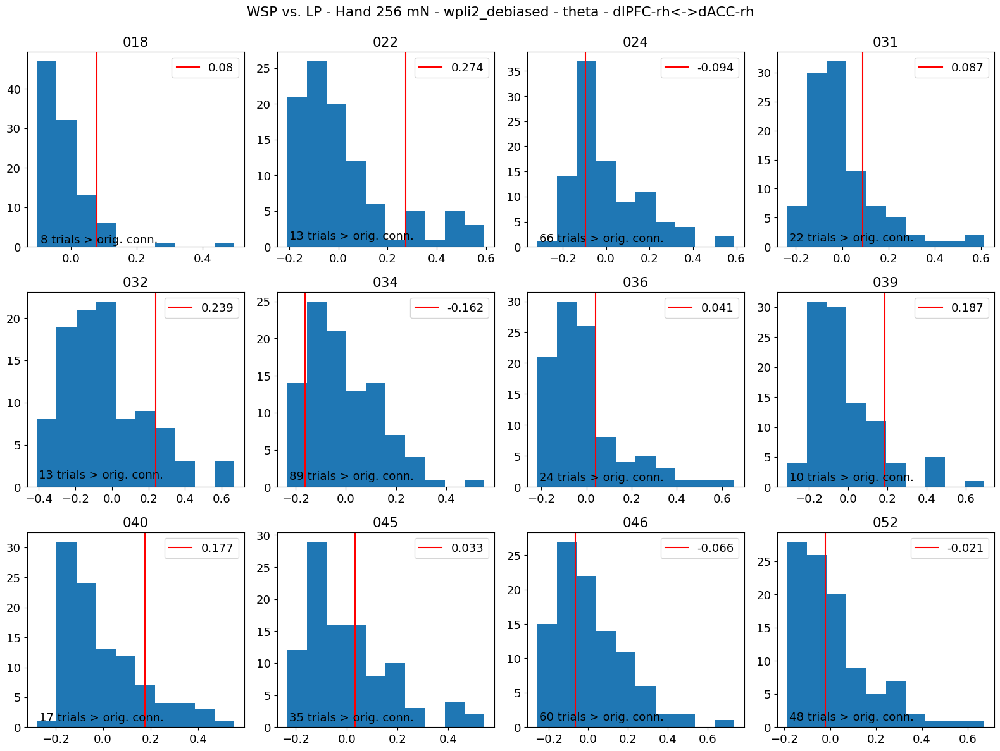

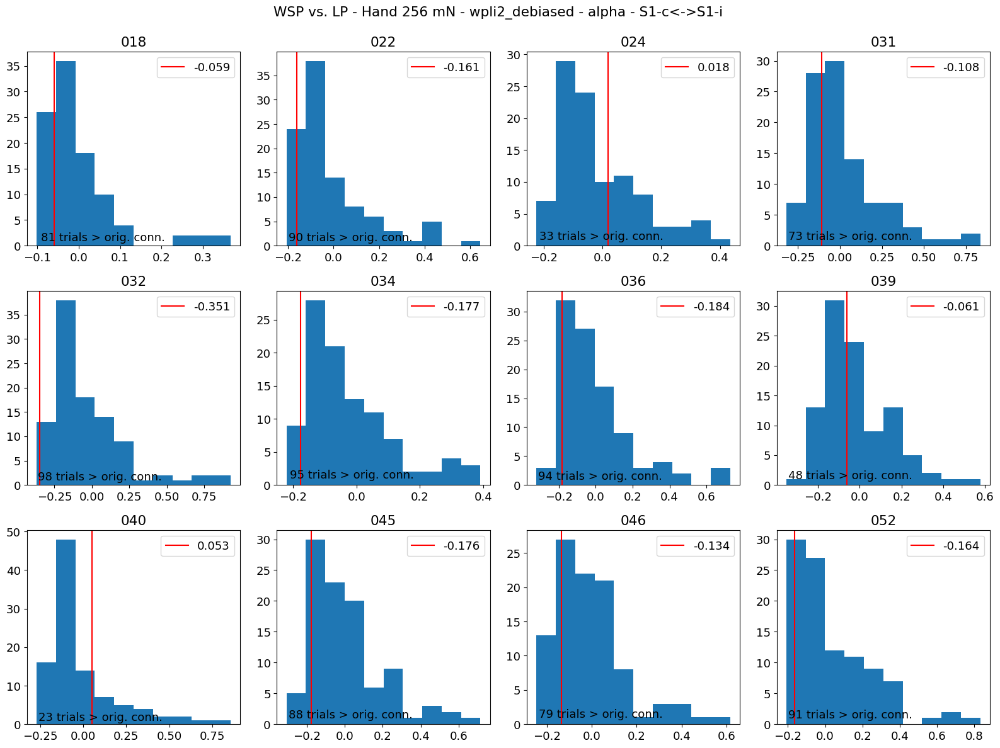

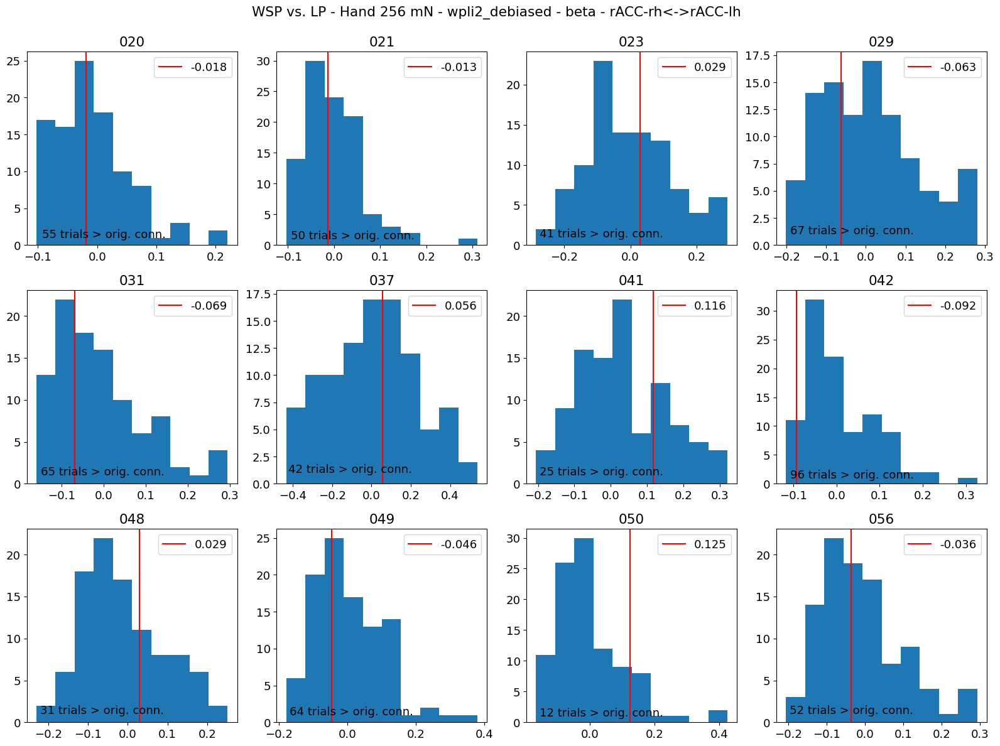

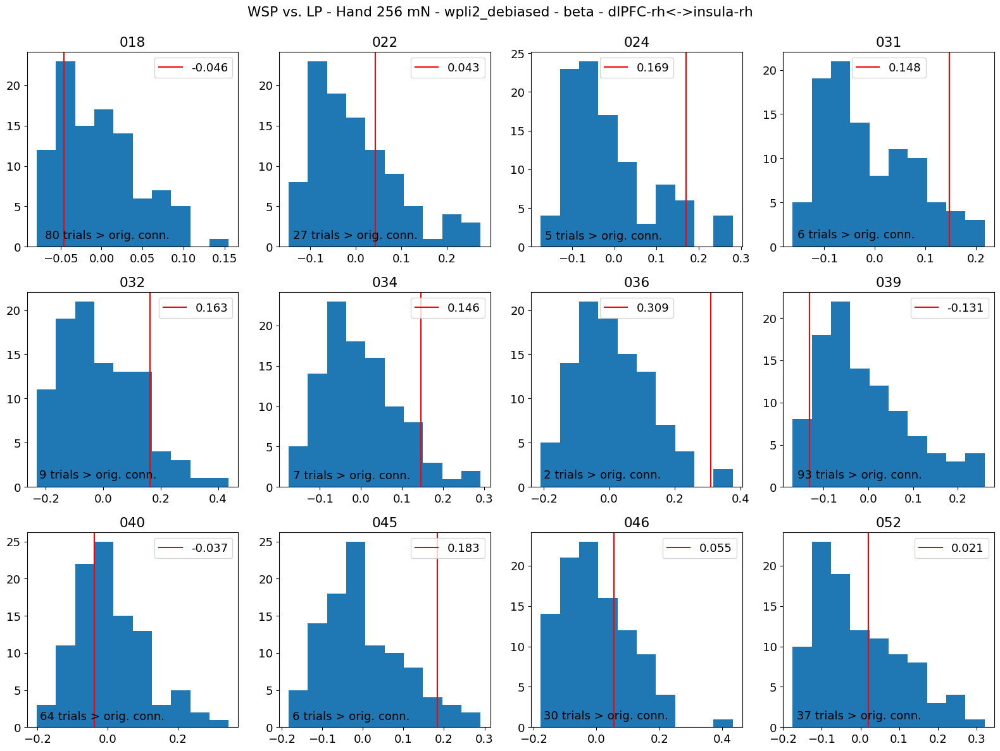

...

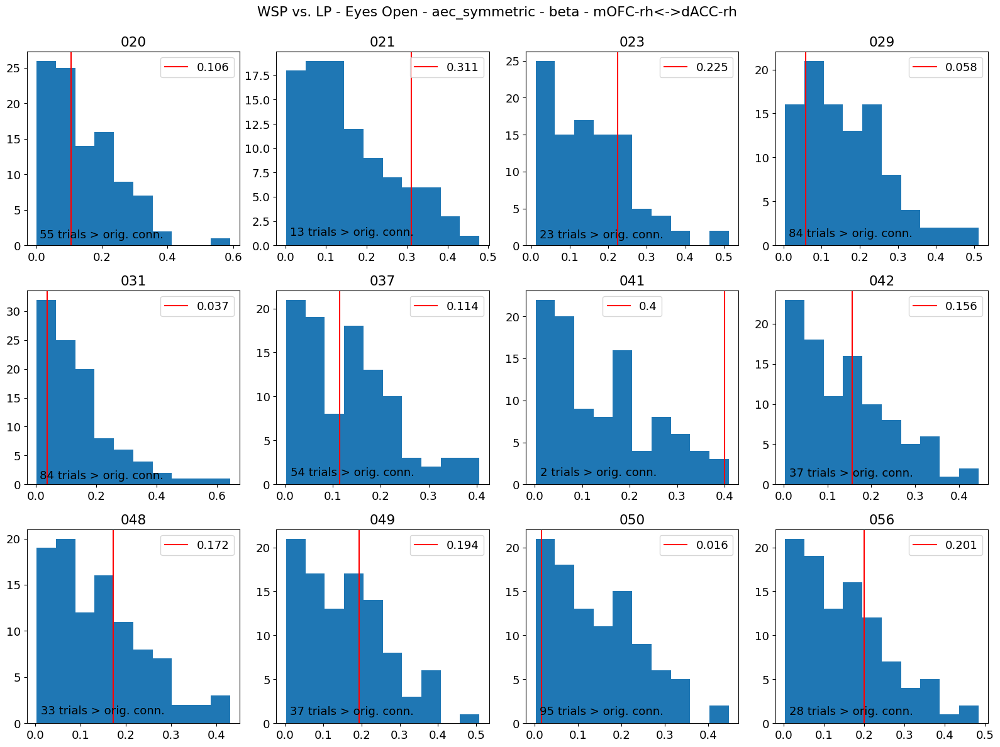

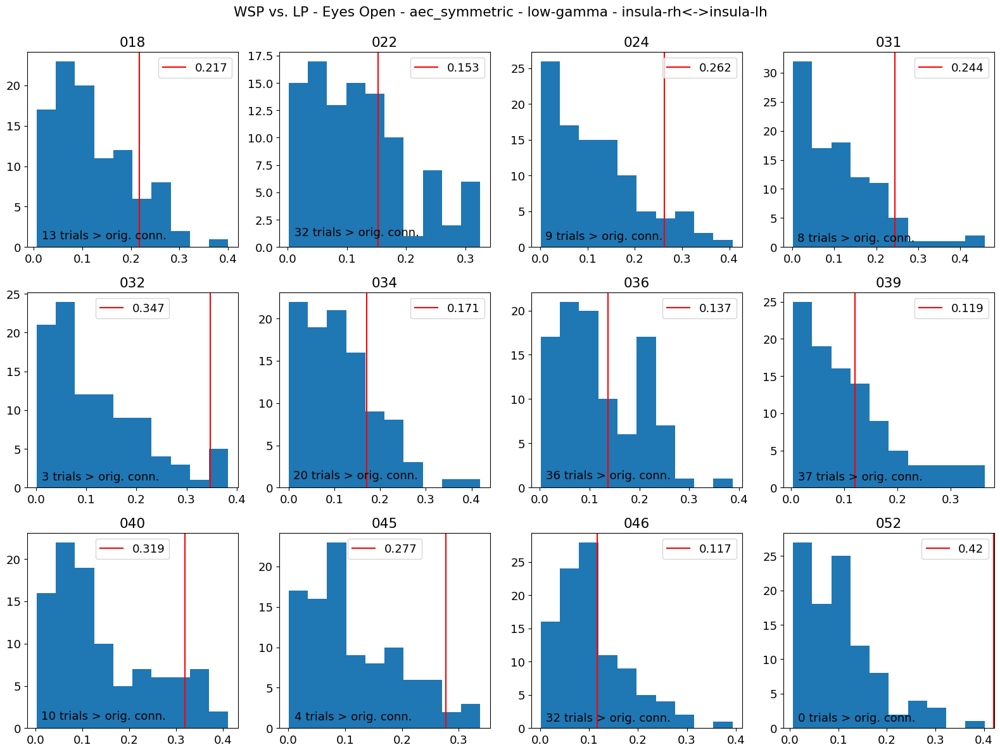

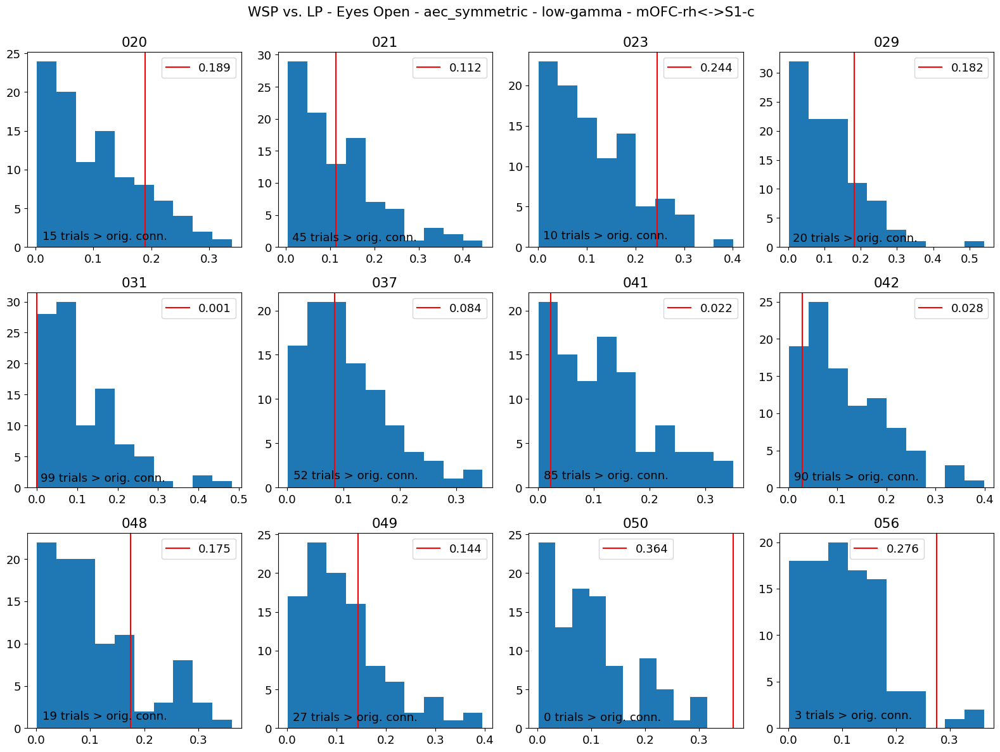

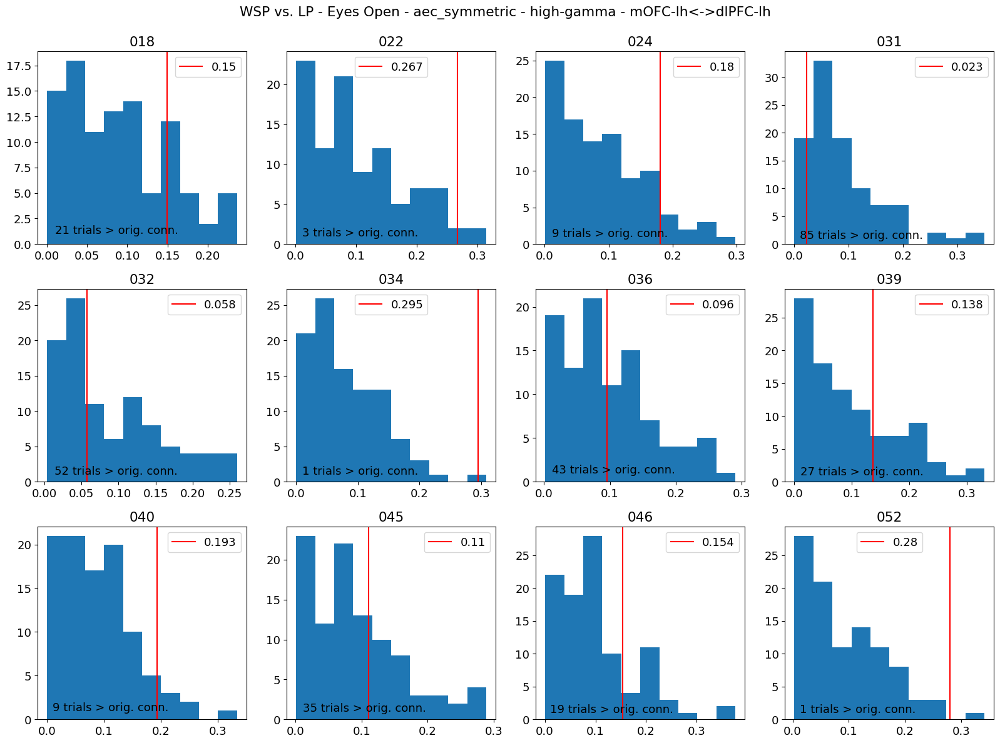

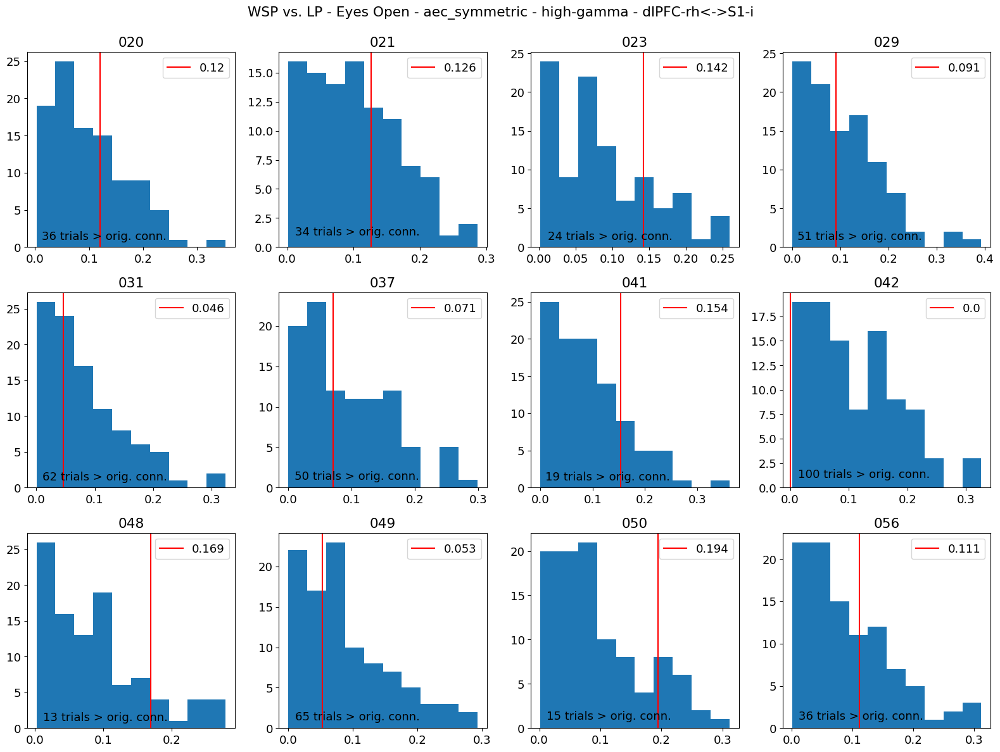

In [ ]:
with PdfPages('WSP_LP_output_figures_bin-num5.pdf') as pdf:
    for condition in conditions:
        for method in con_methods:
            # Ignore some specific condition/method combinations
            if condition=="Hand 256 mN" and "aec" in method:
                continue
            elif condition=="Eyes Open" and method=="wpli2_debiased":
                continue
            for band in band_names:
                temp = new_pvals_WSP_LC[condition][method][band]
                for roi1 in temp.keys():
                    temp2 = temp[roi1]
                    for roi2 in temp2.keys():
                        temp3 = temp2[roi2]

                        plt.figure(figsize=(16,12))
                        plt.suptitle('WSP vs. LP - ' + condition + ' - ' + method + ' - ' + band + ' - ' + roi_acronyms_resting[roi1] + '<->' + roi_acronyms_resting[roi2], y=0.99)
                        count = 1
                        for sub_id in temp3.keys():
                            greater_than = temp3[sub_id][0]
                            orig_conn = temp3[sub_id][1]
                            connectivities = temp3[sub_id][2]
                            connectivities.sort()

                            plt.subplot(3,4,count)
                            plt.title(sub_id)
                            plt.hist(connectivities, 10, (connectivities[0], connectivities[len(connectivities)-1]))
                            plt.axvline(x=orig_conn, color='red', label=round(orig_conn,3))
                            plt.text(connectivities[0]+0.01, 1, str(greater_than)+' trials > orig. conn.')
                            plt.legend()
                            
                            count += 1
                        plt.tight_layout()
                        pdf.savefig()
                        plt.show()
                        plt.close()
